# Import Library

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from glob import glob
import os
import os.path as op
from os import listdir
from os.path import isfile, join

import shutil

In [2]:
from numpy.fft import fft, ifft, fftfreq
from numpy.fft import rfft, irfft, rfftfreq

In [3]:
from scipy import signal
from scipy.signal import butter, sosfiltfilt

# Encode

In [4]:
!mkdir data/

In [5]:
def encode(path, index) :
  with open(path, 'r') as f :
    raw_content = f.readlines()
    raw_content = raw_content[0]

  content = raw_content[raw_content.find('[') + 1 : raw_content.rfind(']')]

  data_list = []

  i = 0

  while i < len(content) :
    idx_open = content.find('[', i)
    idx_close = content.find(']', idx_open)

    if idx_open==-1 or idx_close==-1 : break

    txt = content[idx_open+1 : idx_close]
    row = [float(val) for val in txt.split(',')]

    data_list.append(row)

    i = idx_close + 1

  df = pd.DataFrame(data_list, columns=['roll','pitch','yaw'], index=index)

  return df

In [6]:
SAMPLING_RATE  = 100
DURATION = 10

time_axis = np.linspace(1/SAMPLING_RATE, DURATION, SAMPLING_RATE*DURATION)

print(f"len : {len(time_axis)}")
# print(time_axis)
print(time_axis[:5] , time_axis[-5:])

len : 1000
[0.01 0.02 0.03 0.04 0.05] [ 9.96  9.97  9.98  9.99 10.  ]


# Define Class and Function

## Plot Signal and Compairson

In [7]:
def plot_signal(df, signals = [], units = None, suptitle = 'Signal', figsize=(8,8)) :
  plt.figure(figsize=figsize)
  # plt.suptitle(suptitle)
  plt.subplots_adjust(hspace=0.3)

  for i, signal in enumerate(signals) :
    plt.subplot(len(signals), 1, i+1)
    plt.plot(df[signal])
    plt.title(signal)
    plt.grid(True)
    plt.ylabel(units)
    plt.xticks(np.arange(0, 10, 1))

  return plt.show()

In [8]:
def plot_compare_fourier(fouriers, names = []) :
  n = len(names)
  fig, ax = plt.subplots(n, 2, gridspec_kw={'width_ratios': [5, 3]}, figsize=(20,10))
  plt.tight_layout(h_pad=4)

  for i, fourier in enumerate(fouriers) :
    ax[i,0].plot(fourier.time, fourier.signal)
    ax[i,0].set_title(f'signal {names[i]}')
    ax[i,0].set_ylabel('Degree')
    ax[i,0].set_xlabel('Time(s)')

    ax[i,1].plot(fourier.freq, fourier.amplitudes)
    ax[i,1].set_title(f'spectrum {names[i]}')
    ax[i,0].grid(True)

    ax[i,1].plot(fourier.freq, fourier.amplitudes)
    ax[i,1].set_title(f'spectrum {names[i]}')
    ax[i,1].grid(True)

    ax[i,1].set_xlabel('Frequency (Hz)')
    ax[i,1].set_ylabel('Amplitude (Degree)')

  return plt.show()

## Class Signal

In [9]:
class Signal :
    def __init__(self, amplitude=1, frequency=1, duration=10, sampling_rate=100, phase=0) :
        self.amplitude = amplitude
        self.frequency = frequency
        self.duration = duration
        self.sampling_rate = sampling_rate
        self.cnt = self.sampling_rate * self.duration
        self.phase = phase

        self.time_step = 1 / self.sampling_rate

        self.time_axis = np.linspace(0, duration, self.cnt, endpoint=False)

    def sine(self) :
        """
            a * sin((2pi * f * time) + phase)
        """
        return self.amplitude * np.sin( (2*np.pi * self.frequency * self.time_axis) + self.phase)

    def cosine(self) :
        """
            a * cos((2pi * f * time) + phase)
        """
        return self.amplitude * np.cos( (2*np.pi * self.frequency * self.time_axis) + self.phase)

## Class Fourier

In [10]:
def find_upper_bound(arr, val) :
  if arr[-1] < val : return len(arr)-1

  return np.argwhere(arr >= val).reshape(-1)[0]

In [11]:
class Fourier :
  def __init__(self, signal, sampling_rate, duration) :
    self.signal = np.array(signal)
    self.sampling_rate = sampling_rate
    self.duration = duration

    self.time = np.linspace(1/sampling_rate, duration, len(signal))

    self.freq = self.get_frequencies()
    self.raw_amplitudes = self.get_amplitudes()
    self.amplitudes = self.norm_amplitudes()

  def get_frequencies(self) :
    return rfftfreq(len(self.signal), 1/self.sampling_rate)

  def get_amplitudes(self) :
    return rfft(self.signal)

  def norm_amplitudes(self) :
    return 2*np.abs(self.raw_amplitudes) / len(self.signal)

  def plot(self,cmd = 'signal-spectrum' , start_val = None, end_val = None, figsize = None) :

    if cmd == 'signal-spectrum' :
      if figsize is None : figsize = (8,8)

      plt.subplots(2,1,figsize=figsize)
      plt.subplots_adjust(hspace=0.5)

      plt.subplot(2,1,1)
      plt.plot(self.time, self.signal)
      plt.title('Signal')
      plt.grid(True)
      plt.xlabel('Time (s)')

      plt.subplot(2,1,2)
      plt.plot(self.freq, self.amplitudes)
      plt.title('Spectrum')
      plt.grid(True)
      plt.xlabel('Frequency (Hz)')
      plt.ylabel('Amplitude')

    elif cmd == 'spectrum' :
      if figsize is None : figsize = (8,4)

      if start_val is None :
        start_val = self.freq[0]
        start_idx = 0
      else : start_idx = find_upper_bound(self.freq, start_val)

      if end_val is None :
        end_val = self.freq[-1]
        end_idx = len(self.freq)
      else : end_idx = find_upper_bound(self.freq, end_val)

      plt.figure(figsize=figsize)
      plt.plot(self.freq[start_idx:end_idx+1], self.amplitudes[start_idx:end_idx+1])
      plt.xlabel('Frequency (Hz)')
      plt.ylabel('Amplitude')
      plt.title(f"Spectrum [{start_val}, {end_val}]")
      plt.grid(True)

    elif cmd == 'signal' :
      if figsize is None : figsize = (8,4)

      if start_val is None :
        start_val = self.time[0]
        start_idx = 0
      else : start_idx = find_upper_bound(self.time, start_val)

      if end_val is None :
        end_val = self.time[-1]
        end_idx = len(self.time)
      else : end_idx = find_upper_bound(self.time, end_val)

      plt.figure(figsize=figsize)
      plt.plot(self.time[start_idx:end_idx+1], self.signal[start_idx:end_idx+1])
      plt.xlabel('Time (s)')
      plt.title(f"Signal Plot [{start_val}, {end_val}]")
      plt.grid(True)

  def get_topK(self, k, start_freq = None, end_freq = None) :
    if start_freq is None : start_freq, start_idx = self.freq[0], 0
    else : start_idx = find_upper_bound(self.freq, start_freq)

    if end_freq is None : end_freq, end_idx = self.freq[-1], len(self.freq)-1
    else : end_idx = find_upper_bound(self.freq, end_freq)

    print(f"start_idx : {start_idx}")
    print(f"end_idx : {end_idx}")


    idx = np.argsort(self.amplitudes[start_idx:end_idx+1])[-1:-k-1:-1] + start_idx

    print(idx)

    return self.freq[idx], self.amplitudes[idx]

## Filter

In [12]:
def bandpass(data: np.ndarray, edges: list[float], sample_rate: float, order: int = 5):
    sos = butter(order, edges, 'bandpass', fs=sample_rate, output='sos')
    filtered_data = sosfiltfilt(sos, data)
    return filtered_data

In [13]:
def highpass(data: np.ndarray, cutoff: float, sample_rate: float, order: int = 5):
    sos = butter(order, cutoff, 'highpass', fs=sample_rate, output='sos')
    filtered_data = sosfiltfilt(sos, data)
    return filtered_data

In [14]:
def lowpass(data: np.ndarray, cutoff: float, sample_rate: float, order: int = 5):
    sos = butter(order, cutoff, 'lowpass', fs=sample_rate, output='sos')
    filtered_data = sosfiltfilt(sos, data)
    return filtered_data

# Visual

## Normal1

In [ ]:
normal1_path = 'data/normal1.txt'

df_normal1 = encode(normal1_path, time_axis)

print(f"shape : {df_normal1.shape}")
df_normal1.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-1.998061,4.675098,0.015528
0.02,-2.065535,4.453515,0.038174
0.03,-2.129213,4.221465,0.060338
0.04,-2.190719,3.981033,0.087286
0.05,-2.267598,3.737134,0.120512


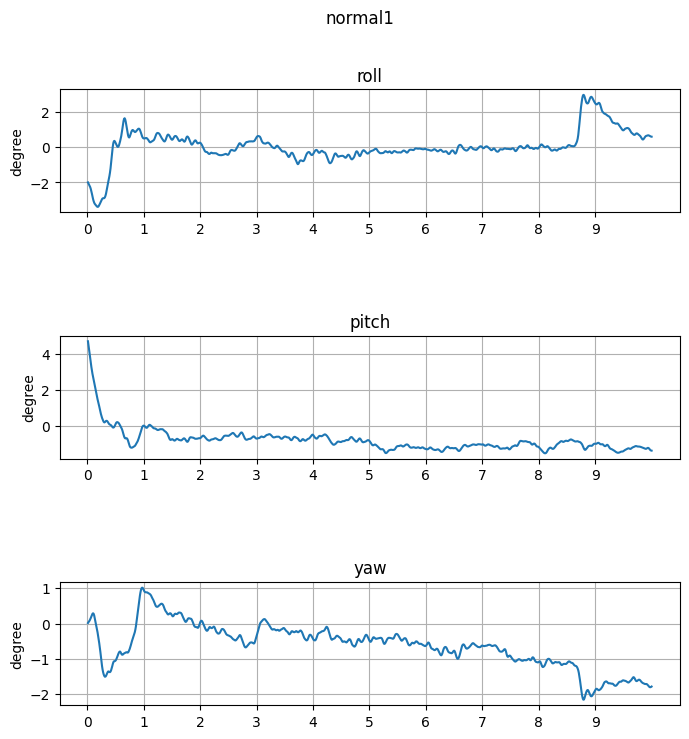

In [ ]:
plot_signal(df_normal1, ['roll', 'pitch', 'yaw'], 'degree', 'normal1')

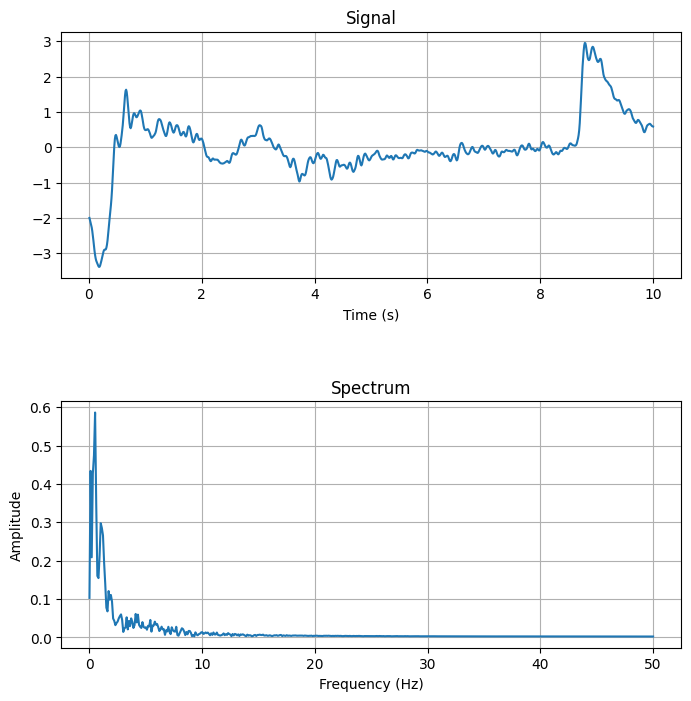

In [ ]:
fourier_normal1_roll = Fourier(df_normal1['roll'], SAMPLING_RATE, DURATION)
fourier_normal1_roll.plot()

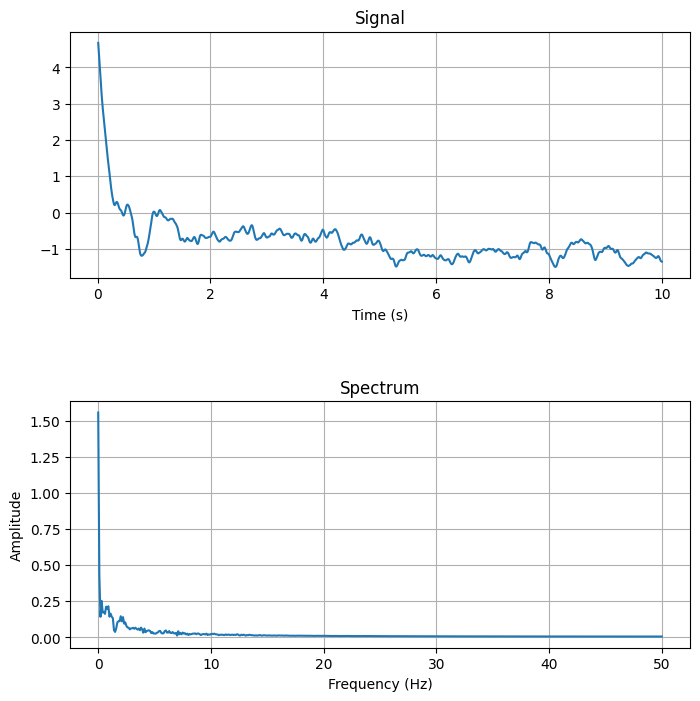

In [ ]:
fourier_normal1_pitch = Fourier(df_normal1['pitch'], SAMPLING_RATE, DURATION)
fourier_normal1_pitch.plot()

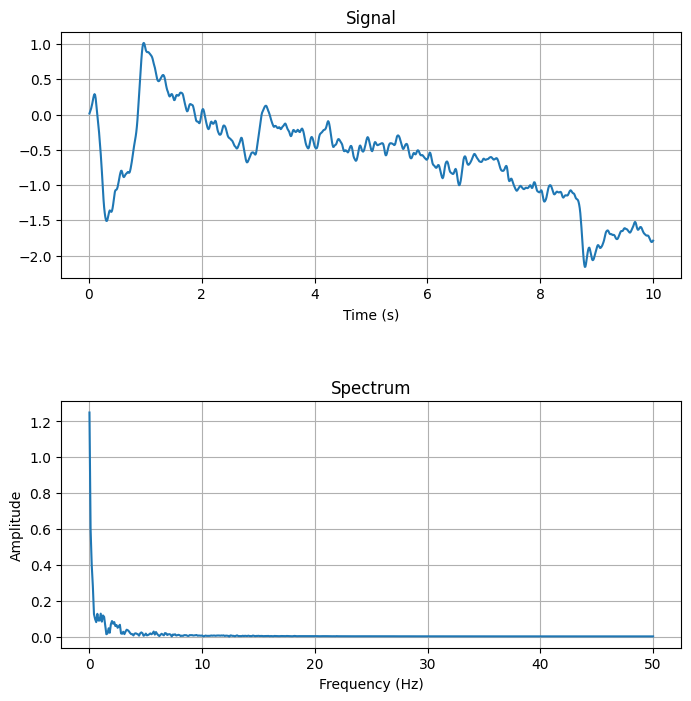

In [ ]:
fourier_normal1_yaw = Fourier(df_normal1['yaw'], SAMPLING_RATE, DURATION)
fourier_normal1_yaw.plot()

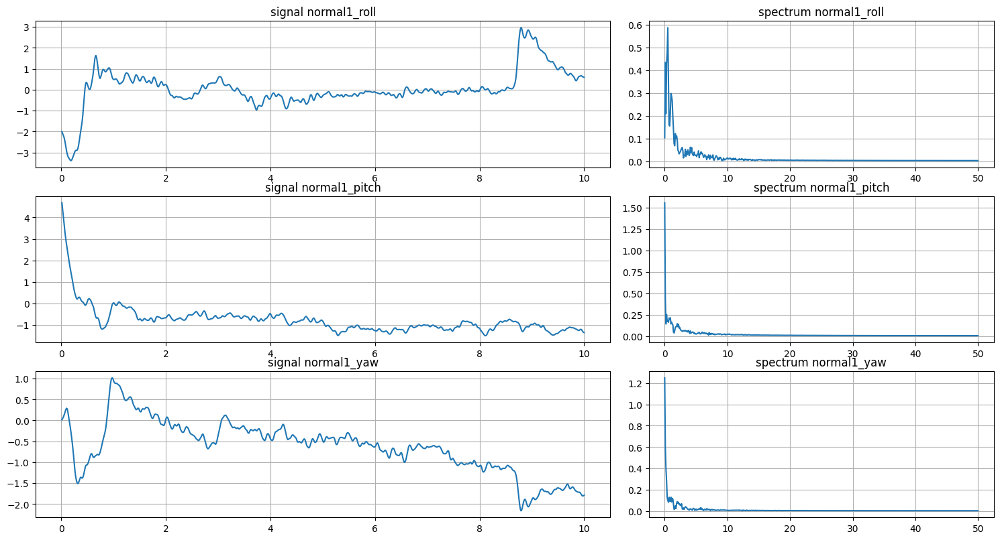

In [ ]:
plot_compare_fourier([fourier_normal1_roll, fourier_normal1_pitch, fourier_normal1_yaw],
                     ['normal1_roll', 'normal1_pitch', 'normal1_yaw'])

## Shake1

In [ ]:
shake1_path = 'data/shake1.txt'

df_shake1 = encode(shake1_path, time_axis)

print(f"shape : {df_shake1.shape}")
df_shake1.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-0.004494,-4.103898,-0.036569
0.02,-0.120249,-4.046378,-0.071895
0.03,-0.269349,-3.986771,-0.108081
0.04,-0.422424,-3.935897,-0.150380
0.05,-0.539845,-3.904930,-0.205203


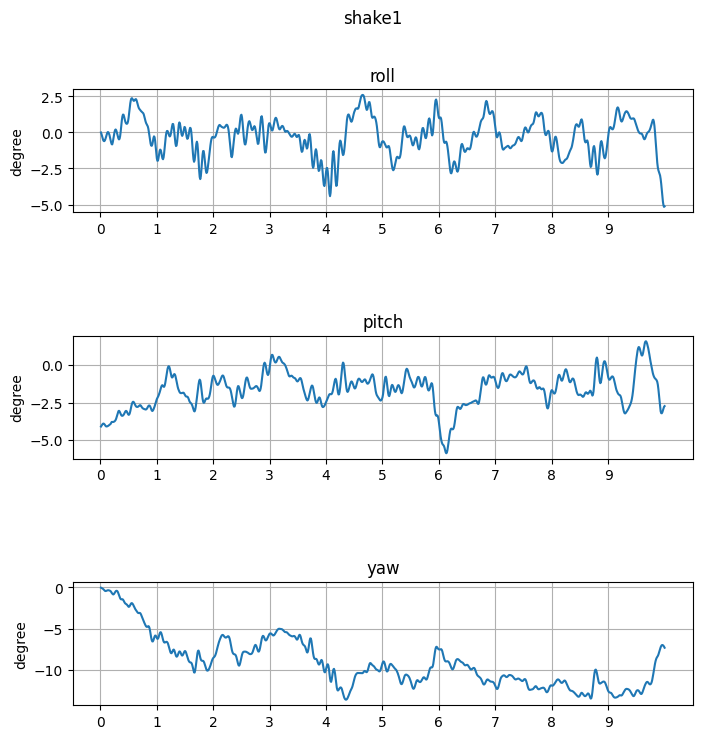

In [ ]:
plot_signal(df_shake1, ['roll', 'pitch', 'yaw'], 'degree', 'shake1')

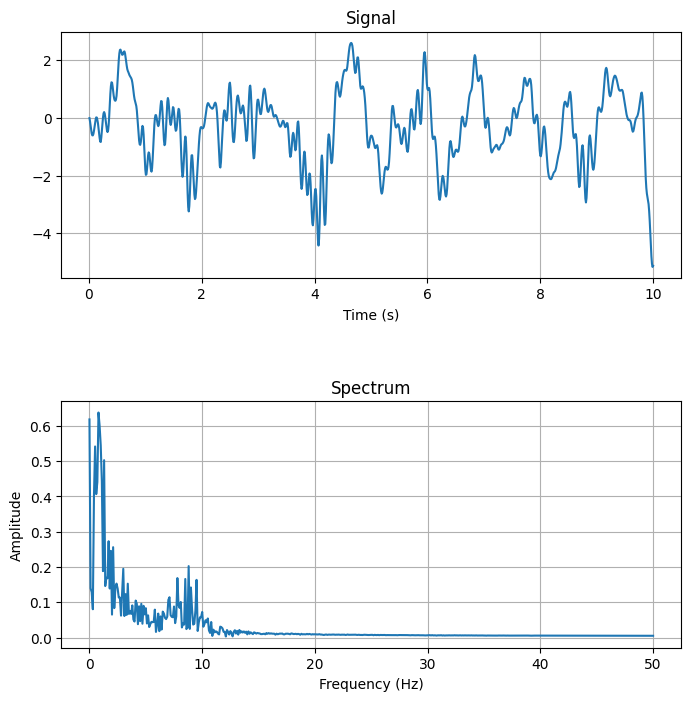

In [ ]:
fourier_shake1_roll = Fourier(df_shake1['roll'], SAMPLING_RATE, DURATION)
fourier_shake1_roll.plot()

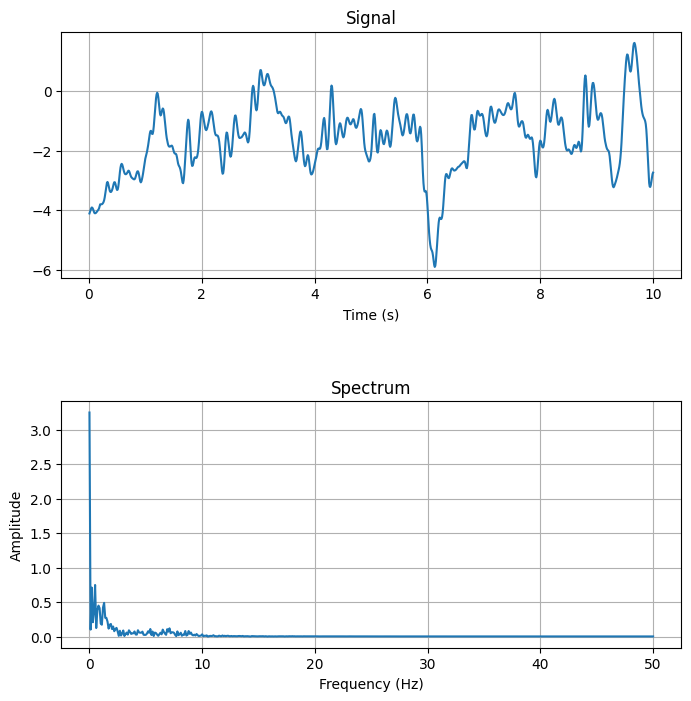

In [ ]:
fourier_shake1_pitch = Fourier(df_shake1['pitch'], SAMPLING_RATE, DURATION)
fourier_shake1_pitch.plot()

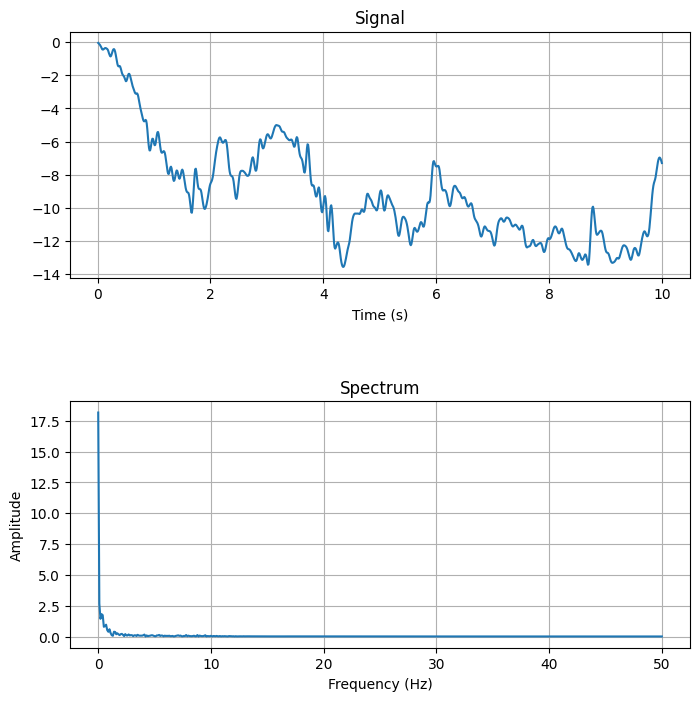

In [ ]:
fourier_shake1_yaw = Fourier(df_shake1['yaw'], SAMPLING_RATE, DURATION)
fourier_shake1_yaw.plot()

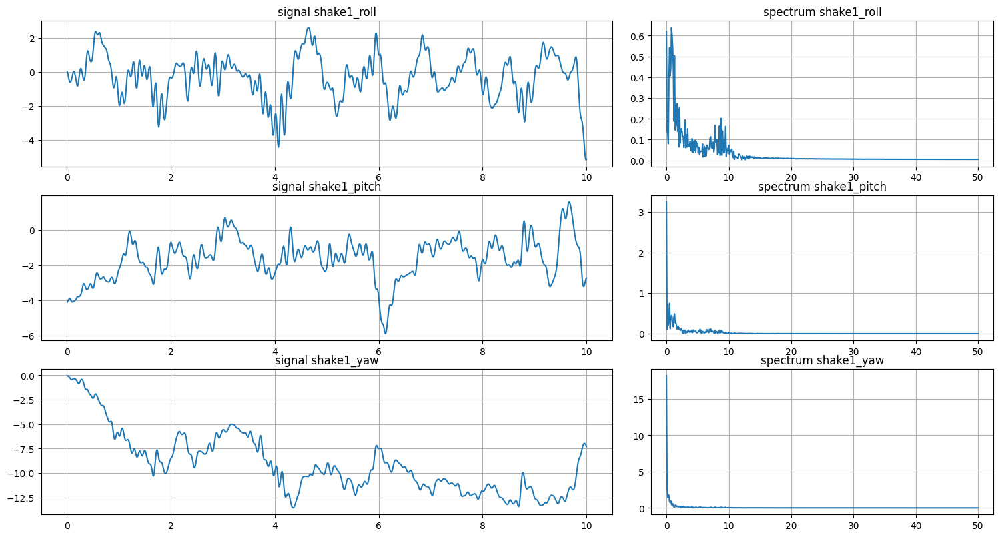

In [ ]:
plot_compare_fourier([fourier_shake1_roll, fourier_shake1_pitch, fourier_shake1_yaw],
                     ['shake1_roll', 'shake1_pitch', 'shake1_yaw'])

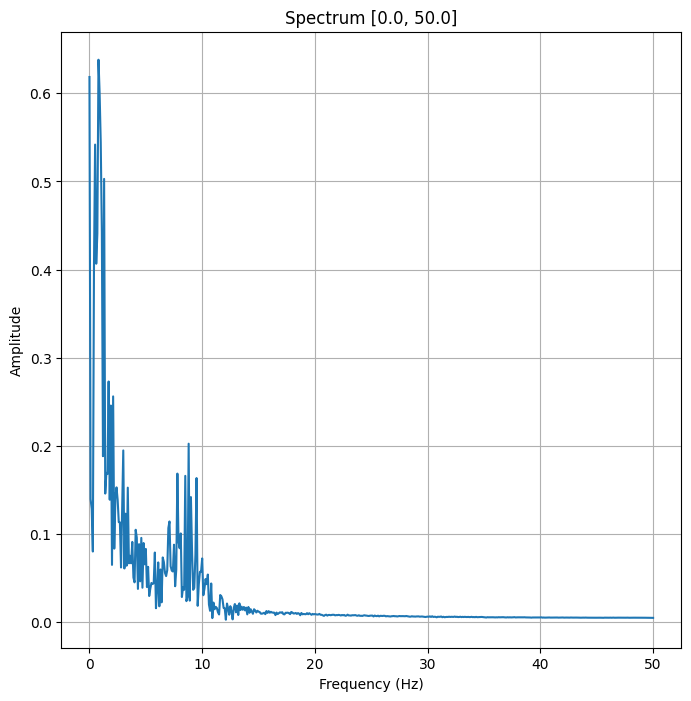

In [ ]:
fourier_shake1_roll.plot('spectrum')

## Normal2

In [ ]:
normal2_path = 'data/normal2.txt'

df_normal2 = encode(normal2_path, time_axis)

print(f"shape : {df_normal2.shape}")
df_normal2.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-0.618888,1.475037,0.047996
0.02,-0.345051,0.726865,0.268870
0.03,-0.061263,-0.248528,0.649756
0.04,0.136253,-1.127889,1.034302
0.05,0.310252,-1.819974,1.370443


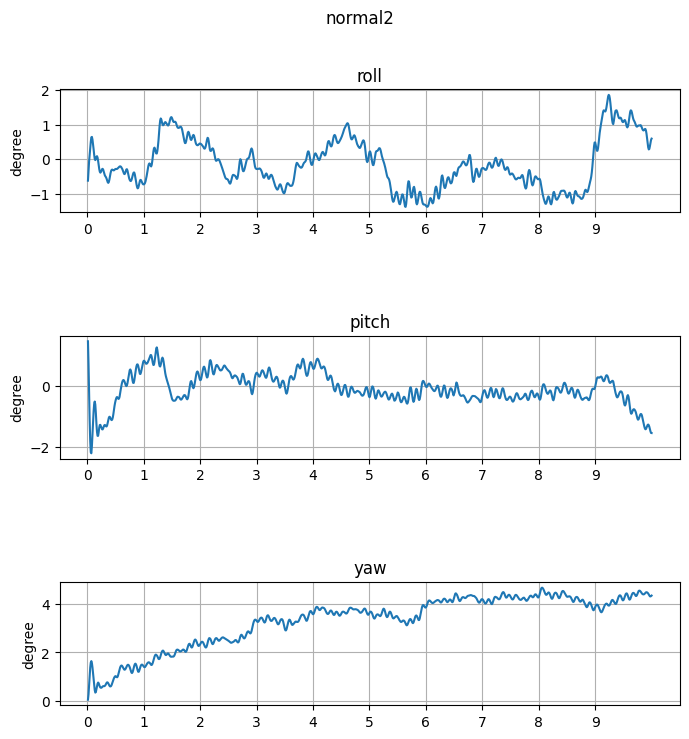

In [ ]:
plot_signal(df_normal2, ['roll', 'pitch', 'yaw'], 'degree', 'normal2')

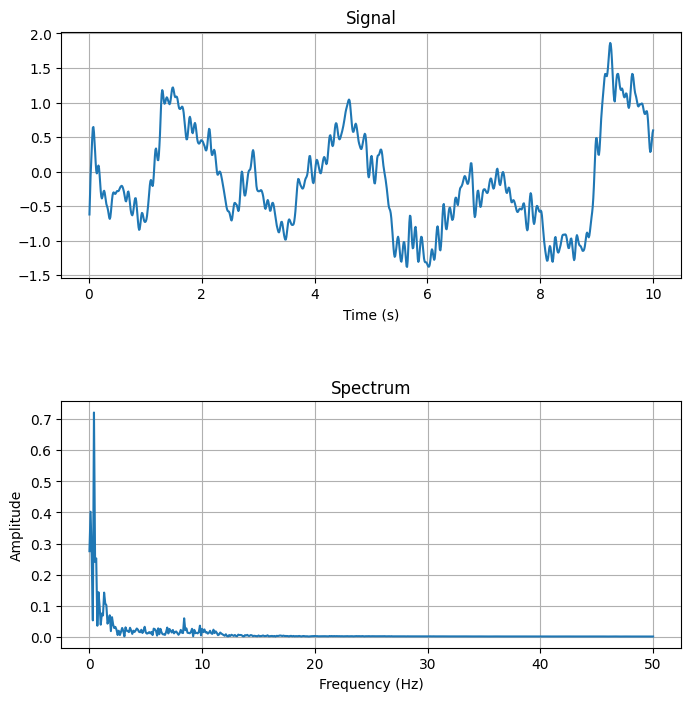

In [ ]:
fourier_normal2_roll = Fourier(df_normal2['roll'], SAMPLING_RATE, DURATION)
fourier_normal2_roll.plot()

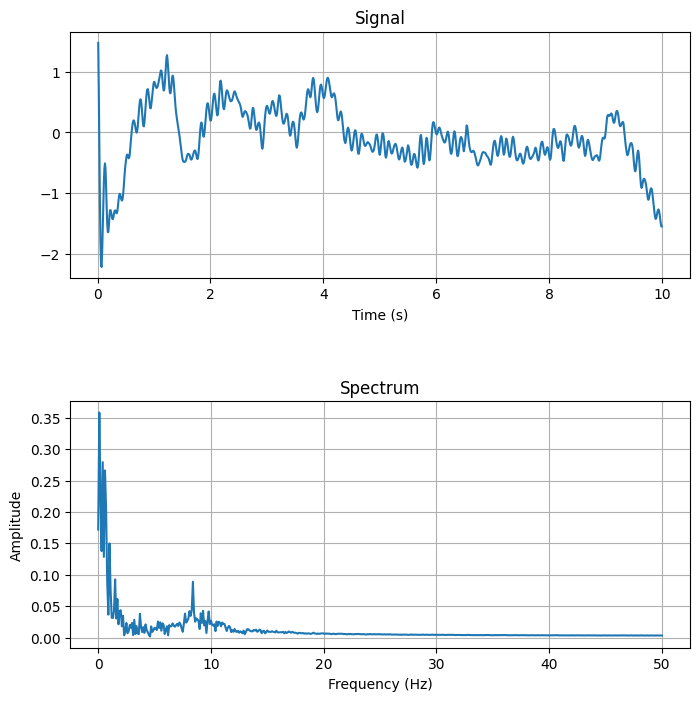

In [ ]:
fourier_normal2_pitch = Fourier(df_normal2['pitch'], SAMPLING_RATE, DURATION)
fourier_normal2_pitch.plot()

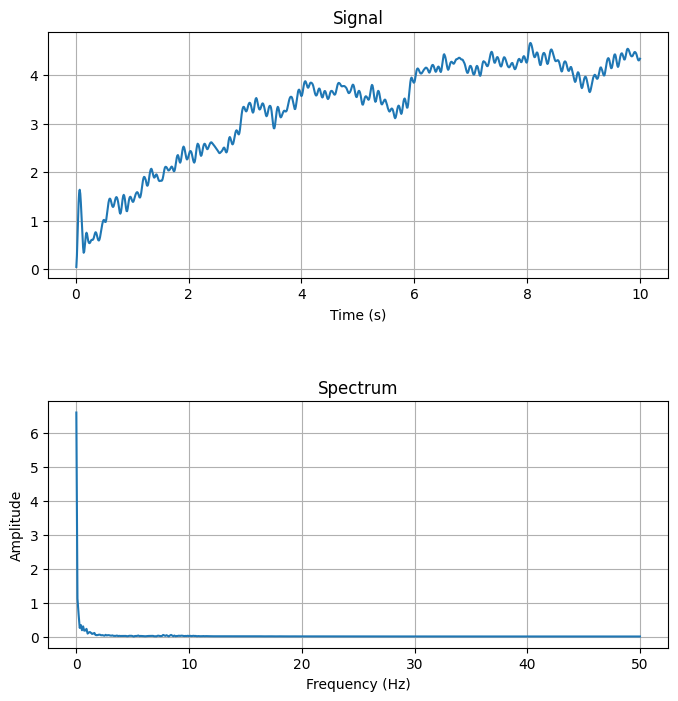

In [ ]:
fourier_normal2_yaw = Fourier(df_normal2['yaw'], SAMPLING_RATE, DURATION)
fourier_normal2_yaw.plot()

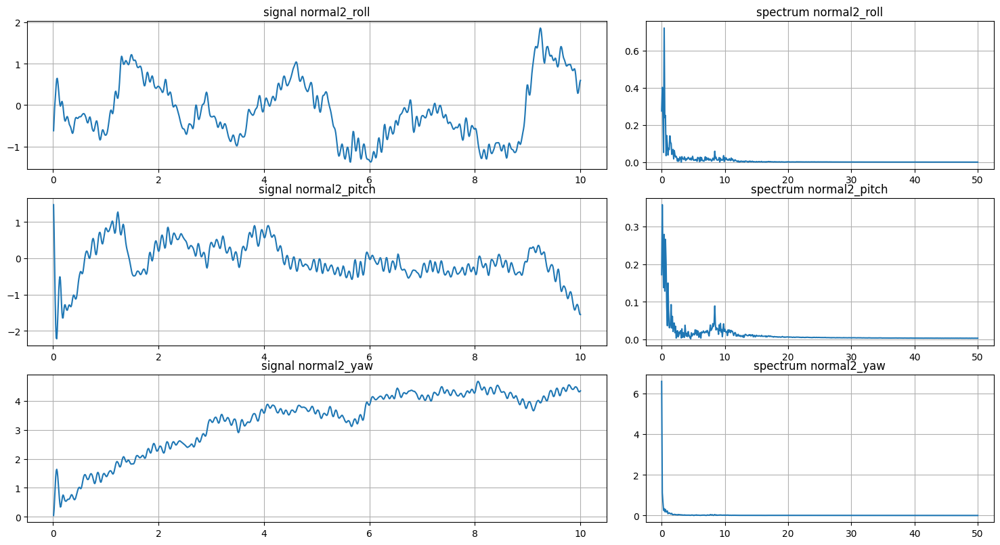

In [ ]:
plot_compare_fourier([fourier_normal2_roll, fourier_normal2_pitch, fourier_normal2_yaw],
                     ['normal2_roll', 'normal2_pitch', 'normal2_yaw'])

## Normal3

In [ ]:
normal3_path = 'data/normal3.txt'

df_normal3 = encode(normal3_path, time_axis)

print(f"shape : {df_normal3.shape}")
df_normal3.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-4.695903,-2.975794,36.066901
0.02,-4.279963,-3.124033,35.996581
0.03,-3.895338,-3.178198,35.896023
0.04,-3.589409,-3.188590,35.799615
0.05,-3.363618,-3.186902,35.723322


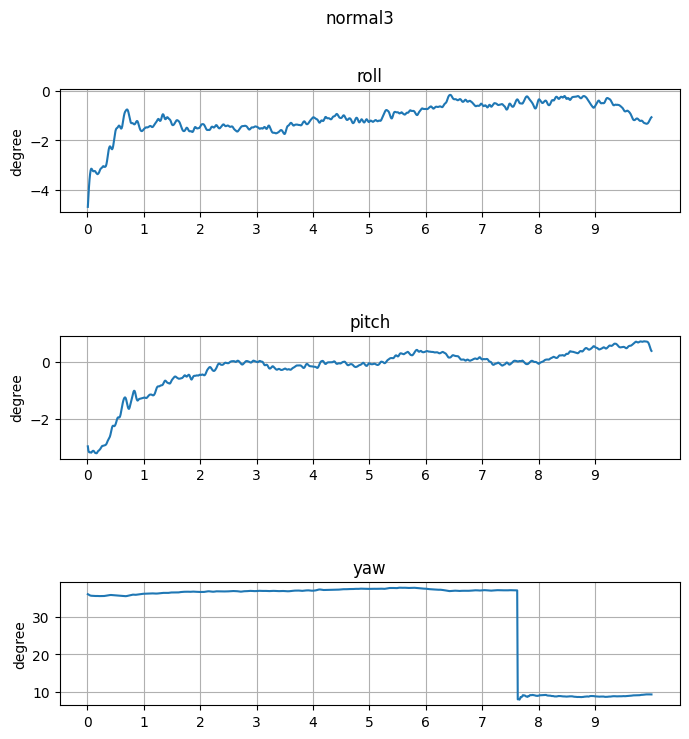

In [ ]:
plot_signal(df_normal3, ['roll', 'pitch', 'yaw'], 'degree', 'normal3')

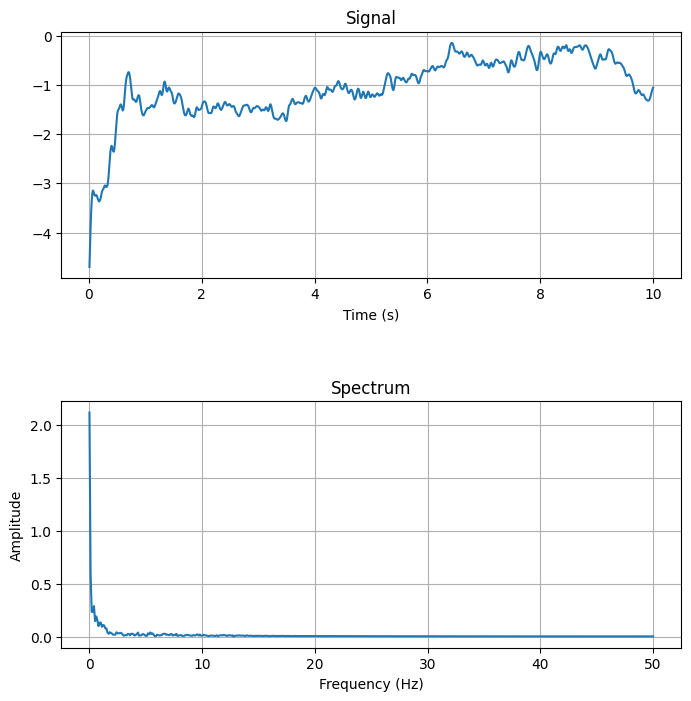

In [ ]:
fourier_normal3_roll = Fourier(df_normal3['roll'], SAMPLING_RATE, DURATION)
fourier_normal3_roll.plot()

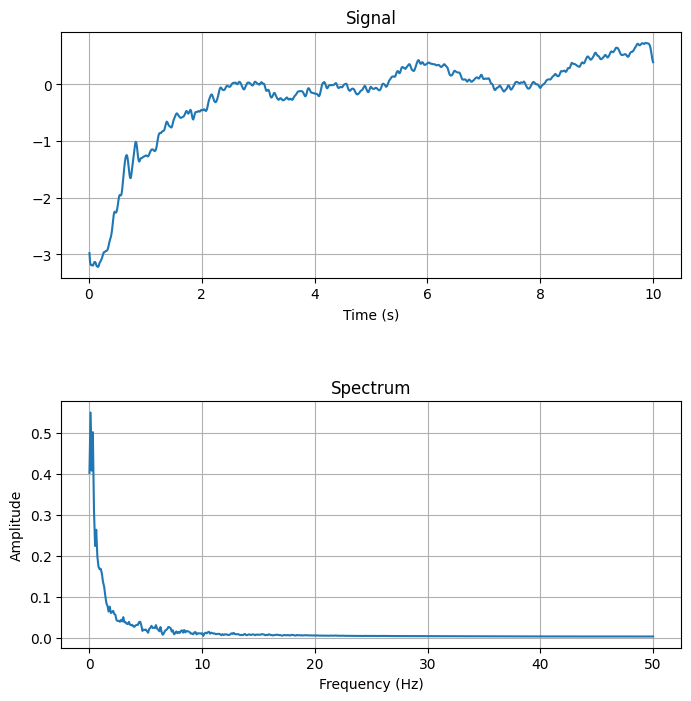

In [ ]:
fourier_normal3_pitch = Fourier(df_normal3['pitch'], SAMPLING_RATE, DURATION)
fourier_normal3_pitch.plot()

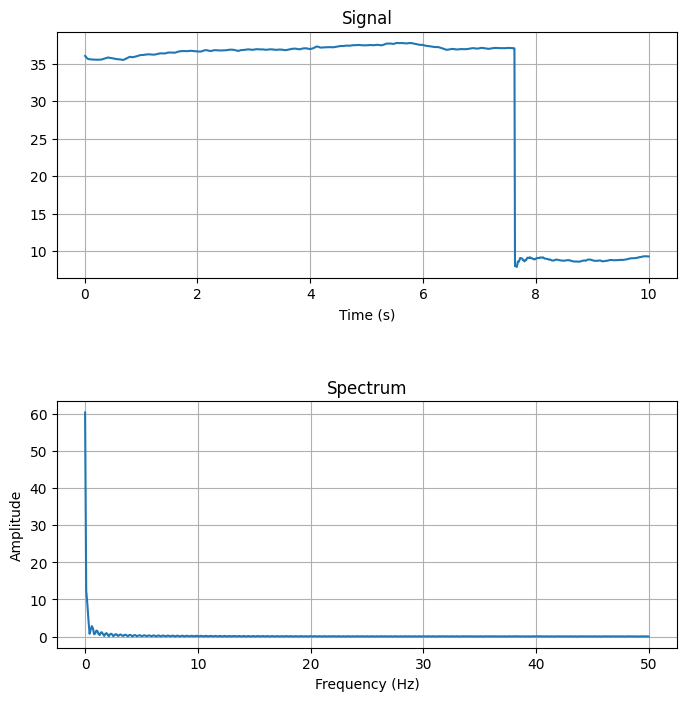

In [ ]:
fourier_normal3_yaw = Fourier(df_normal3['yaw'], SAMPLING_RATE, DURATION)
fourier_normal3_yaw.plot()

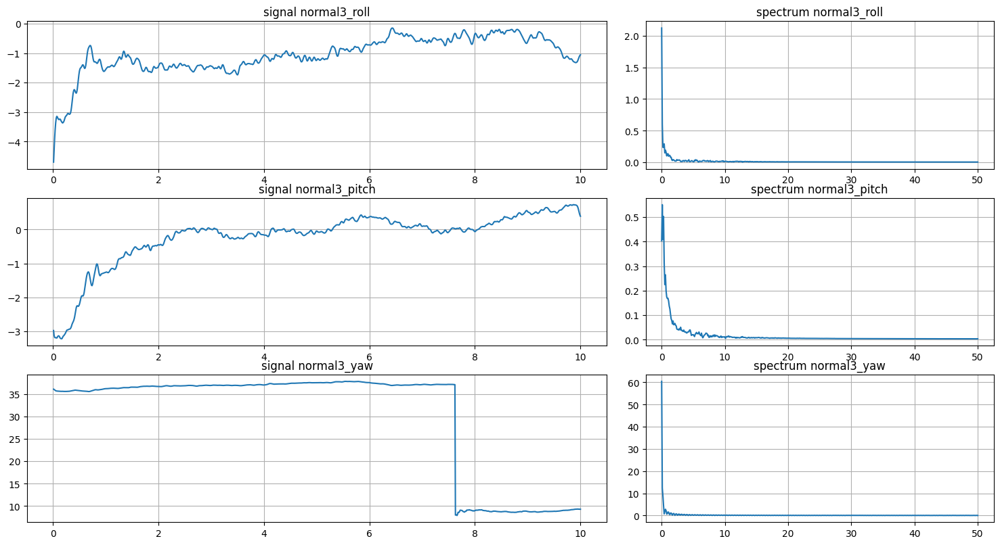

In [ ]:
plot_compare_fourier([fourier_normal3_roll, fourier_normal3_pitch, fourier_normal3_yaw],
                     ['normal3_roll', 'normal3_pitch', 'normal3_yaw'])

## Normal4

In [ ]:
normal4_path = 'data/normal4.txt'

df_normal4 = encode(normal4_path, time_axis)

print(f"shape : {df_normal4.shape}")
df_normal4.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-0.408230,0.548281,-0.256364
0.02,-0.100559,0.698274,-0.407431
0.03,-0.009112,0.835622,-0.450731
0.04,-0.076802,1.023672,-0.442262
0.05,-0.226780,1.331975,-0.456059


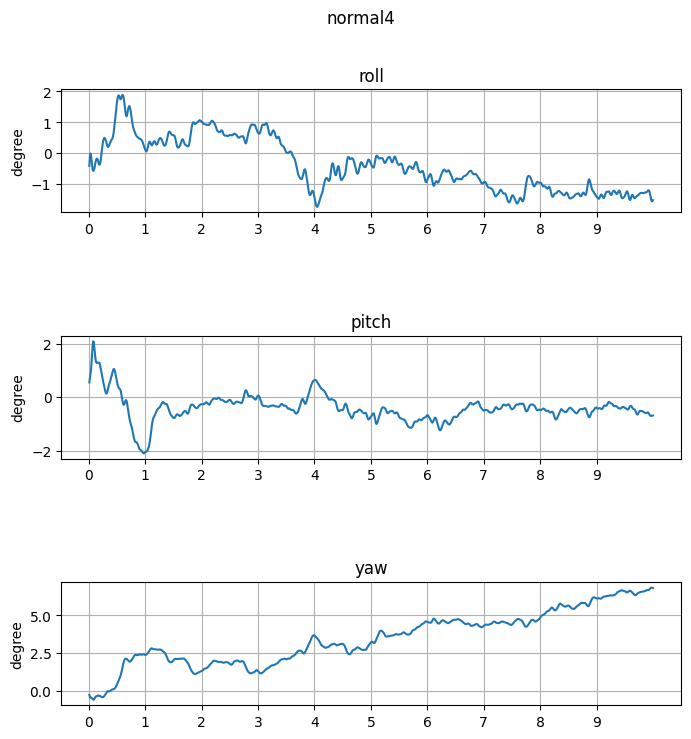

In [ ]:
plot_signal(df_normal4, ['roll', 'pitch', 'yaw'], 'degree', 'normal4')

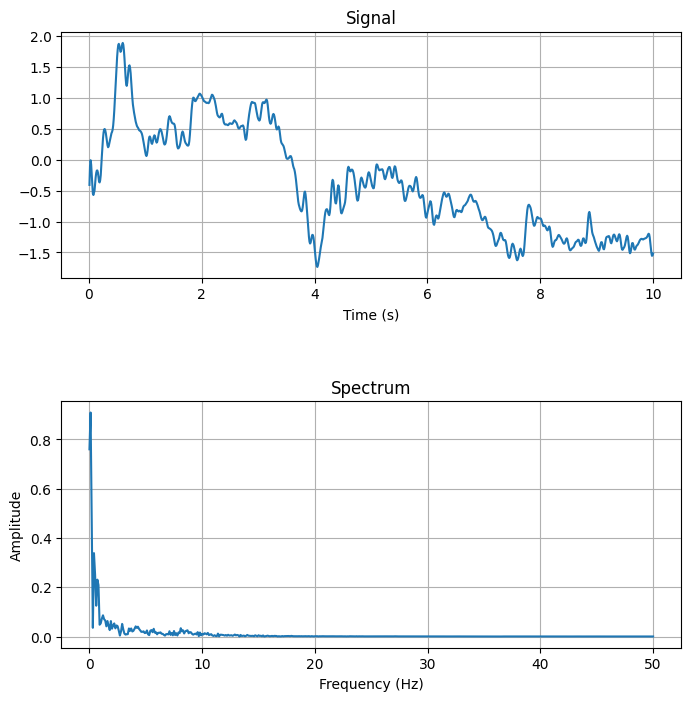

In [ ]:
fourier_normal4_roll = Fourier(df_normal4['roll'], SAMPLING_RATE, DURATION)
fourier_normal4_roll.plot()

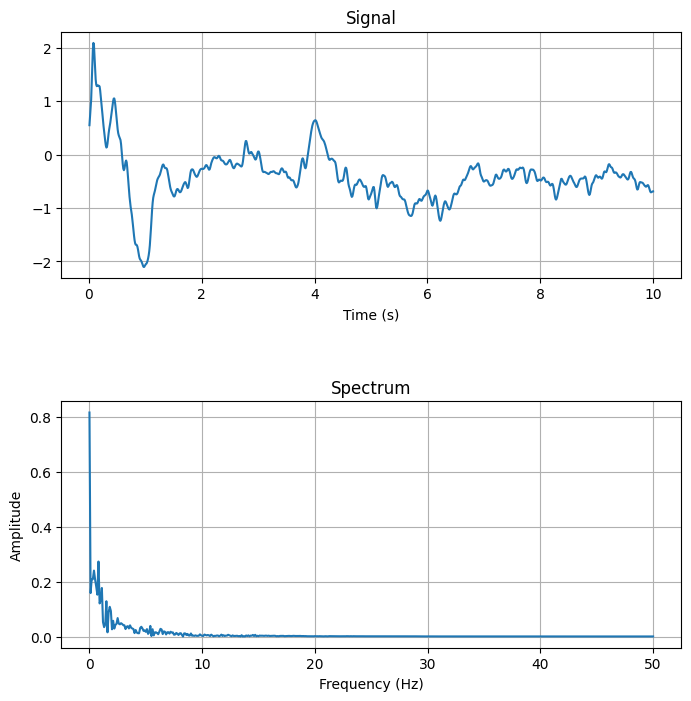

In [ ]:
fourier_normal4_pitch = Fourier(df_normal4['pitch'], SAMPLING_RATE, DURATION)
fourier_normal4_pitch.plot()

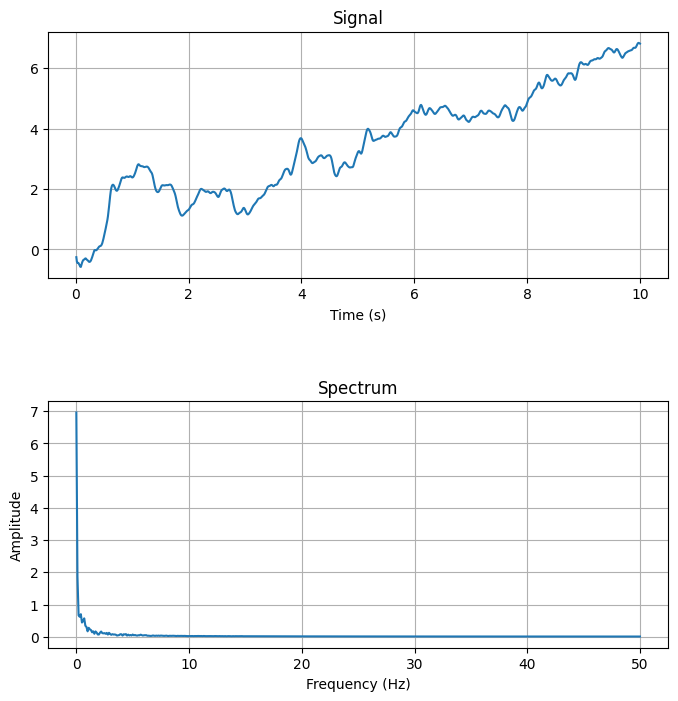

In [ ]:
fourier_normal4_yaw = Fourier(df_normal4['yaw'], SAMPLING_RATE, DURATION)
fourier_normal4_yaw.plot()

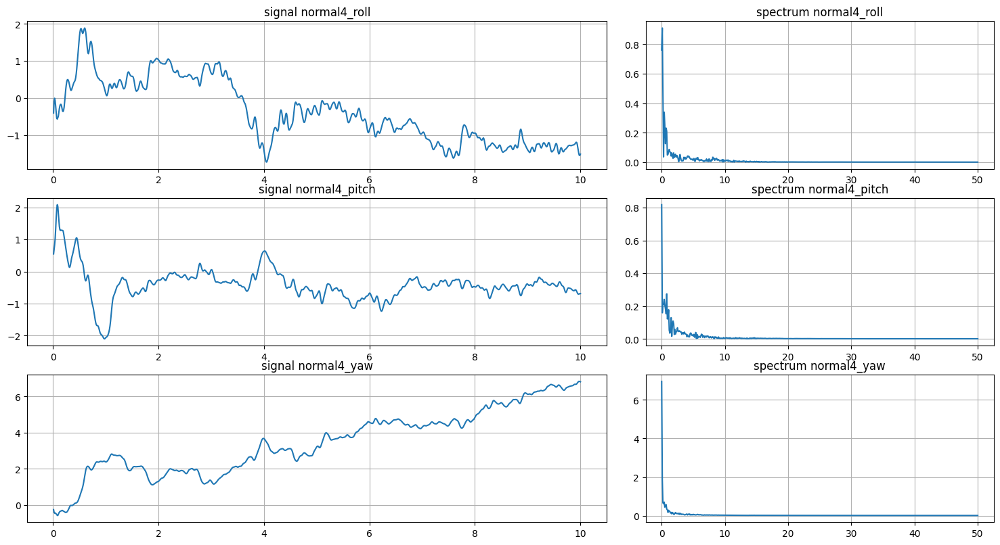

In [ ]:
plot_compare_fourier([fourier_normal4_roll, fourier_normal4_pitch, fourier_normal4_yaw],
                     ['normal4_roll', 'normal4_pitch', 'normal4_yaw'])

## Shake2

In [ ]:
shake2_path = 'data/shake2.txt'

df_shake2 = encode(shake2_path, time_axis)

print(f"shape : {df_shake2.shape}")
df_shake2.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,35.559877,-37.700510,-9.889376
0.02,30.285182,-35.445414,-22.632542
0.03,23.724052,-31.788633,-37.578130
0.04,16.701537,-26.631884,-52.462956
0.05,9.026464,-19.750969,-67.219887


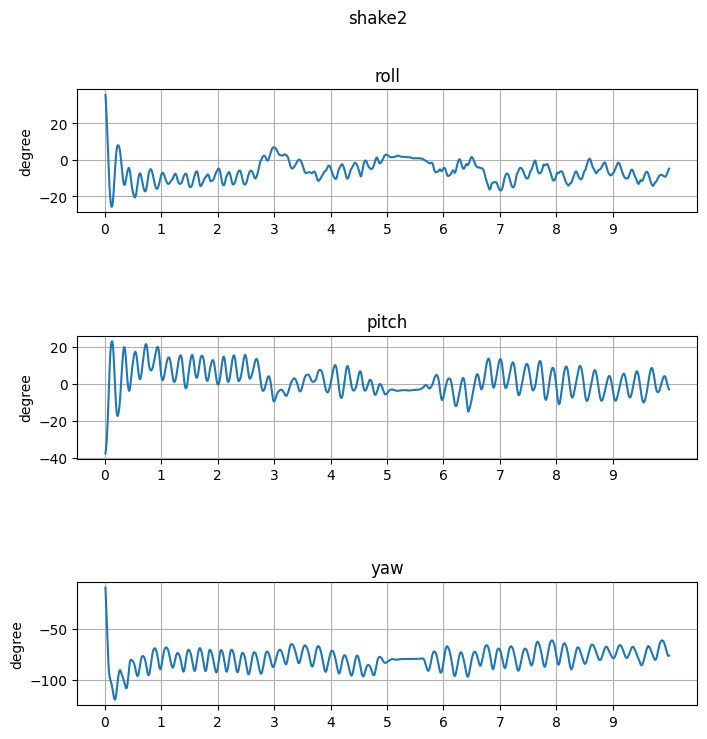

In [ ]:
plot_signal(df_shake2, ['roll', 'pitch', 'yaw'], 'degree', 'shake2')

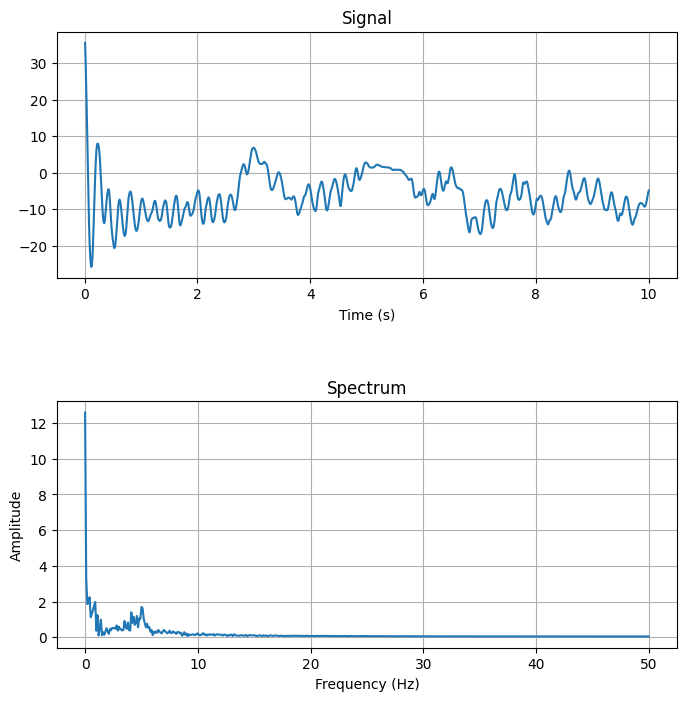

In [ ]:
fourier_shake2_roll = Fourier(df_shake2['roll'], SAMPLING_RATE, DURATION)
fourier_shake2_roll.plot()

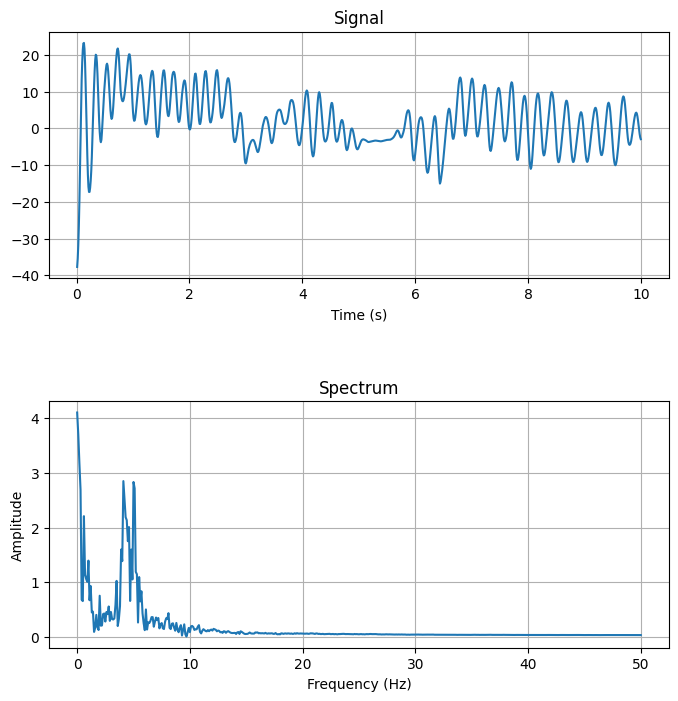

In [ ]:
fourier_shake2_pitch = Fourier(df_shake2['pitch'], SAMPLING_RATE, DURATION)
fourier_shake2_pitch.plot()

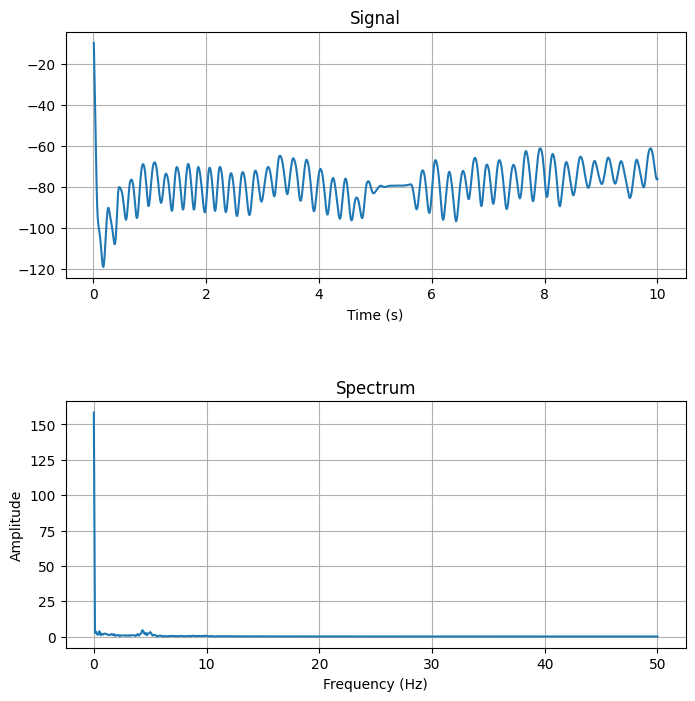

In [ ]:
fourier_shake2_yaw = Fourier(df_shake2['yaw'], SAMPLING_RATE, DURATION)
fourier_shake2_yaw.plot()

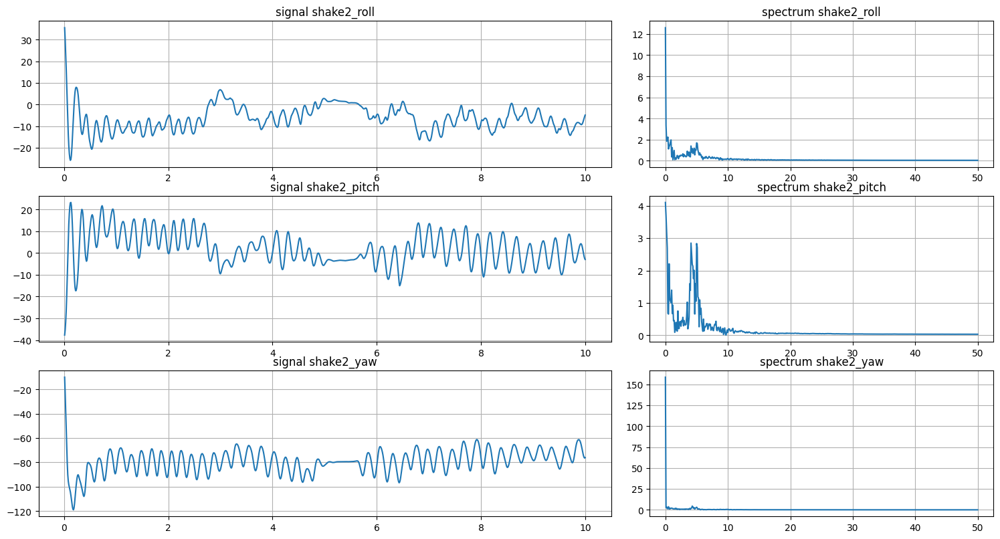

In [ ]:
plot_compare_fourier([fourier_shake2_roll, fourier_shake2_pitch, fourier_shake2_yaw],
                     ['shake2_roll', 'shake2_pitch', 'shake2_yaw'])

## Pat1

In [ ]:
pat1_path = 'data/pat1.txt'

df_pat1 = encode(pat1_path, time_axis)

print(f"shape : {df_pat1.shape}")
df_pat1.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,0.544828,8.262479,0.069632
0.02,0.442845,8.171853,0.138861
0.03,0.317246,8.077390,0.203456
0.04,0.182733,7.983330,0.258818
0.05,0.052438,7.884703,0.305359


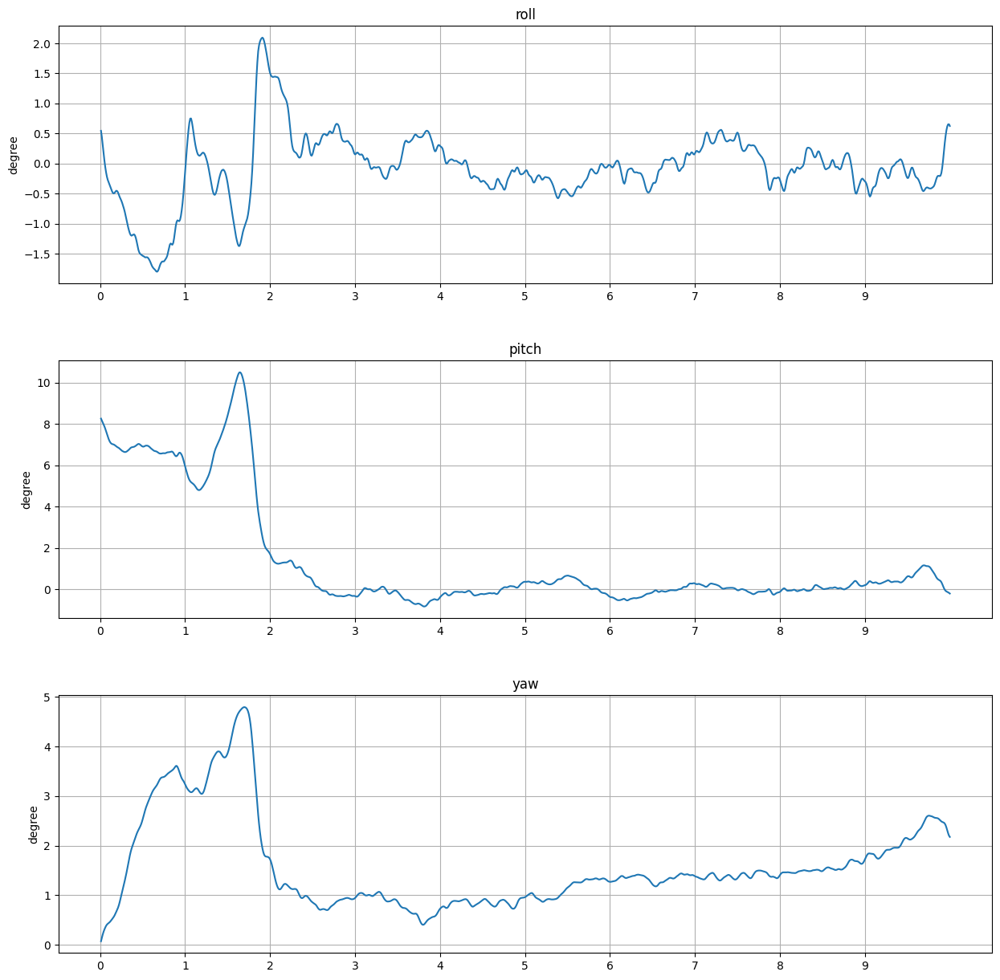

In [ ]:
plot_signal(df_pat1, ['roll', 'pitch', 'yaw'], 'degree', 'pat1', figsize=(15,15))

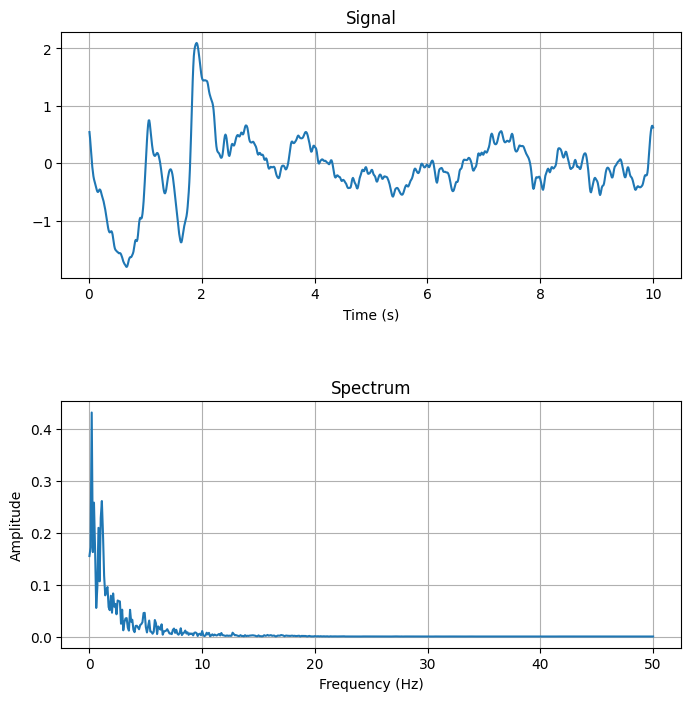

In [ ]:
fourier_pat1_roll = Fourier(df_pat1['roll'], SAMPLING_RATE, DURATION)
fourier_pat1_roll.plot()

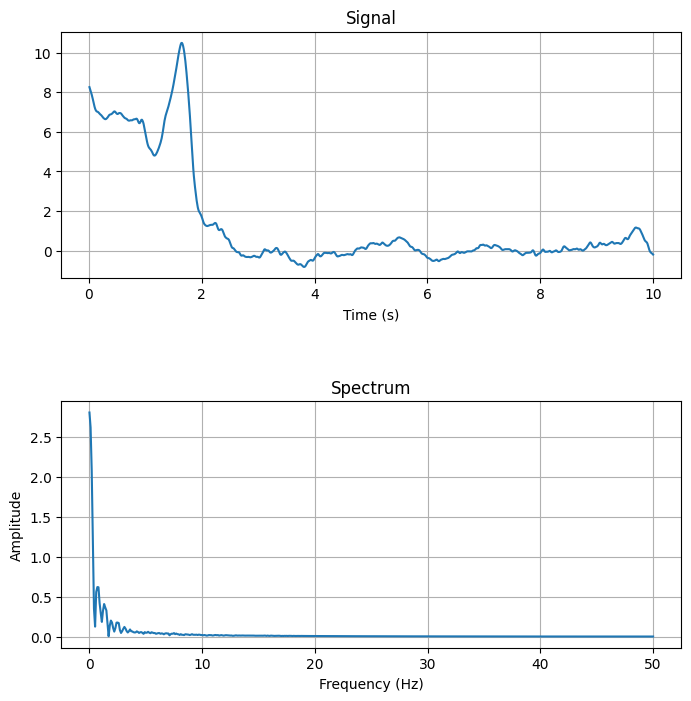

In [ ]:
fourier_pat1_pitch = Fourier(df_pat1['pitch'], SAMPLING_RATE, DURATION)
fourier_pat1_pitch.plot()

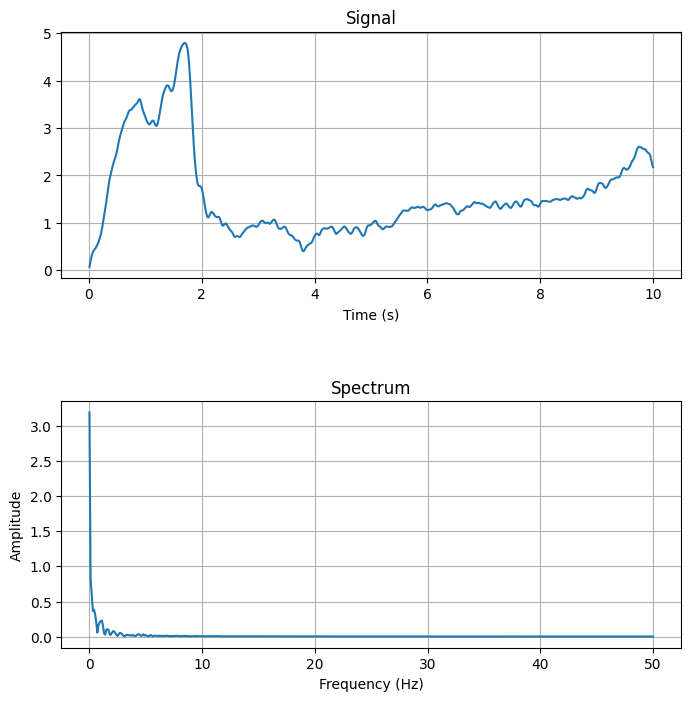

In [ ]:
fourier_pat1_yaw = Fourier(df_pat1['yaw'], SAMPLING_RATE, DURATION)
fourier_pat1_yaw.plot()

Text(0.5, 1.0, 'yaw')

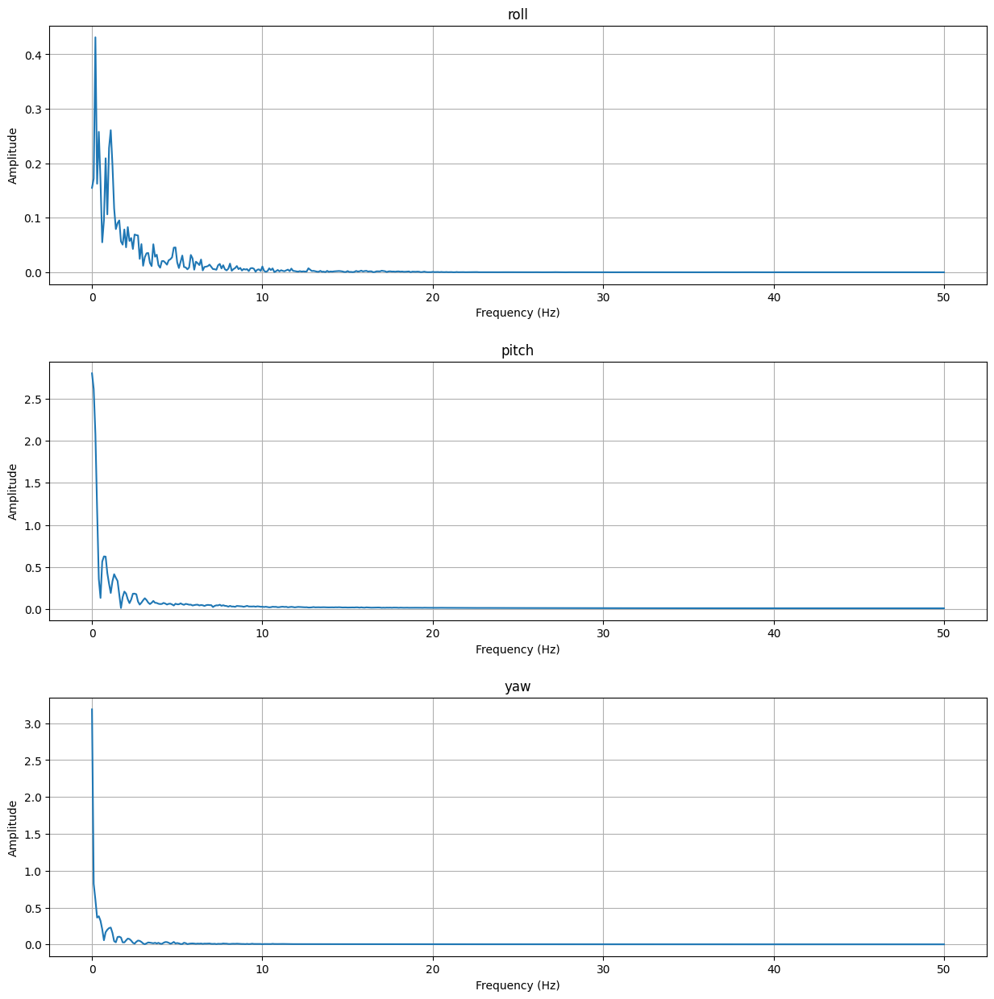

In [ ]:
fig, ax = plt.subplots(3,1, figsize=(15,15))
plt.subplots_adjust(hspace=0.3)

ax[0].plot(fourier_pat1_roll.freq, fourier_pat1_roll.amplitudes)
ax[0].set_title('roll')
ax[0].grid(True)
ax[0].set_xlabel('Frequency (Hz)')
ax[0].set_ylabel('Amplitude')
ax[0].set_title('roll')

ax[1].plot(fourier_pat1_pitch.freq, fourier_pat1_pitch.amplitudes)
ax[1].set_title('pitch')
ax[1].grid(True)
ax[1].set_xlabel('Frequency (Hz)')
ax[1].set_ylabel('Amplitude')
ax[1].set_title('pitch')

ax[2].plot(fourier_pat1_yaw.freq, fourier_pat1_yaw.amplitudes)
ax[2].set_title('yaw')
ax[2].grid(True)
ax[2].set_xlabel('Frequency (Hz)')
ax[2].set_ylabel('Amplitude')
ax[2].set_title('yaw')

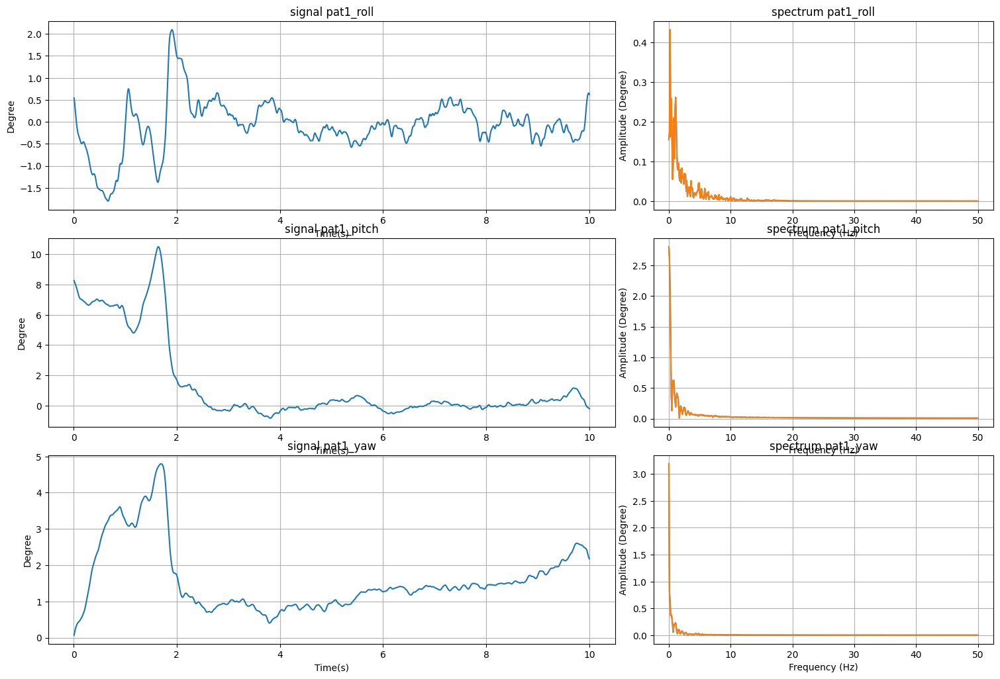

In [ ]:
plot_compare_fourier([fourier_pat1_roll, fourier_pat1_pitch, fourier_pat1_yaw],
                     ['pat1_roll', 'pat1_pitch', 'pat1_yaw'])

## Pat2

In [ ]:
pat2_path = 'data/pat2.txt'

df_pat2 = encode(pat2_path, time_axis)

print(f"shape : {df_pat2.shape}")
df_pat2.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-3.116735,-1.392020,-0.063241
0.02,-3.119225,-1.404014,-0.116827
0.03,-3.086095,-1.428258,-0.151627
0.04,-3.045629,-1.452865,-0.171865
0.05,-3.016808,-1.474283,-0.187680


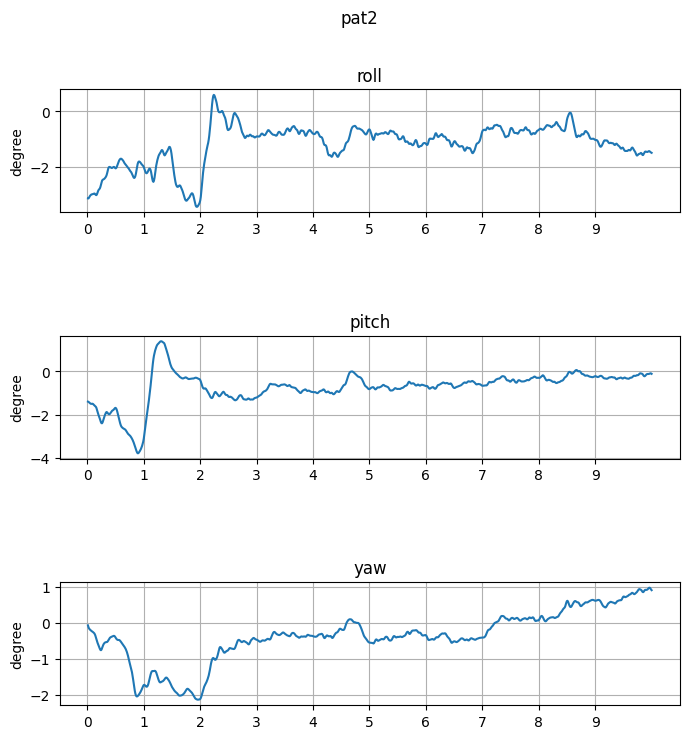

In [ ]:
plot_signal(df_pat2, ['roll', 'pitch', 'yaw'], 'degree', 'pat2')

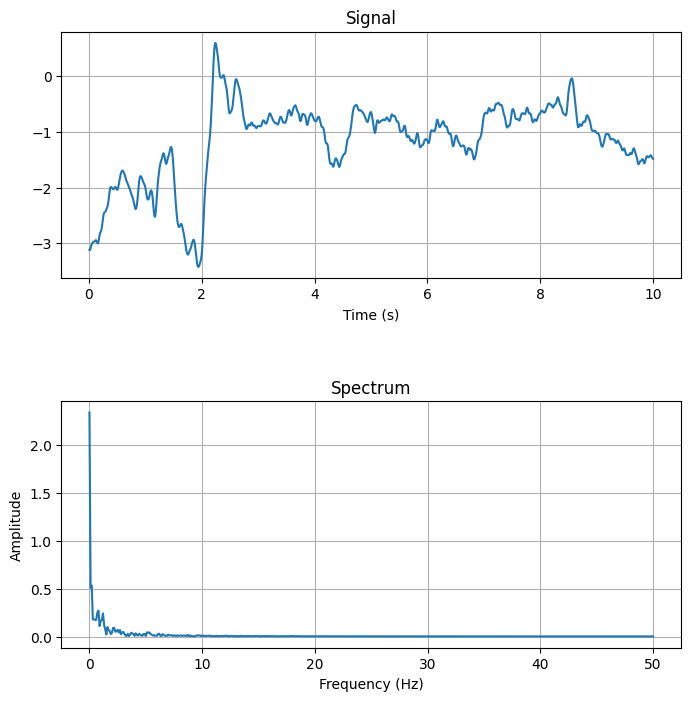

In [ ]:
fourier_pat2_roll = Fourier(df_pat2['roll'], SAMPLING_RATE, DURATION)
fourier_pat2_roll.plot()

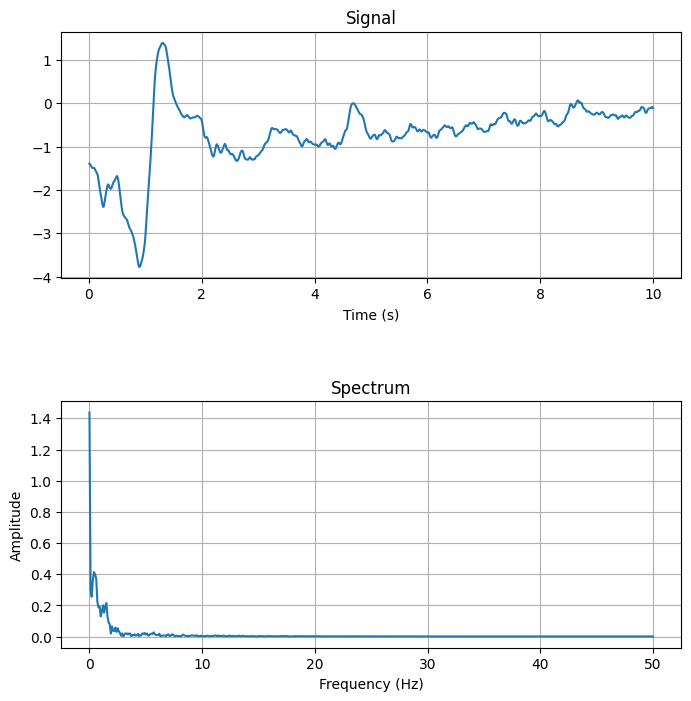

In [ ]:
fourier_pat2_pitch = Fourier(df_pat2['pitch'], SAMPLING_RATE, DURATION)
fourier_pat2_pitch.plot()

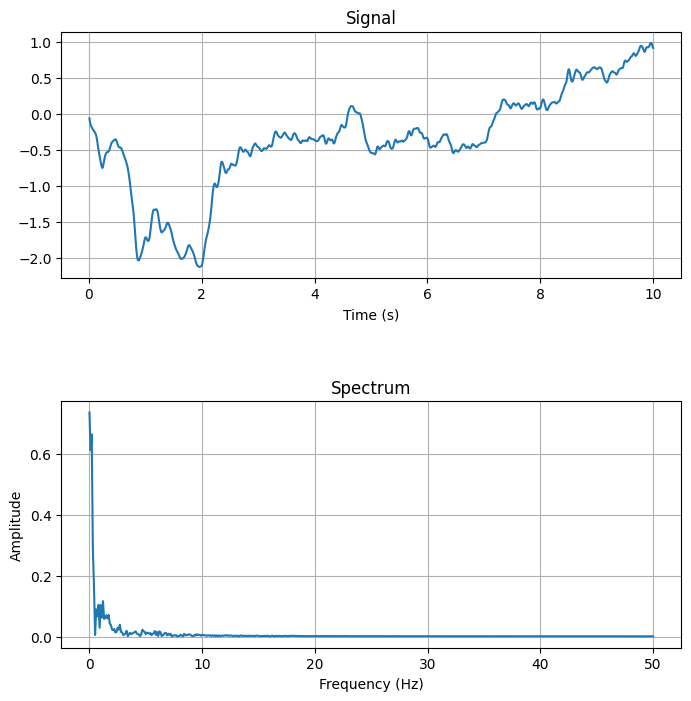

In [ ]:
fourier_pat2_yaw = Fourier(df_pat2['yaw'], SAMPLING_RATE, DURATION)
fourier_pat2_yaw.plot()

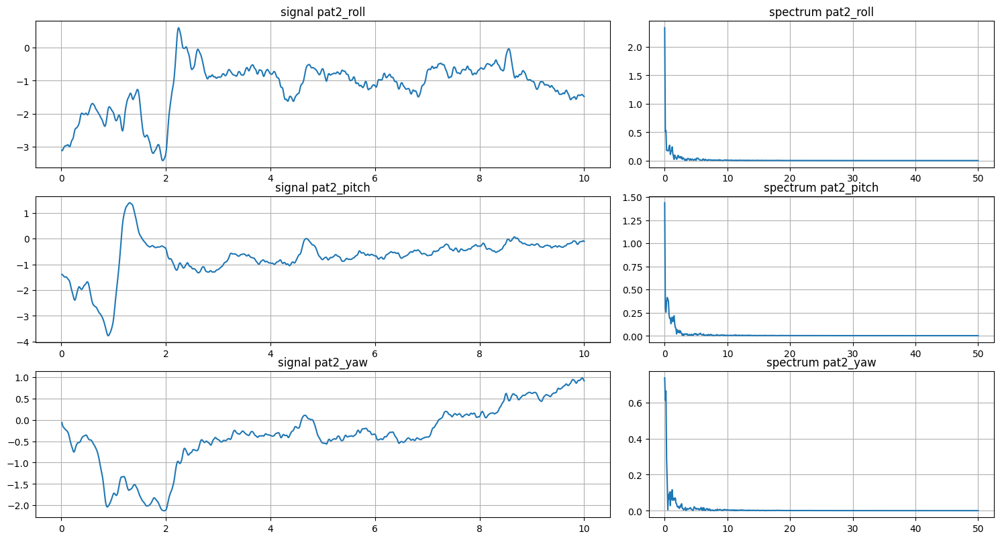

In [ ]:
plot_compare_fourier([fourier_pat2_roll, fourier_pat2_pitch, fourier_pat2_yaw],
                     ['pat2_roll', 'pat2_pitch', 'pat2_yaw'])

## Pat3

In [ ]:
pat3_path = 'data/pat3.txt'

df_pat3 = encode(pat3_path, time_axis)

print(f"shape : {df_pat3.shape}")
df_pat3.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-1.460741,-1.983165,0.039929
0.02,-1.491329,-2.048332,0.081122
0.03,-1.534632,-2.122778,0.121202
0.04,-1.597664,-2.194979,0.144875
0.05,-1.666438,-2.264980,0.153010


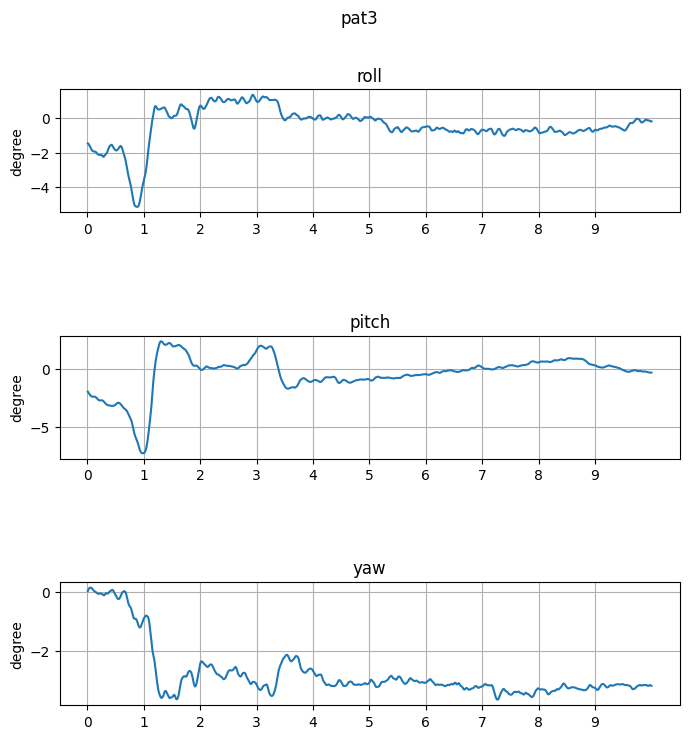

In [ ]:
plot_signal(df_pat3, ['roll', 'pitch', 'yaw'], 'degree', 'pat3')

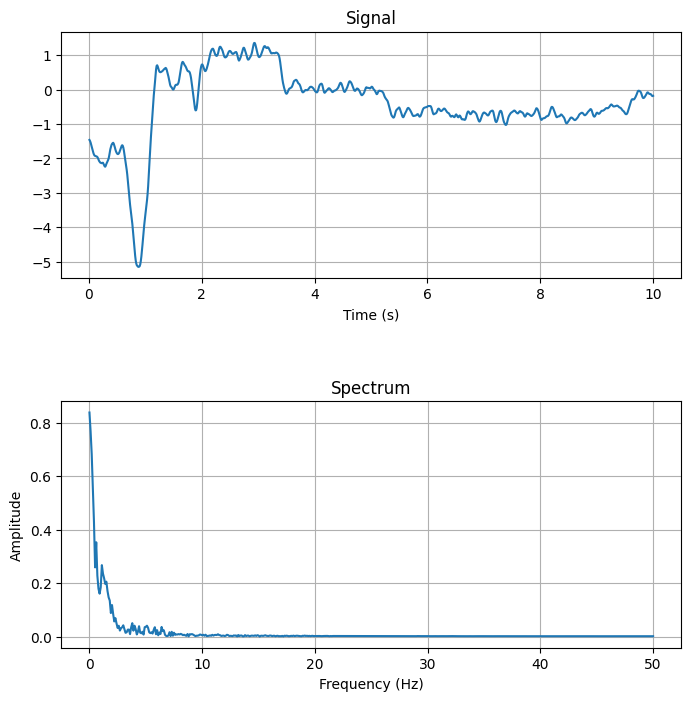

In [ ]:
fourier_pat3_roll = Fourier(df_pat3['roll'], SAMPLING_RATE, DURATION)
fourier_pat3_roll.plot()

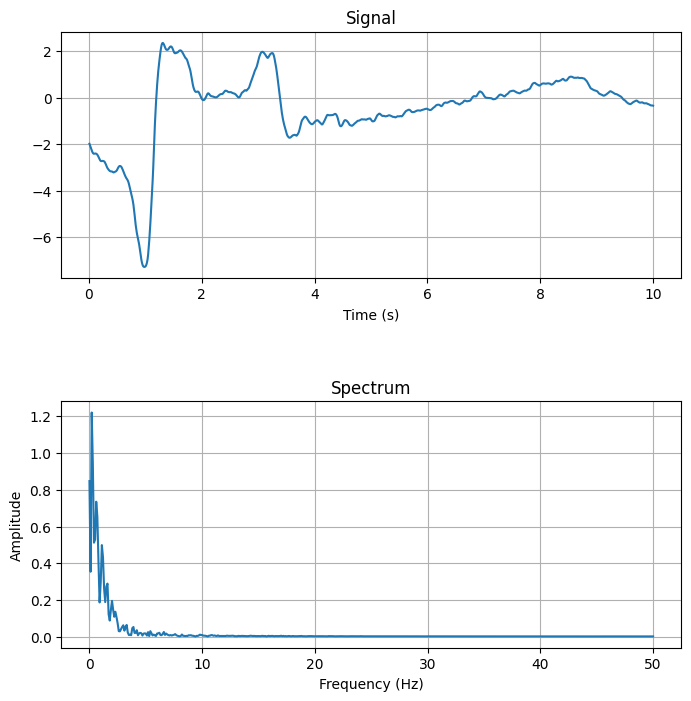

In [ ]:
fourier_pat3_pitch = Fourier(df_pat3['pitch'], SAMPLING_RATE, DURATION)
fourier_pat3_pitch.plot()

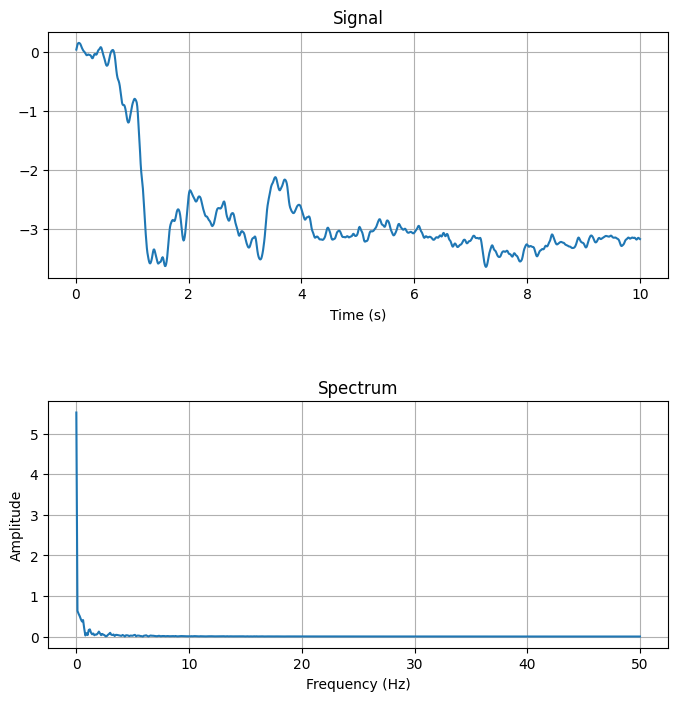

In [ ]:
fourier_pat3_yaw = Fourier(df_pat3['yaw'], SAMPLING_RATE, DURATION)
fourier_pat3_yaw.plot()

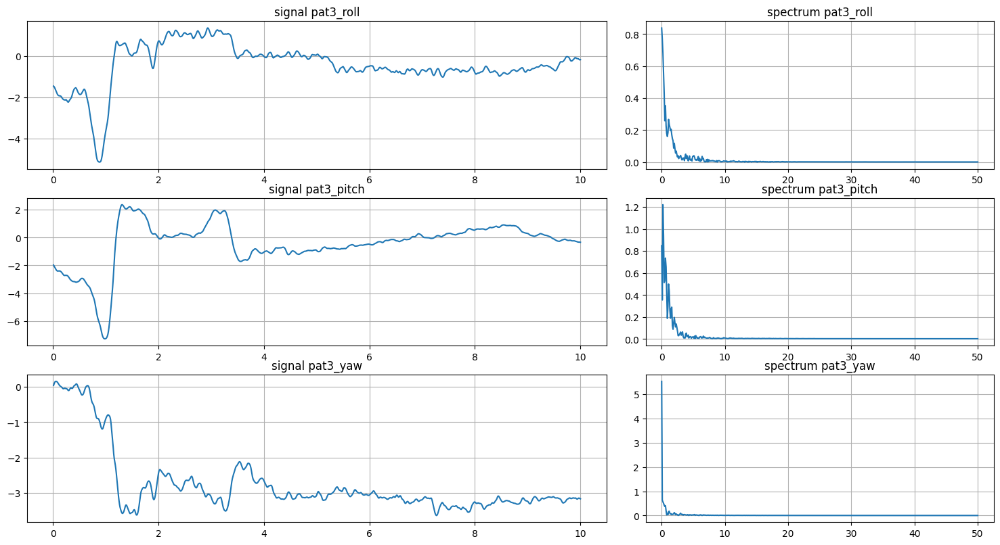

In [ ]:
plot_compare_fourier([fourier_pat3_roll, fourier_pat3_pitch, fourier_pat3_yaw],
                     ['pat3_roll', 'pat3_pitch', 'pat3_yaw'])

## Mom1

In [ ]:
mom1_path = 'data/mom1.txt'

df_mom1 = encode(mom1_path, time_axis)

print(f"shape : {df_mom1.shape}")
df_mom1.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-1.352928,2.405157,0.034636
0.02,-1.401153,2.389507,0.083697
0.03,-1.417581,2.361559,0.144336
0.04,-1.397698,2.323614,0.210267
0.05,-1.362593,2.283112,0.267689


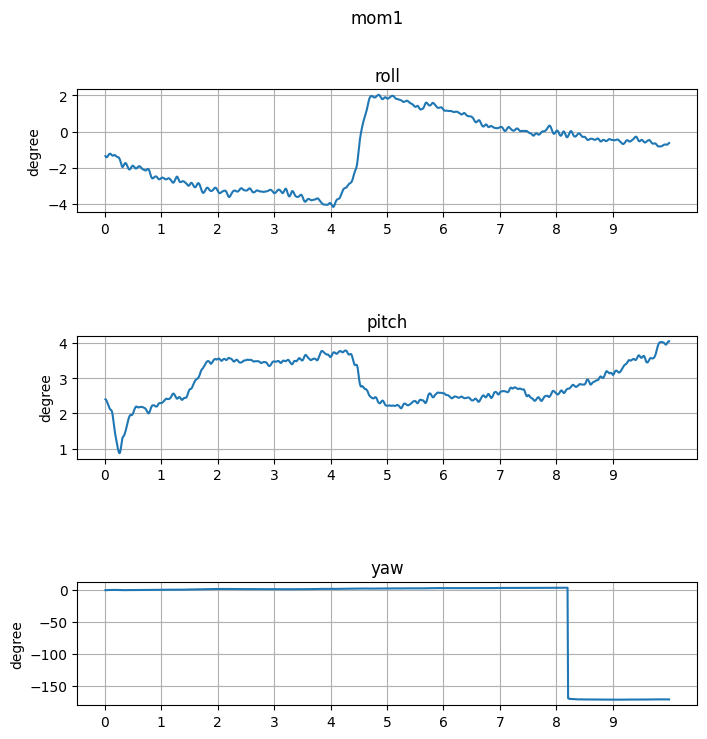

In [ ]:
plot_signal(df_mom1, ['roll', 'pitch', 'yaw'], 'degree', 'mom1')

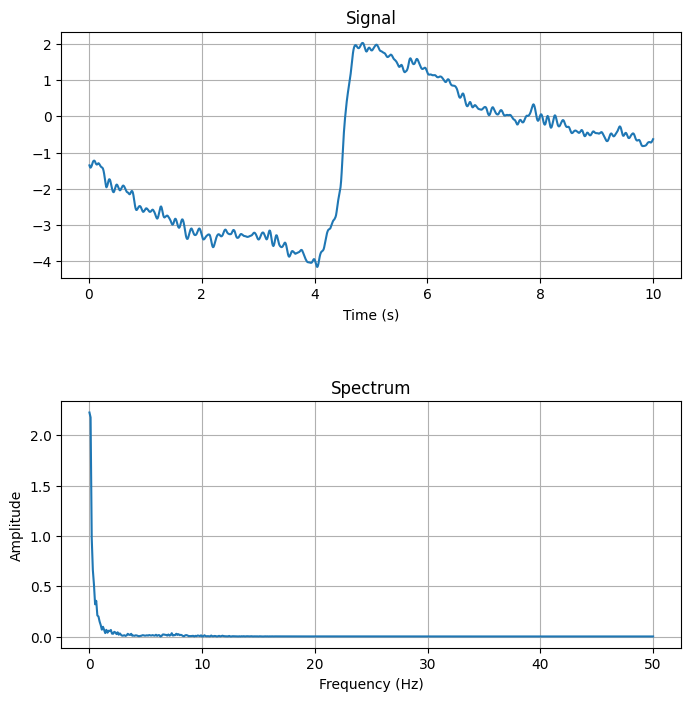

In [ ]:
fourier_mom1_roll = Fourier(df_mom1['roll'], SAMPLING_RATE, DURATION)
fourier_mom1_roll.plot()

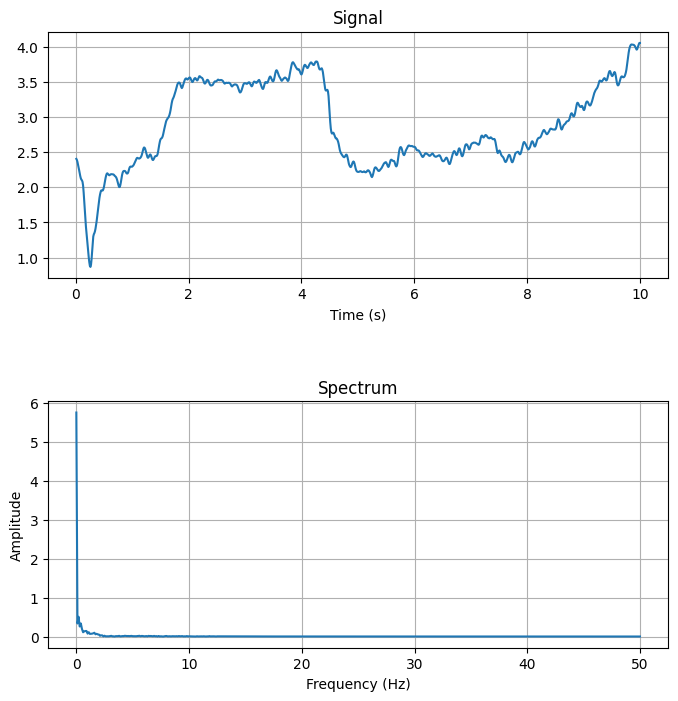

In [ ]:
fourier_mom1_pitch = Fourier(df_mom1['pitch'], SAMPLING_RATE, DURATION)
fourier_mom1_pitch.plot()

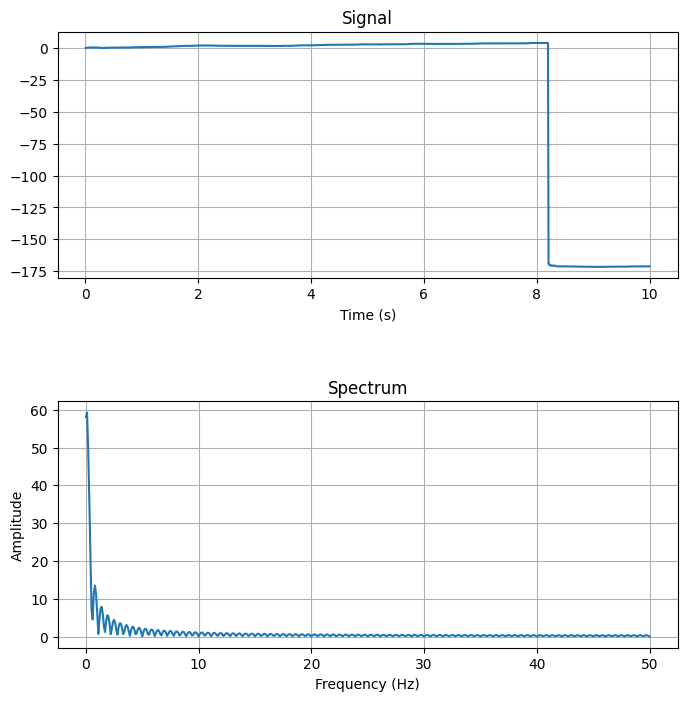

In [ ]:
fourier_mom1_yaw = Fourier(df_mom1['yaw'], SAMPLING_RATE, DURATION)
fourier_mom1_yaw.plot()

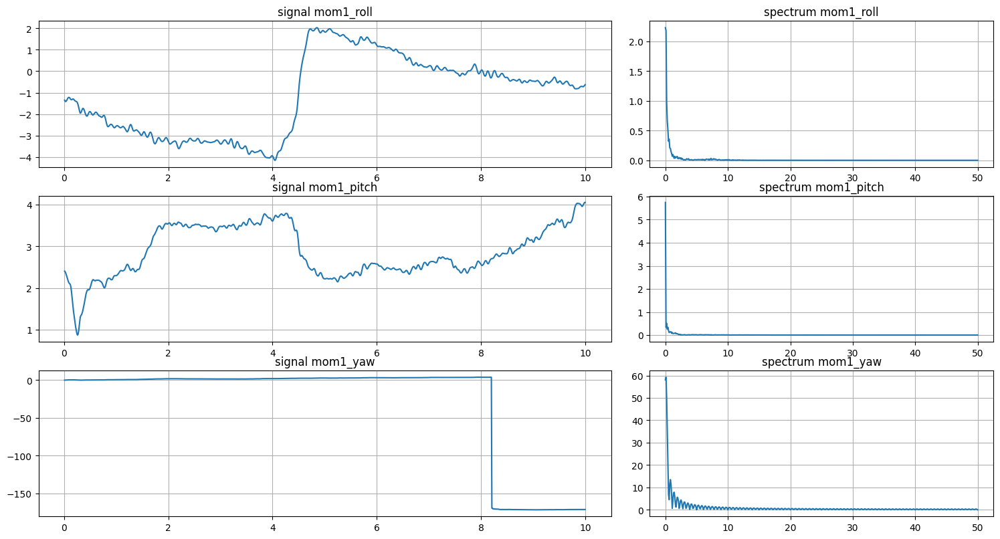

In [ ]:
plot_compare_fourier([fourier_mom1_roll, fourier_mom1_pitch, fourier_mom1_yaw],
                     ['mom1_roll', 'mom1_pitch', 'mom1_yaw'])

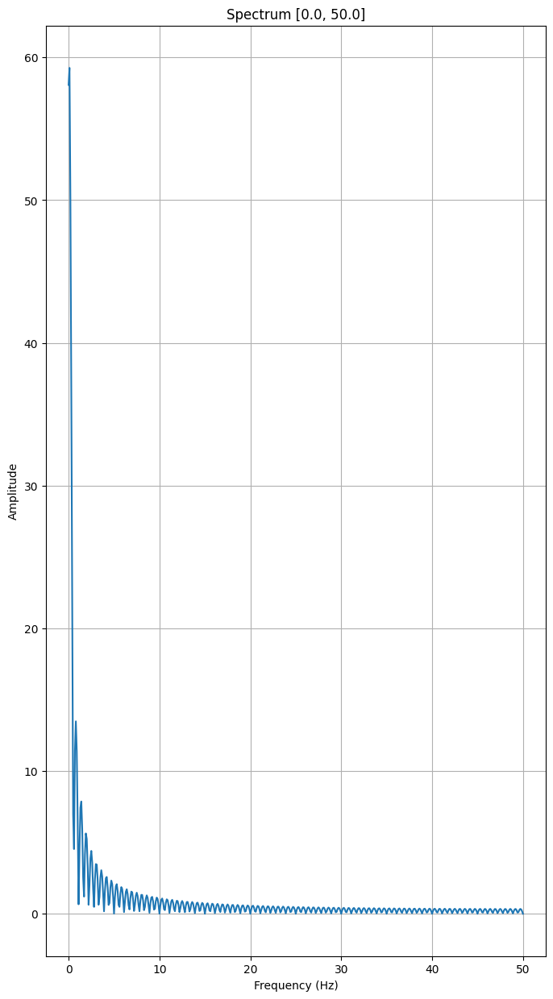

In [ ]:
fourier_mom1_yaw.plot('spectrum', figsize=(8,15))

## Mom2

In [ ]:
mom2_path = 'data/mom2.txt'

df_mom2 = encode(mom2_path, time_axis)

print(f"shape : {df_mom2.shape}")
df_mom2.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-4.420795,2.434522,0.073571
0.02,-4.436023,2.512270,0.132875
0.03,-4.451637,2.585430,0.174033
0.04,-4.461680,2.641283,0.199008
0.05,-4.473604,2.679246,0.211627


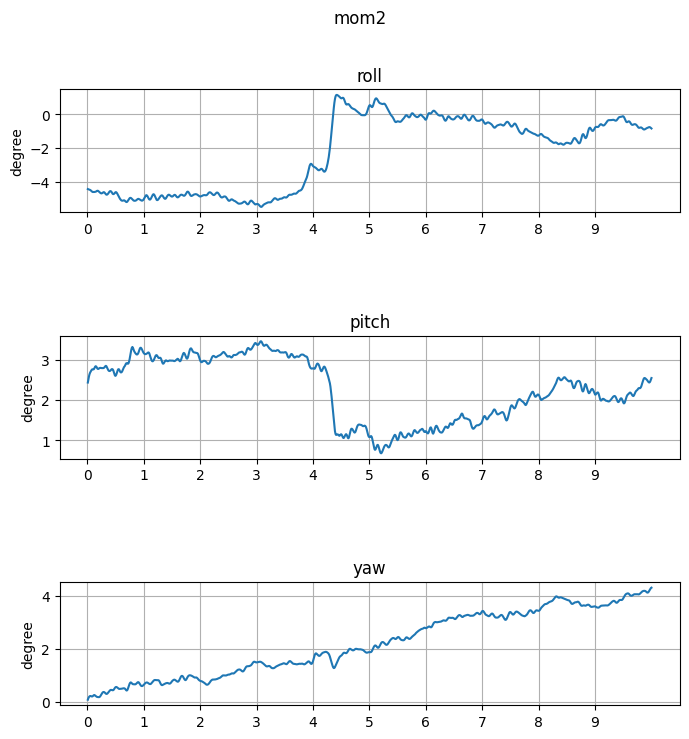

In [ ]:
plot_signal(df_mom2, ['roll', 'pitch', 'yaw'], 'degree', 'mom2')

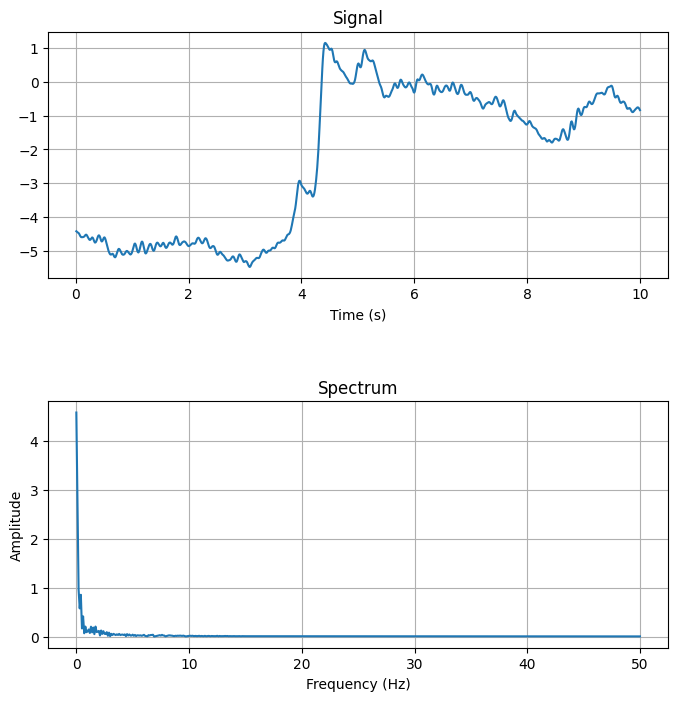

In [ ]:
fourier_mom2_roll = Fourier(df_mom2['roll'], SAMPLING_RATE, DURATION)
fourier_mom2_roll.plot()

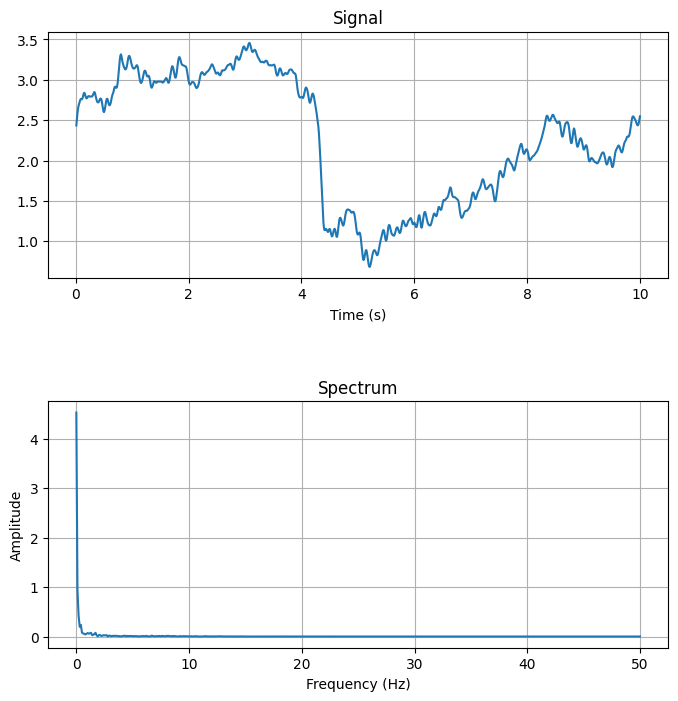

In [ ]:
fourier_mom2_pitch = Fourier(df_mom2['pitch'], SAMPLING_RATE, DURATION)
fourier_mom2_pitch.plot()

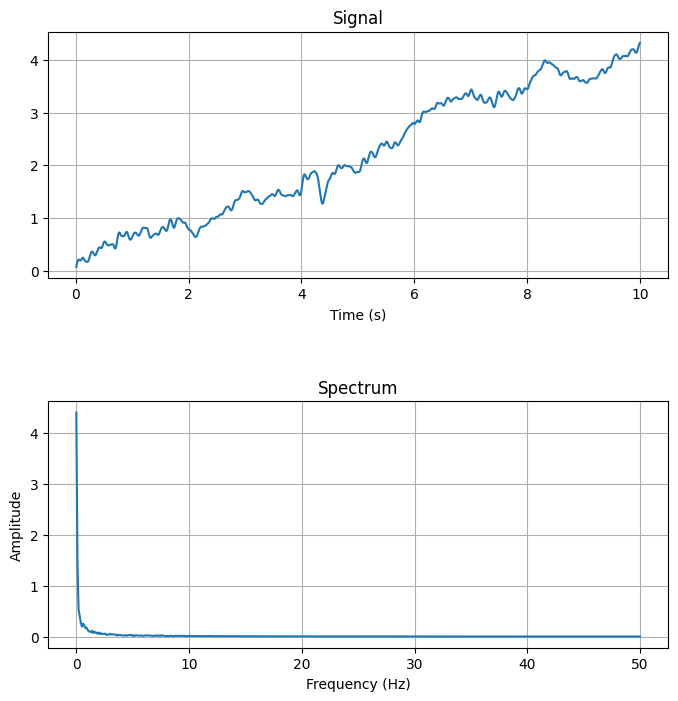

In [ ]:
fourier_mom2_yaw = Fourier(df_mom2['yaw'], SAMPLING_RATE, DURATION)
fourier_mom2_yaw.plot()

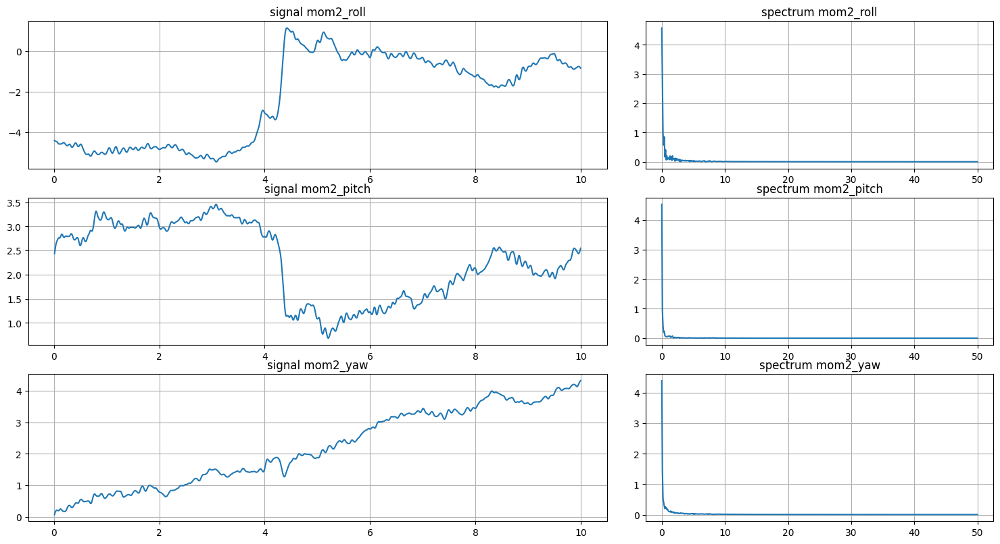

In [ ]:
plot_compare_fourier([fourier_mom2_roll, fourier_mom2_pitch, fourier_mom2_yaw],
                     ['mom2_roll', 'mom2_pitch', 'mom2_yaw'])

## Mom3

In [ ]:
mom3_path = 'data/mom3.txt'

df_mom3 = encode(mom3_path, time_axis)

print(f"shape : {df_mom3.shape}")
df_mom3.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-1.609250,1.071103,-0.119535
0.02,-1.999765,1.037808,-0.231970
0.03,-2.443964,0.962448,-0.341438
0.04,-2.914658,0.835675,-0.453634
0.05,-3.408410,0.688041,-0.570574


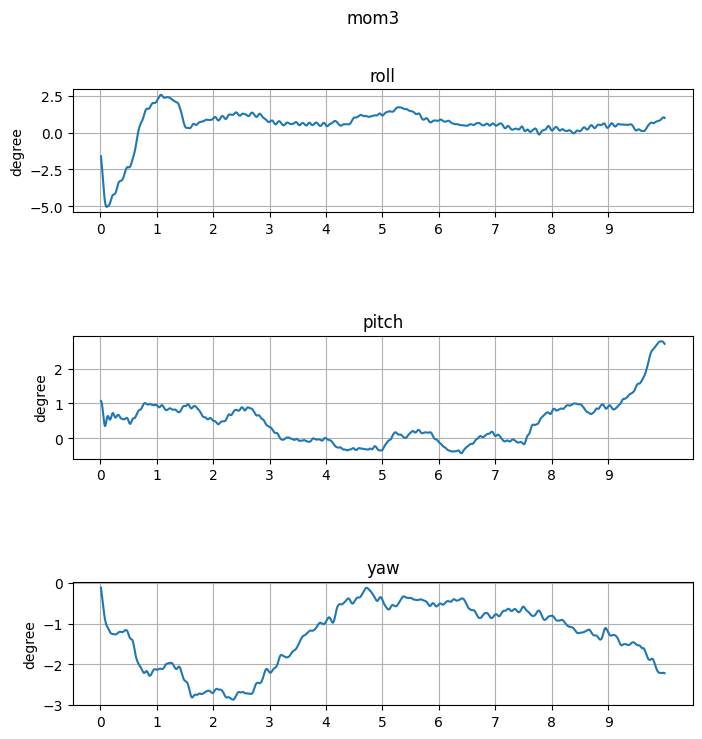

In [ ]:
plot_signal(df_mom3, ['roll', 'pitch', 'yaw'], 'degree', 'mom3')

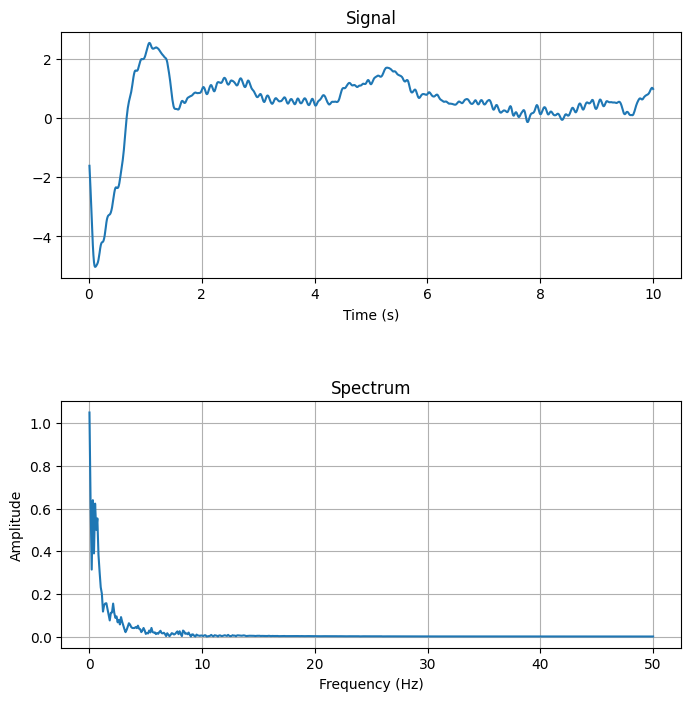

In [ ]:
fourier_mom3_roll = Fourier(df_mom3['roll'], SAMPLING_RATE, DURATION)
fourier_mom3_roll.plot()

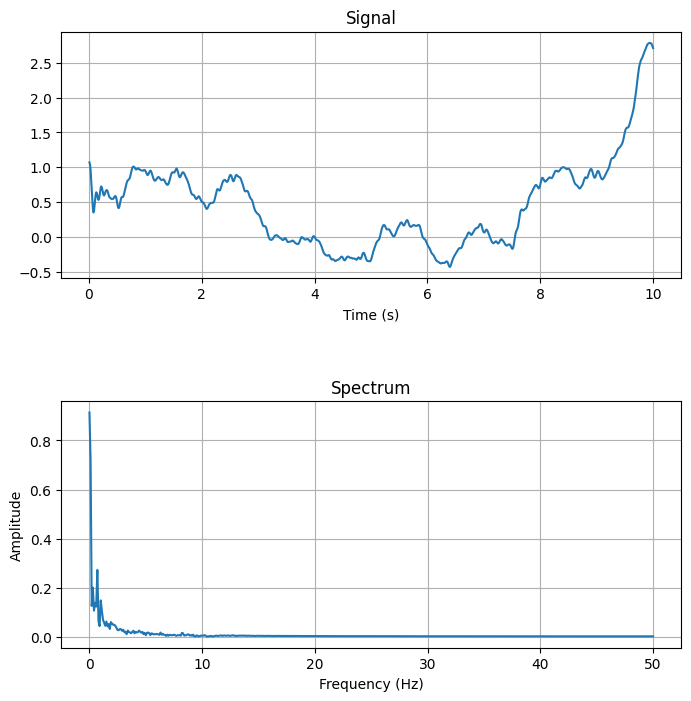

In [ ]:
fourier_mom3_pitch = Fourier(df_mom3['pitch'], SAMPLING_RATE, DURATION)
fourier_mom3_pitch.plot()

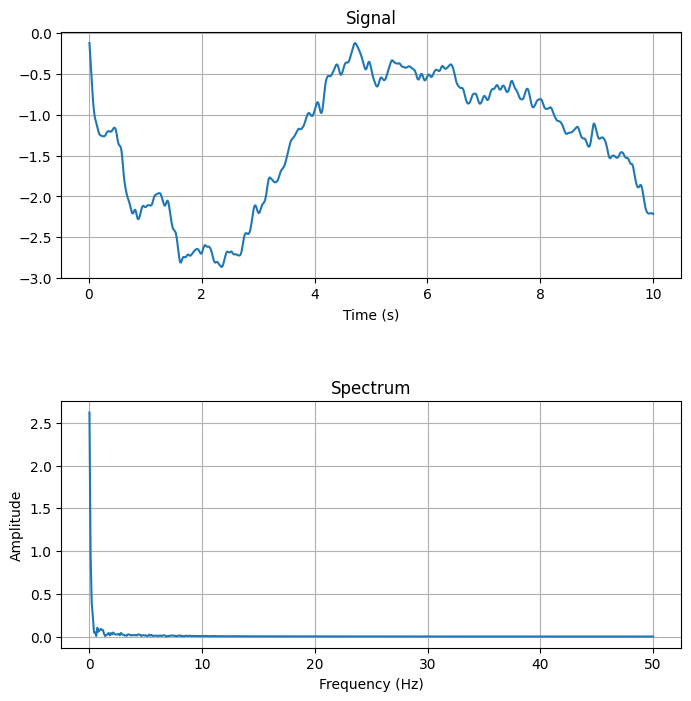

In [ ]:
fourier_mom3_yaw = Fourier(df_mom3['yaw'], SAMPLING_RATE, DURATION)
fourier_mom3_yaw.plot()

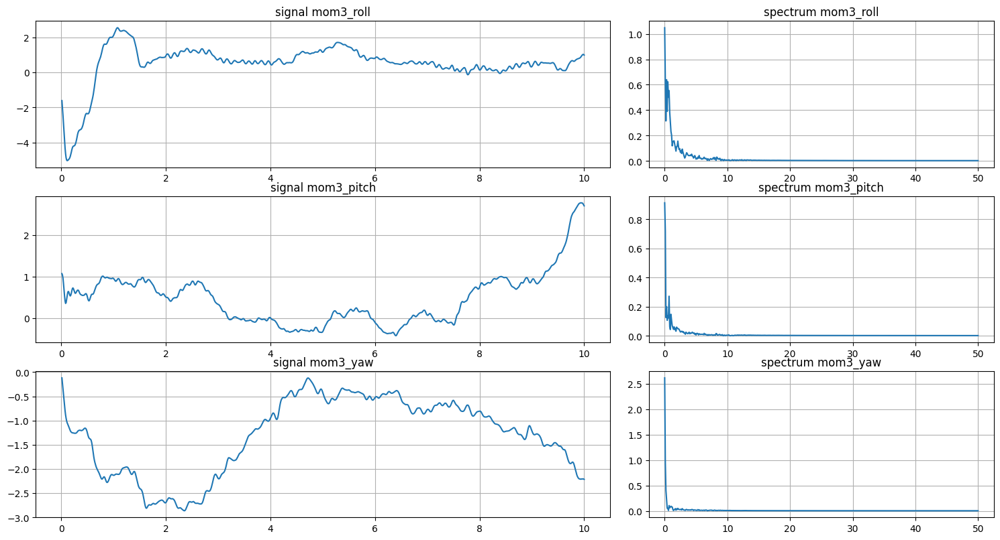

In [ ]:
plot_compare_fourier([fourier_mom3_roll, fourier_mom3_pitch, fourier_mom3_yaw],
                     ['mom3_roll', 'mom3_pitch', 'mom3_yaw'])

## Grandma1

In [ ]:
grandma1_path = 'data/grandma1.txt'

df_grandma1 = encode(grandma1_path, time_axis)

print(f"shape : {df_grandma1.shape}")
df_grandma1.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-3.395124,4.065430,0.097870
0.02,-3.362775,4.113267,0.198096
0.03,-3.322577,4.163122,0.295249
0.04,-3.282632,4.220625,0.386496
0.05,-3.239862,4.283729,0.468933


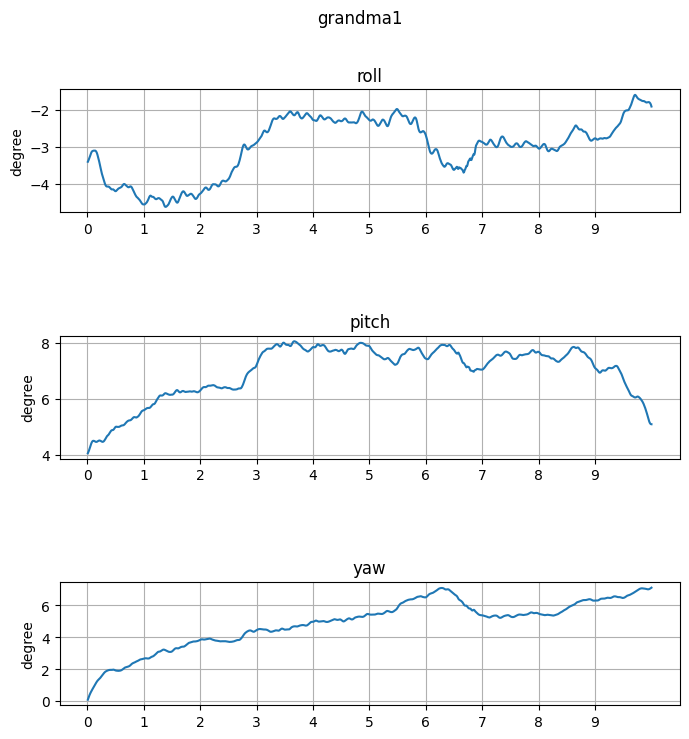

In [ ]:
plot_signal(df_grandma1, ['roll', 'pitch', 'yaw'], 'degree', 'grandma1')

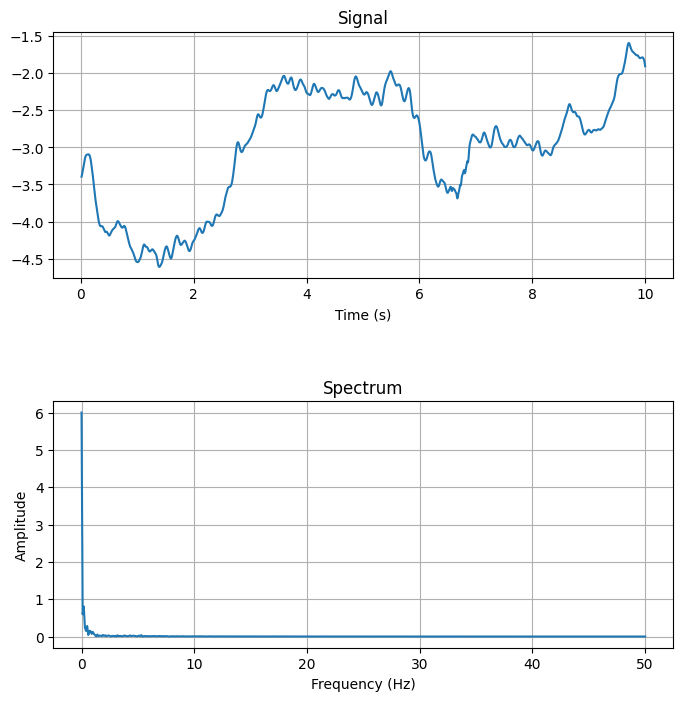

In [ ]:
fourier_grandma1_roll = Fourier(df_grandma1['roll'], SAMPLING_RATE, DURATION)
fourier_grandma1_roll.plot()

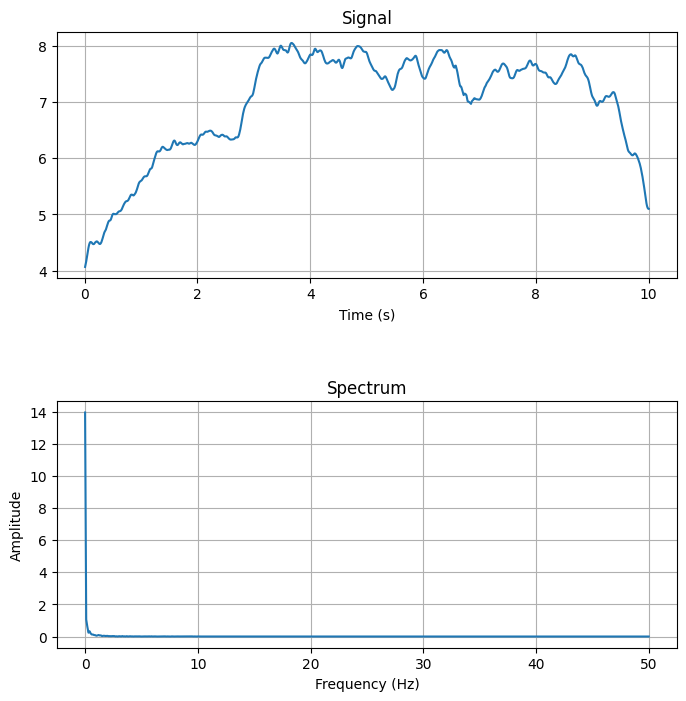

In [ ]:
fourier_grandma1_pitch = Fourier(df_grandma1['pitch'], SAMPLING_RATE, DURATION)
fourier_grandma1_pitch.plot()

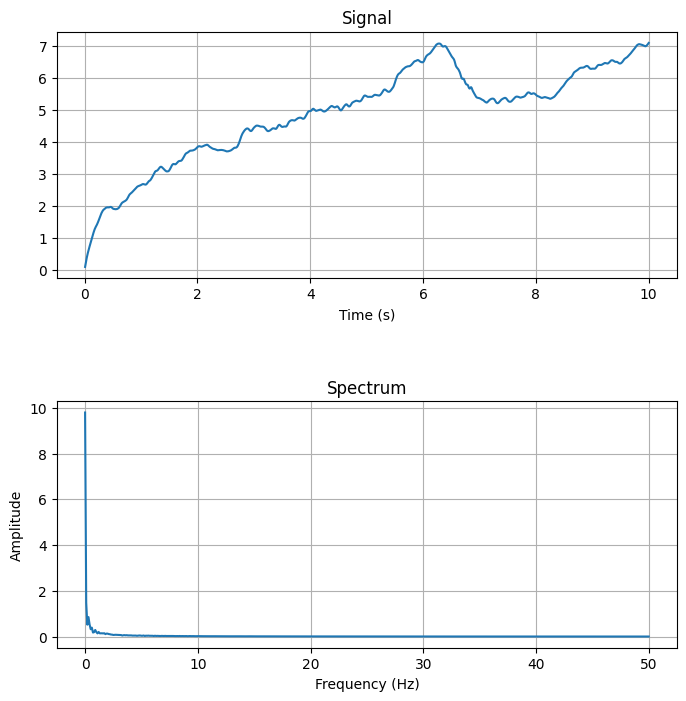

In [ ]:
fourier_grandma1_yaw = Fourier(df_grandma1['yaw'], SAMPLING_RATE, DURATION)
fourier_grandma1_yaw.plot()

## Grandma2

In [ ]:
grandma2_path = 'data/grandma2.txt'

df_grandma2 = encode(grandma2_path, time_axis)

print(f"shape : {df_grandma2.shape}")
df_grandma2.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-1.041555,-2.366642,-0.019138
0.02,-1.012483,-2.366899,-0.037826
0.03,-0.995983,-2.371455,-0.057309
0.04,-0.993220,-2.380677,-0.078168
0.05,-1.003566,-2.387222,-0.100947


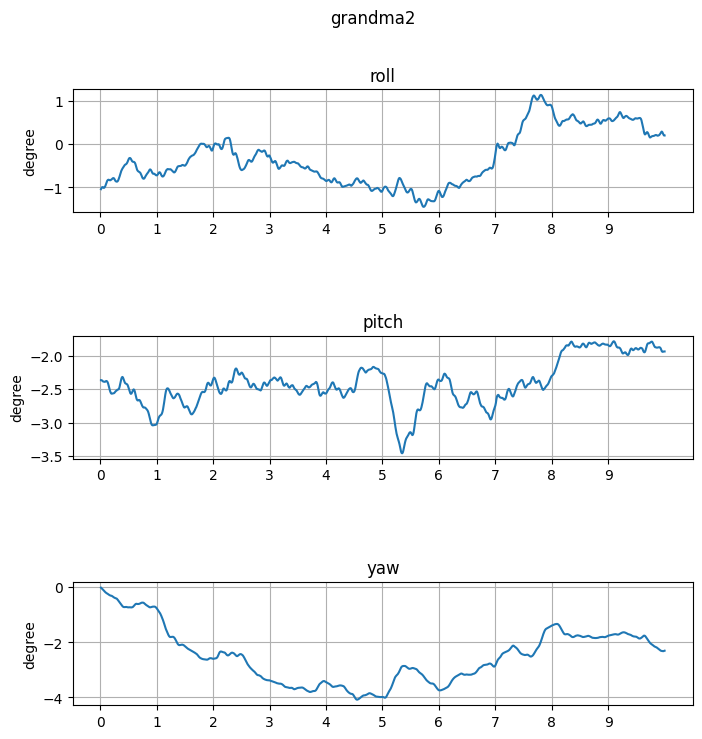

In [ ]:
plot_signal(df_grandma2, ['roll', 'pitch', 'yaw'], 'degree', 'grandma2')

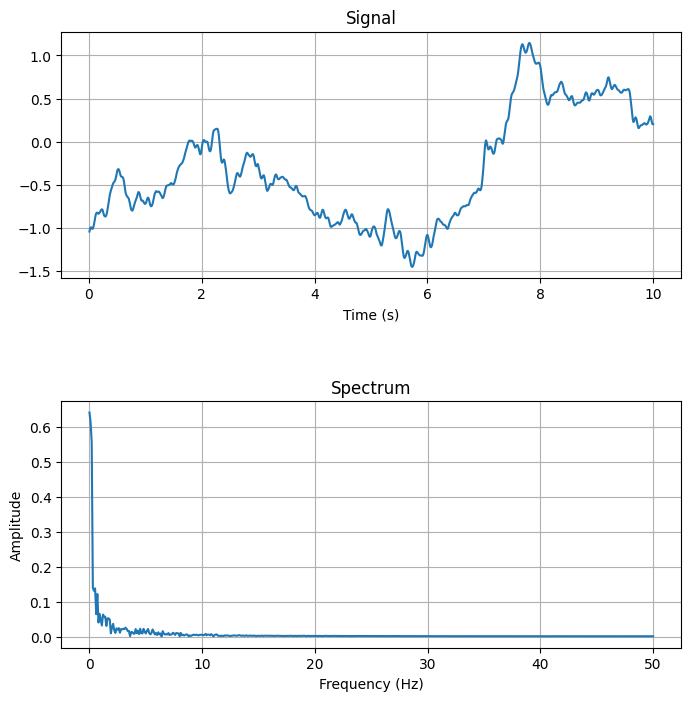

In [ ]:
fourier_grandma2_roll = Fourier(df_grandma2['roll'], SAMPLING_RATE, DURATION)
fourier_grandma2_roll.plot()

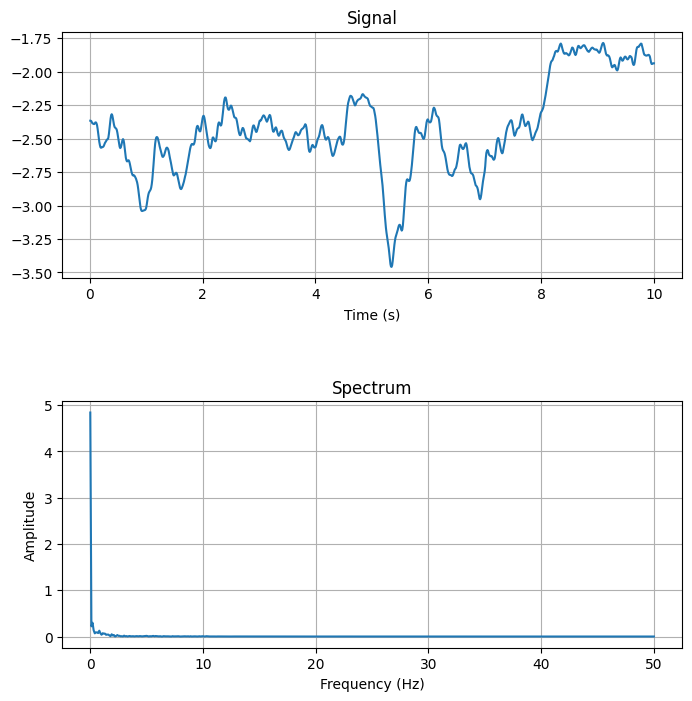

In [ ]:
fourier_grandma2_pitch = Fourier(df_grandma2['pitch'], SAMPLING_RATE, DURATION)
fourier_grandma2_pitch.plot()

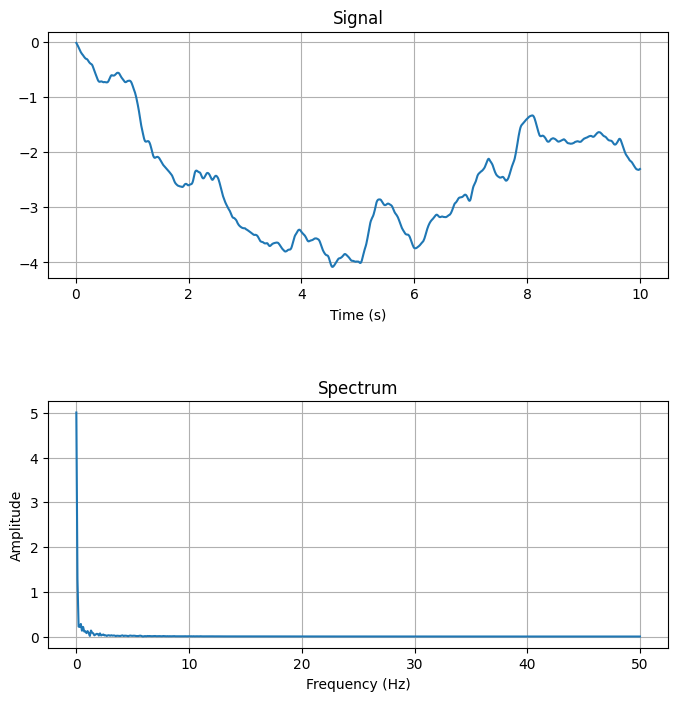

In [ ]:
fourier_grandma2_yaw = Fourier(df_grandma2['yaw'], SAMPLING_RATE, DURATION)
fourier_grandma2_yaw.plot()

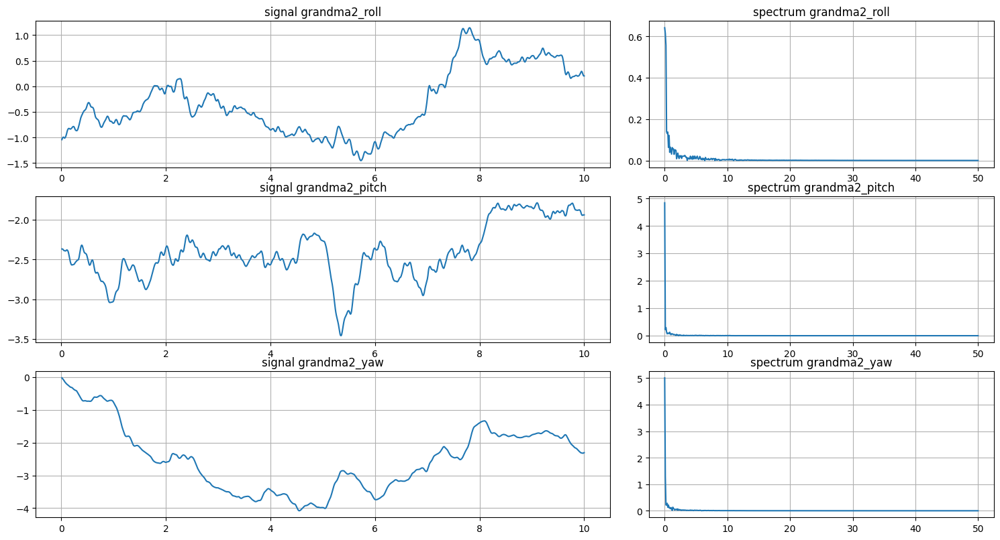

In [ ]:
plot_compare_fourier([fourier_grandma2_roll, fourier_grandma2_pitch, fourier_grandma2_yaw],
                     ['grandma2_roll', 'grandma2_pitch', 'grandma2_yaw'])

## Longmove1

In [ ]:
longmove1_path = 'data/longmove1.txt'

df_longmove1 = encode(longmove1_path, time_axis)

print(f"shape : {df_longmove1.shape}")
df_longmove1.head()

shape : (1000, 3)


,roll,pitch,yaw
0.01,-3.415705,-0.125420,0.213491
0.02,-3.612001,-0.012260,0.429578
0.03,-3.815001,0.109390,0.631485
0.04,-4.005272,0.226528,0.802950
0.05,-4.174622,0.330570,0.937040


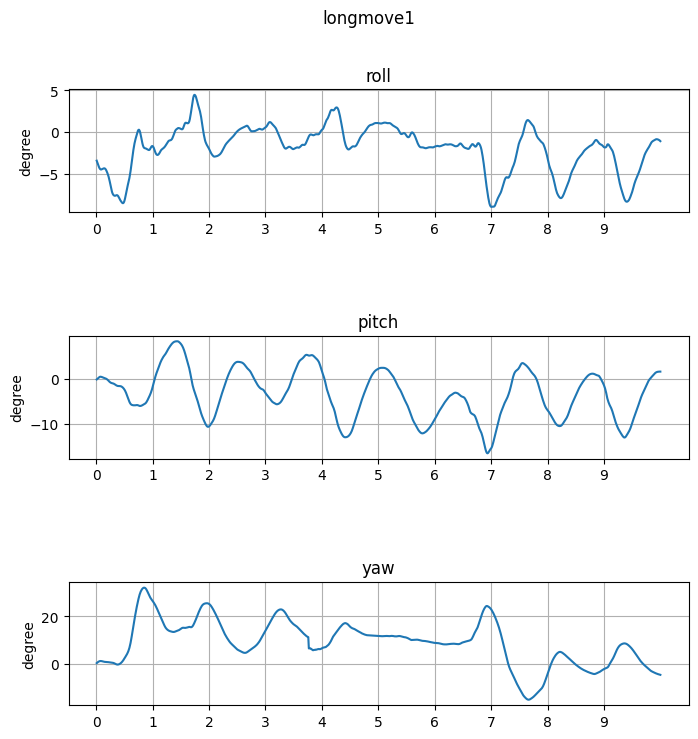

In [ ]:
plot_signal(df_longmove1, ['roll', 'pitch', 'yaw'], 'degree', 'longmove1')

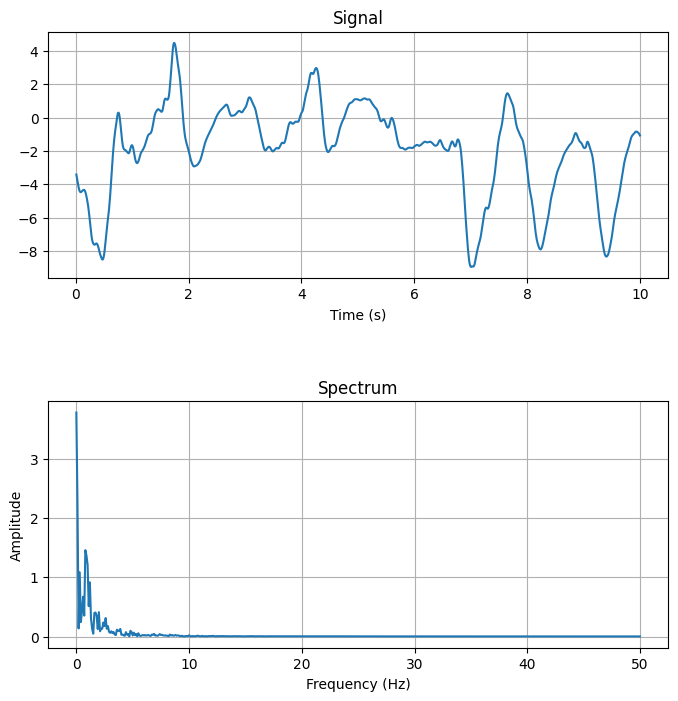

In [ ]:
fourier_longmove1_roll = Fourier(df_longmove1['roll'], SAMPLING_RATE, DURATION)
fourier_longmove1_roll.plot()

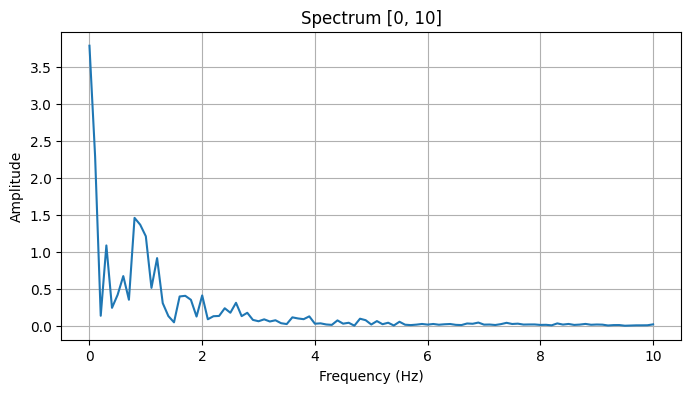

In [ ]:
fourier_longmove1_roll.plot('spectrum', 0,10)

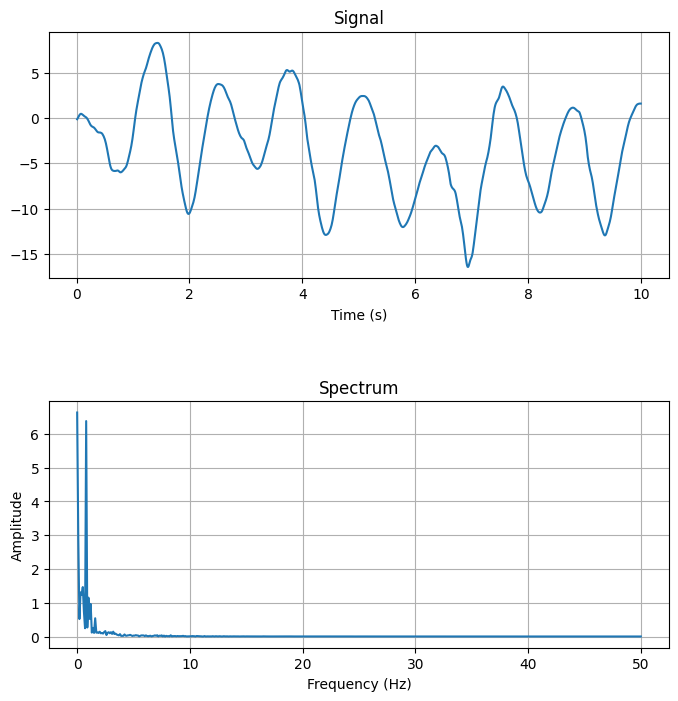

In [ ]:
fourier_longmove1_pitch = Fourier(df_longmove1['pitch'], SAMPLING_RATE, DURATION)
fourier_longmove1_pitch.plot()

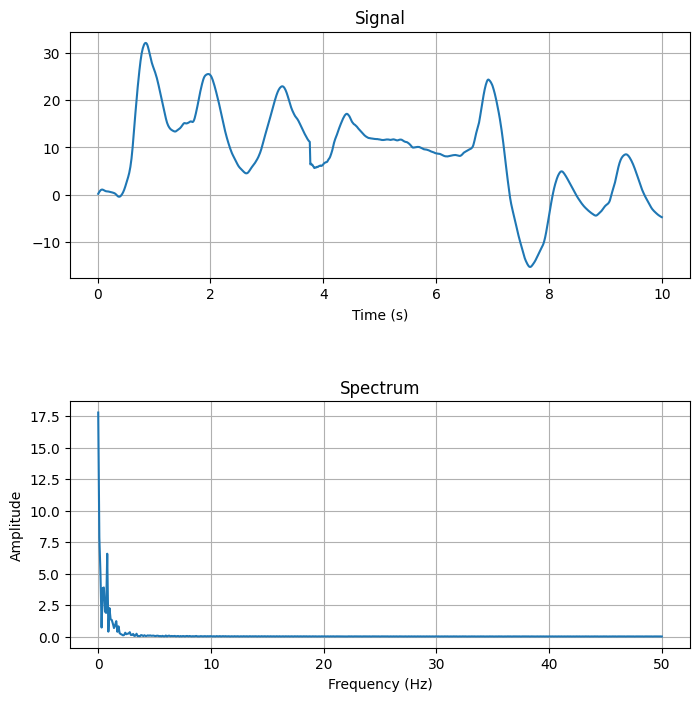

In [ ]:
fourier_longmove1_yaw = Fourier(df_longmove1['yaw'], SAMPLING_RATE, DURATION)
fourier_longmove1_yaw.plot()

## Compare Fourier

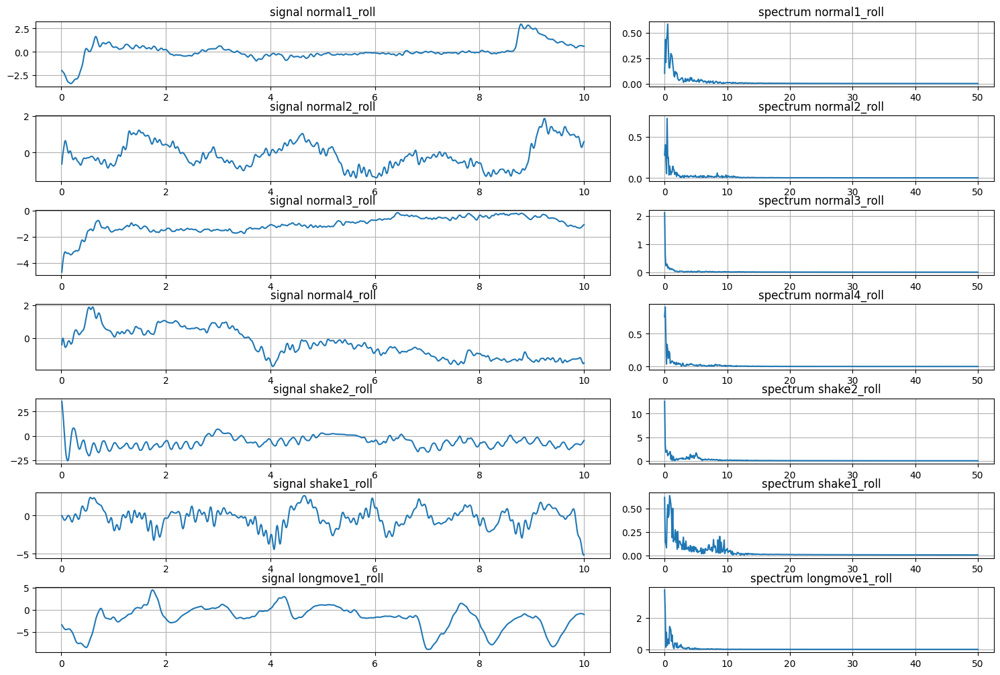

In [ ]:
plot_compare_fourier([fourier_normal1_roll, fourier_normal2_roll, fourier_normal3_roll, fourier_normal4_roll, fourier_shake2_roll, fourier_shake1_roll, fourier_longmove1_roll],
                     ['normal1_roll', 'normal2_roll', 'normal3_roll', 'normal4_roll', 'shake2_roll', 'shake1_roll', 'longmove1_roll'])

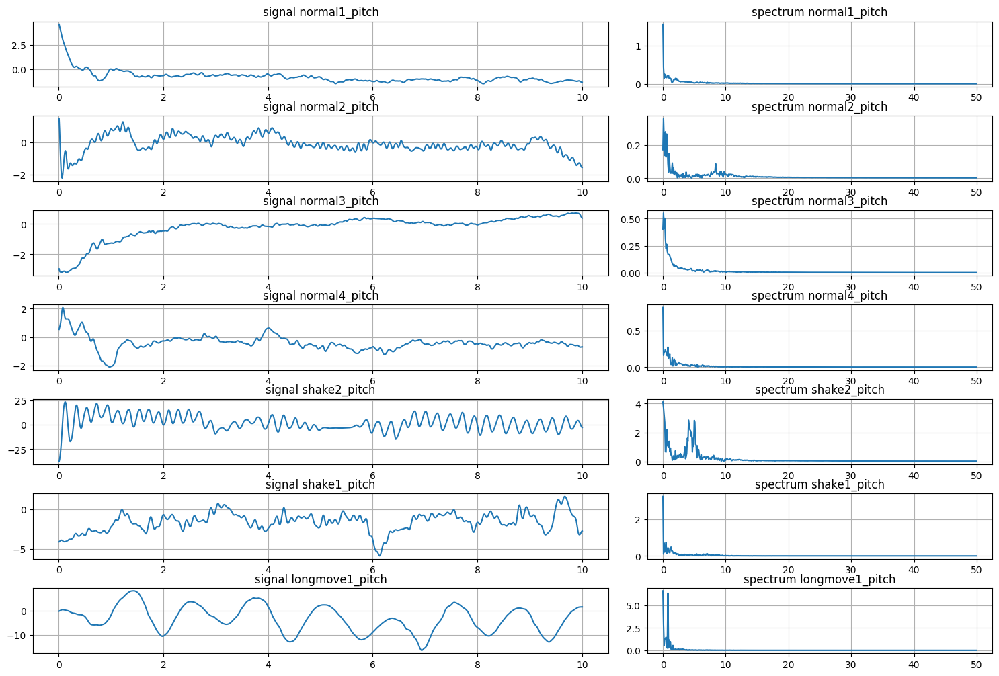

In [ ]:
plot_compare_fourier(
    [fourier_normal1_pitch, fourier_normal2_pitch, fourier_normal3_pitch, fourier_normal4_pitch, fourier_shake2_pitch, fourier_shake1_pitch, fourier_longmove1_pitch],
    ['normal1_pitch', 'normal2_pitch', 'normal3_pitch', 'normal4_pitch', 'shake2_pitch', 'shake1_pitch', 'longmove1_pitch'])

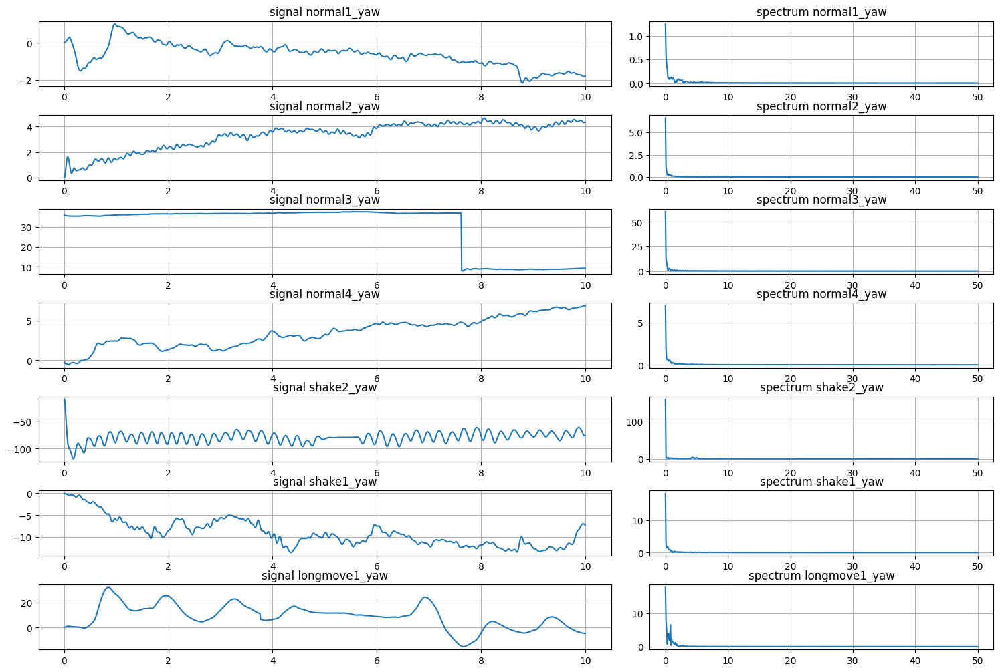

In [ ]:
plot_compare_fourier(
    [fourier_normal1_yaw, fourier_normal2_yaw, fourier_normal3_yaw, fourier_normal4_yaw, fourier_shake2_yaw, fourier_shake1_yaw, fourier_longmove1_yaw],
    ['normal1_yaw', 'normal2_yaw', 'normal3_yaw', 'normal4_yaw', 'shake2_yaw', 'shake1_yaw', 'longmove1_yaw'])

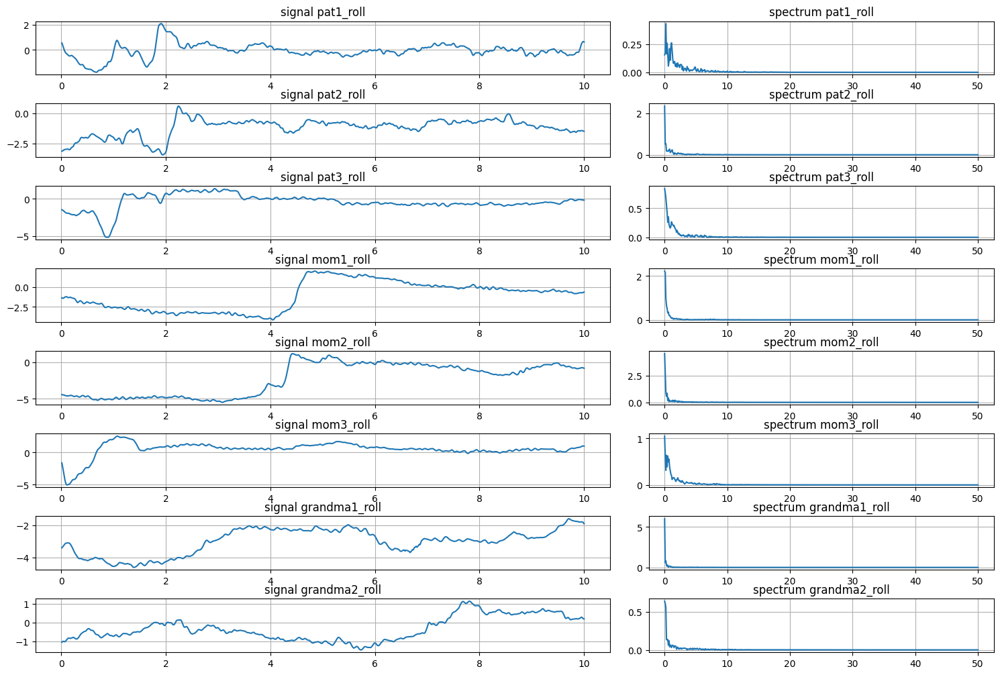

In [ ]:
plot_compare_fourier(
    [fourier_pat1_roll, fourier_pat2_roll, fourier_pat3_roll, fourier_mom1_roll, fourier_mom2_roll, fourier_mom3_roll, fourier_grandma1_roll, fourier_grandma2_roll],
    ['pat1_roll', 'pat2_roll', 'pat3_roll', 'mom1_roll', 'mom2_roll', 'mom3_roll', 'grandma1_roll', 'grandma2_roll'])

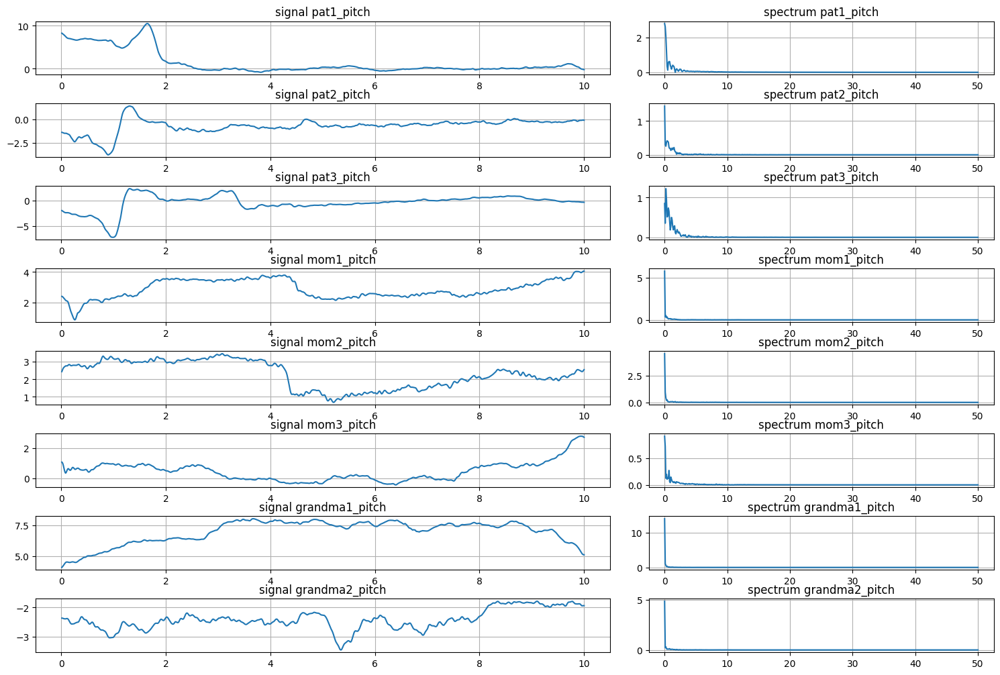

In [ ]:
plot_compare_fourier(
    [fourier_pat1_pitch, fourier_pat2_pitch, fourier_pat3_pitch, fourier_mom1_pitch, fourier_mom2_pitch, fourier_mom3_pitch, fourier_grandma1_pitch, fourier_grandma2_pitch],
    ['pat1_pitch', 'pat2_pitch', 'pat3_pitch', 'mom1_pitch', 'mom2_pitch', 'mom3_pitch', 'grandma1_pitch', 'grandma2_pitch']
)

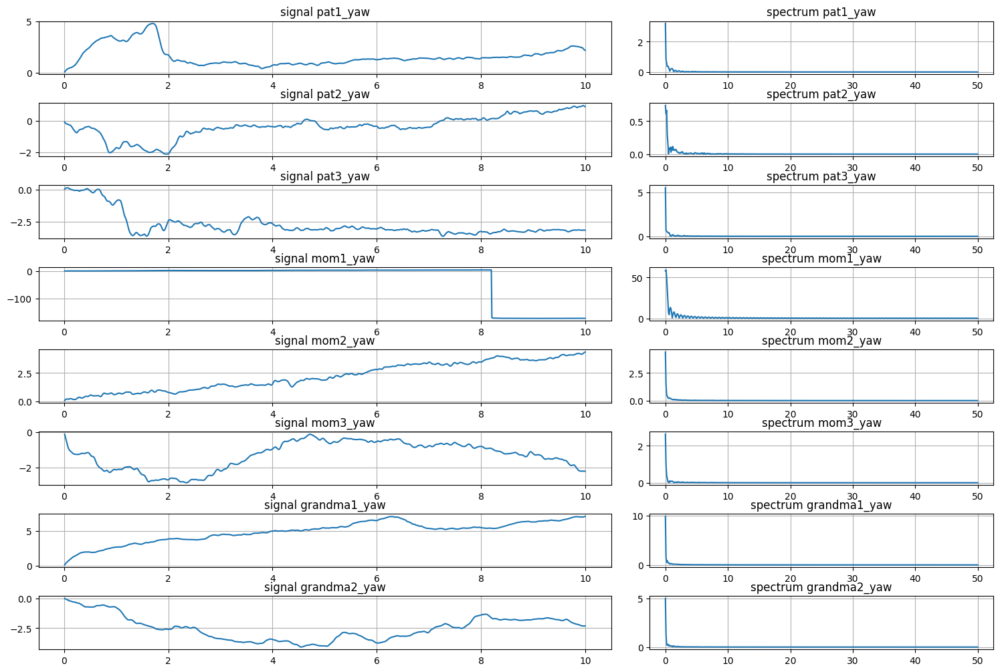

In [ ]:
plot_compare_fourier(
    [fourier_pat1_yaw, fourier_pat2_yaw, fourier_pat3_yaw, fourier_mom1_yaw, fourier_mom2_yaw, fourier_mom3_yaw, fourier_grandma1_yaw, fourier_grandma2_yaw],
    ['pat1_yaw', 'pat2_yaw', 'pat3_yaw', 'mom1_yaw', 'mom2_yaw', 'mom3_yaw', 'grandma1_yaw', 'grandma2_yaw']
)

# Experiment

In [15]:
def predict(signal, sampling_rate, duration, thresholds = np.array([1,5])) :
    fourier = Fourier(signal, sampling_rate, duration)
    amp = fourier.amplitudes

    start_freq = 0.5
    start_idx = np.argwhere(fourier.freq >= start_freq)[0][0]

    for i in np.linspace(len(thresholds)-1,0,len(thresholds), dtype=np.int32):
        if np.any(amp[start_idx:] > thresholds[i]):
            return i + 1

    return 0

In [93]:
def predict(signal, sampling_rate, duration) :
    fourier = Fourier(signal, sampling_rate, duration)
    amp = fourier.amplitudes

    start_freq = 0.5
    start_idx = np.argwhere(fourier.freq >= start_freq)[0][0]

    idx_3hz = np.argwhere(fourier.freq >= 3)[0][0]
    idx_9hz = np.argwhere(fourier.freq >= 9)[0][0]

    max_amp_parkinson_range = np.max(amp[idx_3hz:idx_9hz+1])
    if max_amp_parkinson_range > 1.5 : return 2

    max_amp_trmor_range = np.max(amp[start_idx:])
    if max_amp_trmor_range > 1 : return 1

    return 0

In [ ]:
predict(df_pat1['roll'], SAMPLING_RATE, DURATION)

'low'

In [ ]:
predict(df_shake2['roll'], SAMPLING_RATE, DURATION)

'low'

In [ ]:
predict(df_mom3['pitch'], SAMPLING_RATE, DURATION)

'low'

In [ ]:
predict(df_mom1['yaw'], SAMPLING_RATE, DURATION)

'high'

In [ ]:
print(len(fourier_longmove1_roll.freq))

501


# Check

0 0 0


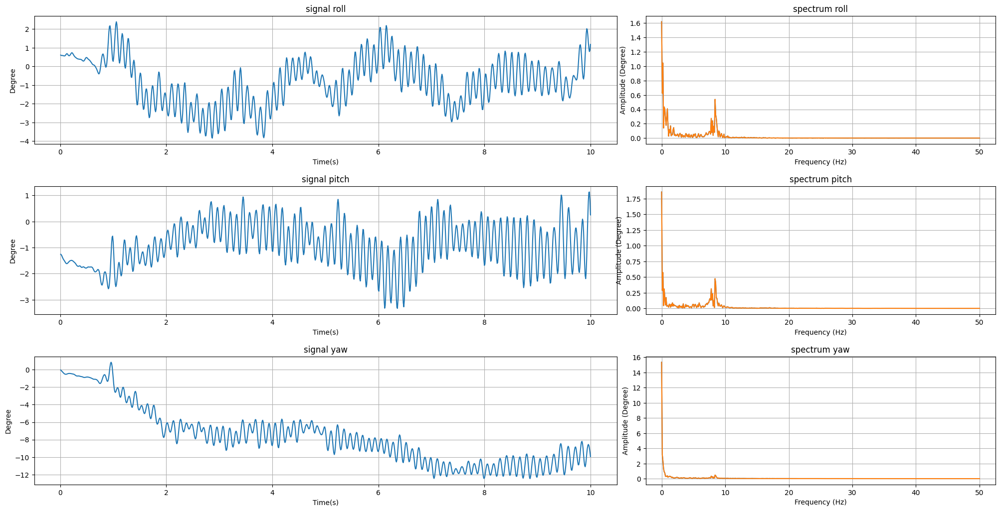

In [ ]:
df1 = encode('data/input1.txt', time_axis)

fourier1_roll = Fourier(df1['roll'], SAMPLING_RATE, DURATION)
fourier1_pitch = Fourier(df1['pitch'], SAMPLING_RATE, DURATION)
fourier1_yaw = Fourier(df1['yaw'], SAMPLING_RATE, DURATION)

print(predict(df1['roll'], SAMPLING_RATE, DURATION), predict(df1['pitch'], SAMPLING_RATE, DURATION), predict(df1['yaw'], SAMPLING_RATE, DURATION))


plot_compare_fourier([fourier1_roll, fourier1_pitch, fourier1_yaw],
                     ['roll', 'pitch', 'yaw'])

0 0 1


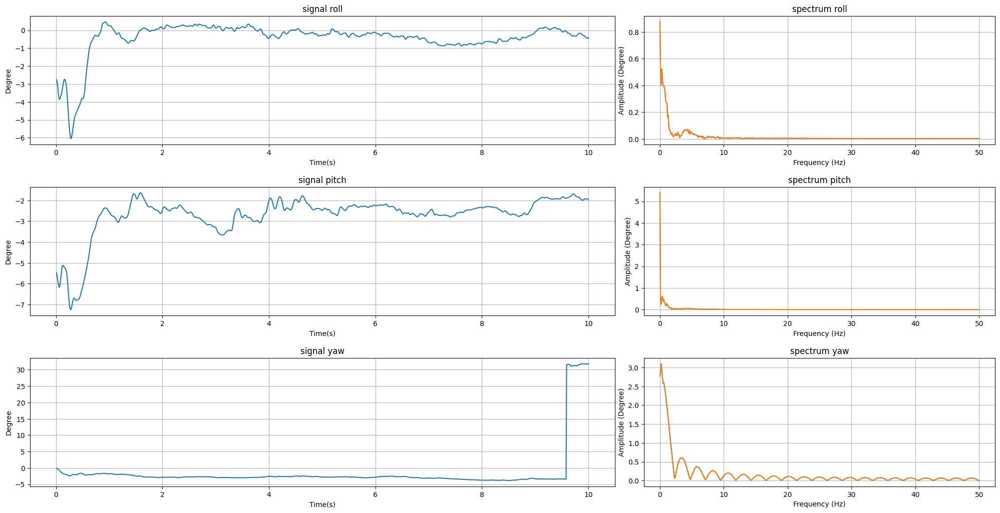

In [ ]:
df2 = encode('data/input2.txt', time_axis)

fourier2_roll = Fourier(df2['roll'], SAMPLING_RATE, DURATION)
fourier2_pitch = Fourier(df2['pitch'], SAMPLING_RATE, DURATION)
fourier2_yaw = Fourier(df2['yaw'], SAMPLING_RATE, DURATION)

print(predict(df2['roll'], SAMPLING_RATE, DURATION), predict(df2['pitch'], SAMPLING_RATE, DURATION), predict(df2['yaw'], SAMPLING_RATE, DURATION))


plot_compare_fourier([fourier2_roll, fourier2_pitch, fourier2_yaw],
                     ['roll', 'pitch', 'yaw'])

0 0 0


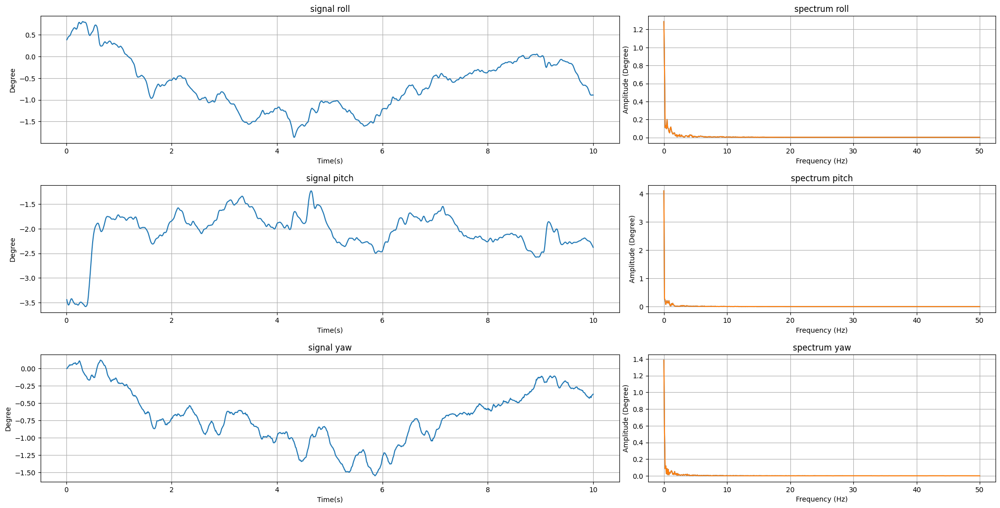

In [ ]:
df3 = encode('data/input3.txt', time_axis)

fourier3_roll = Fourier(df3['roll'], SAMPLING_RATE, DURATION)
fourier3_pitch = Fourier(df3['pitch'], SAMPLING_RATE, DURATION)
fourier3_yaw = Fourier(df3['yaw'], SAMPLING_RATE, DURATION)

print(predict(df3['roll'], SAMPLING_RATE, DURATION), predict(df3['pitch'], SAMPLING_RATE, DURATION), predict(df3['yaw'], SAMPLING_RATE, DURATION))


plot_compare_fourier([fourier3_roll, fourier3_pitch, fourier3_yaw],
                     ['roll', 'pitch', 'yaw'])

0 0 1


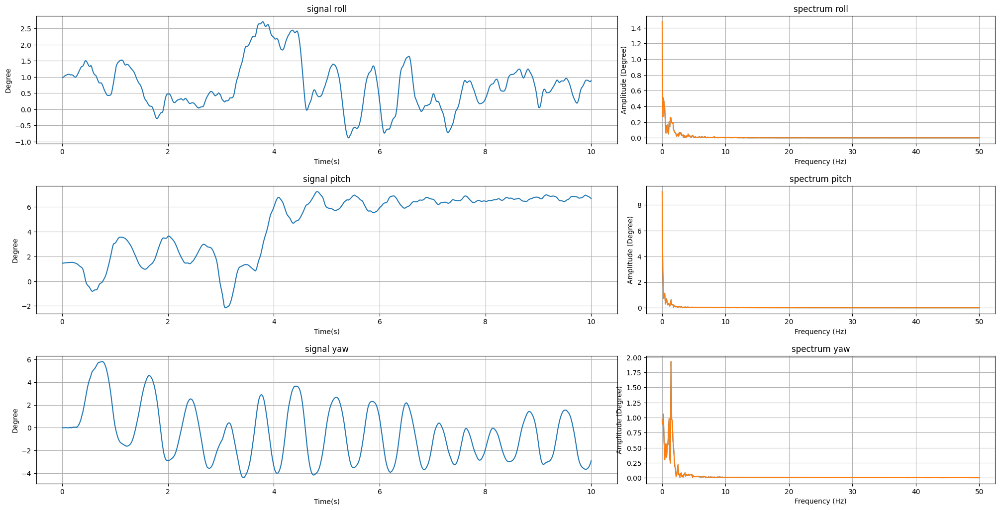

In [94]:
df4 = encode('data/input4.txt', time_axis)

fourier4_roll = Fourier(df4['roll'], SAMPLING_RATE, DURATION)
fourier4_pitch = Fourier(df4['pitch'], SAMPLING_RATE, DURATION)
fourier4_yaw = Fourier(df4['yaw'], SAMPLING_RATE, DURATION)

print(predict(df4['roll'], SAMPLING_RATE, DURATION), predict(df4['pitch'], SAMPLING_RATE, DURATION), predict(df4['yaw'], SAMPLING_RATE, DURATION))


plot_compare_fourier([fourier4_roll, fourier4_pitch, fourier4_yaw],
                     ['roll', 'pitch', 'yaw'])

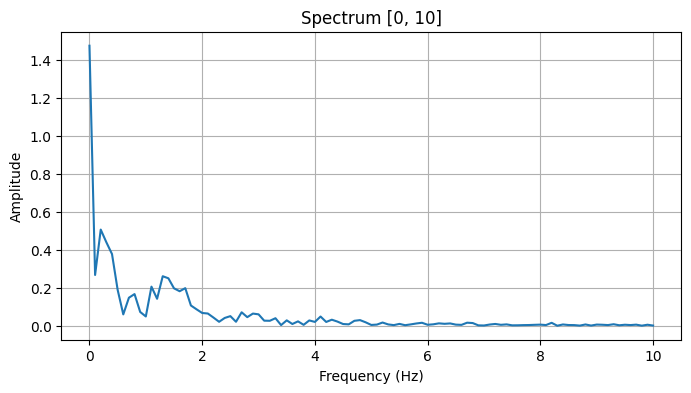

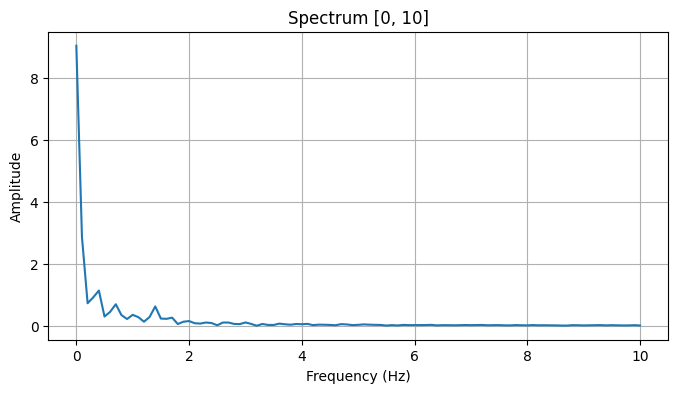

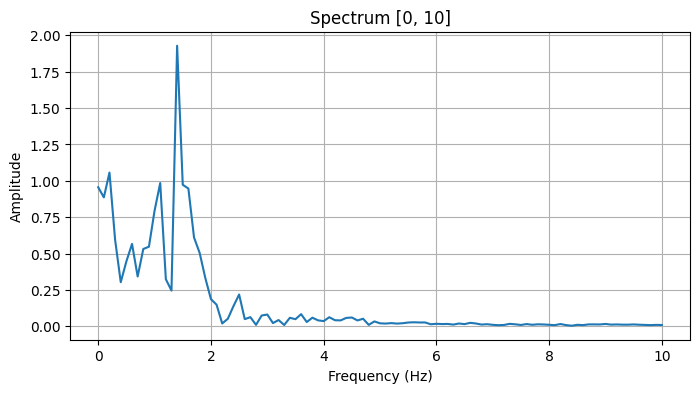

In [70]:
fourier4_roll.plot('spectrum', 0 , 10)
fourier4_pitch.plot('spectrum', 0 , 10)
fourier4_yaw.plot('spectrum', 0 , 10)

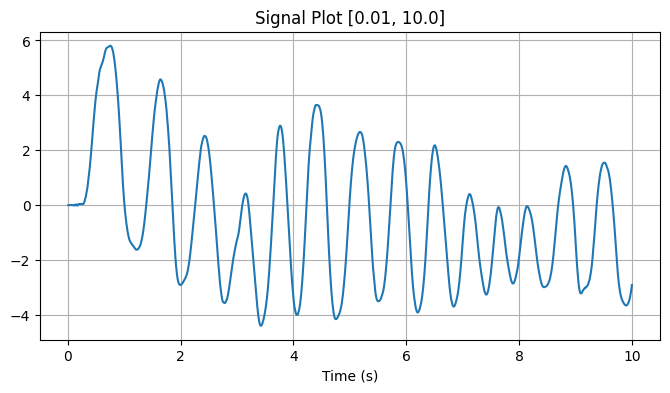

In [73]:
fourier4_yaw.plot('signal')

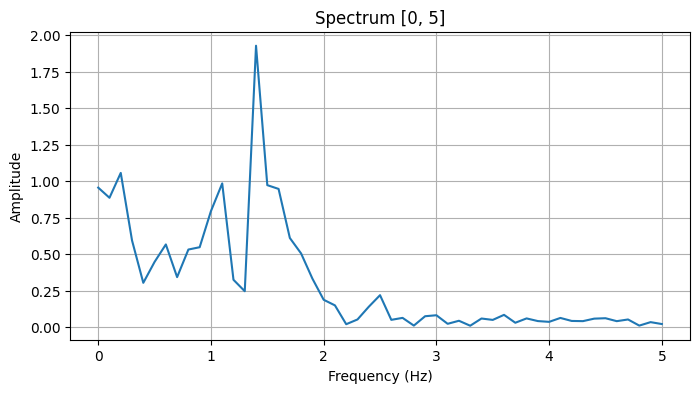

In [71]:
fourier4_yaw.plot('spectrum', 0 , 5)

1 0 1


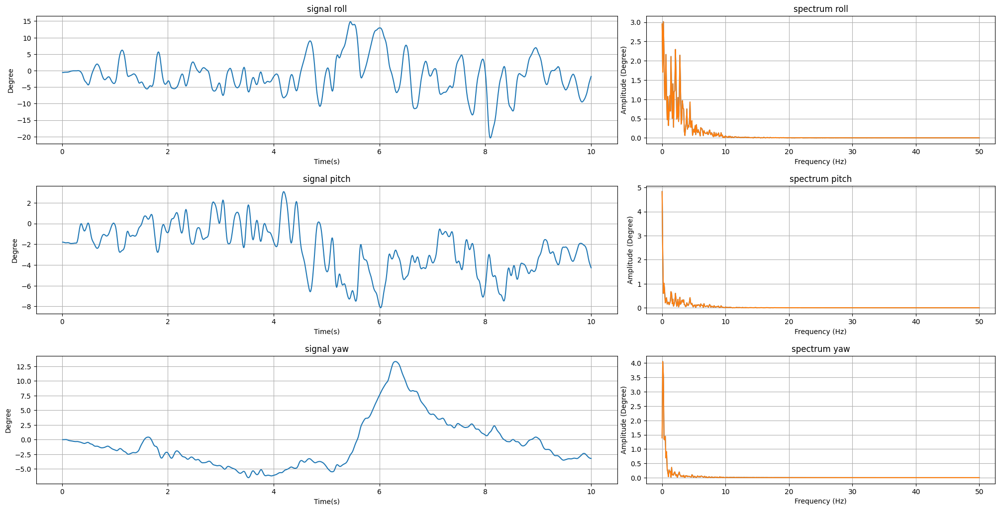

In [47]:
df5 = encode('data/input5.txt', time_axis)

fourier5_roll = Fourier(df5['roll'], SAMPLING_RATE, DURATION)
fourier5_pitch = Fourier(df5['pitch'], SAMPLING_RATE, DURATION)
fourier5_yaw = Fourier(df5['yaw'], SAMPLING_RATE, DURATION)

print(predict(df5['roll'], SAMPLING_RATE, DURATION), predict(df5['pitch'], SAMPLING_RATE, DURATION), predict(df5['yaw'], SAMPLING_RATE, DURATION))

plot_compare_fourier([fourier5_roll, fourier5_pitch, fourier5_yaw],
                     ['roll', 'pitch', 'yaw'])

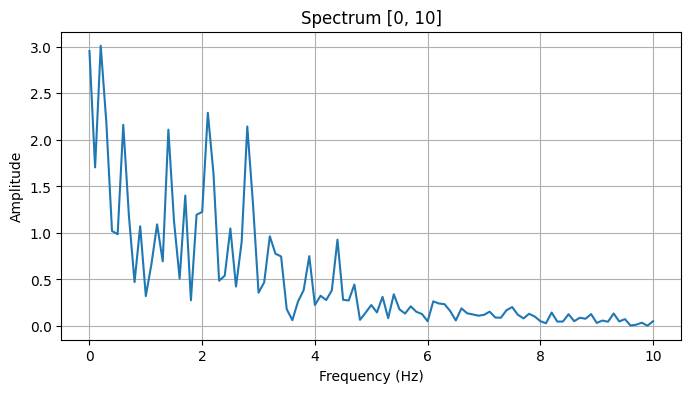

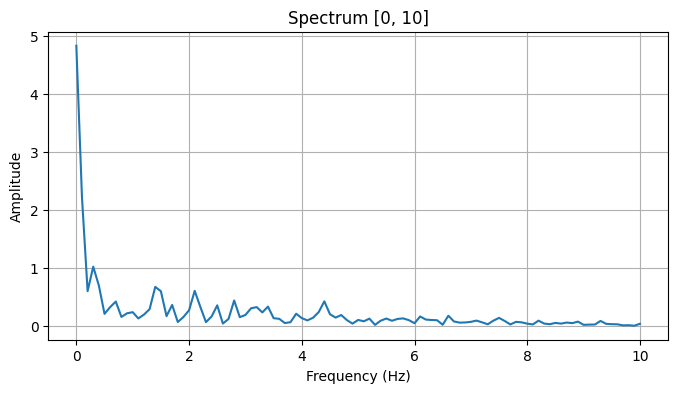

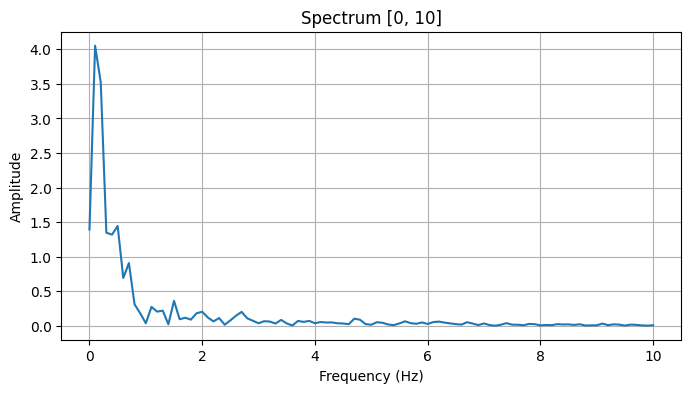

In [48]:
fourier5_roll.plot('spectrum', 0 , 10)
fourier5_pitch.plot('spectrum', 0 , 10)
fourier5_yaw.plot('spectrum', 0 , 10)

0 2 1


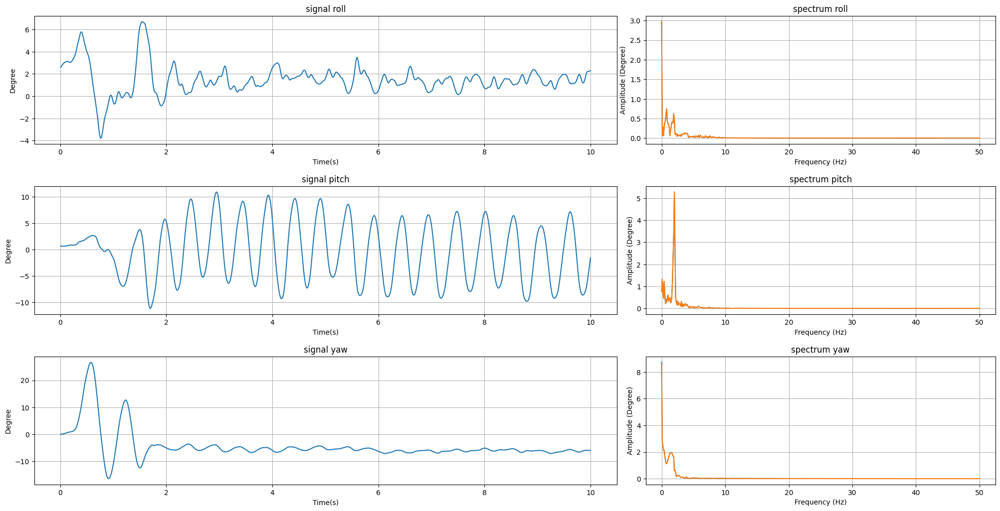

In [49]:
df6 = encode('data/input6.txt', time_axis)

fourier6_roll = Fourier(df6['roll'], SAMPLING_RATE, DURATION)
fourier6_pitch = Fourier(df6['pitch'], SAMPLING_RATE, DURATION)
fourier6_yaw = Fourier(df6['yaw'], SAMPLING_RATE, DURATION)

print(predict(df6['roll'], SAMPLING_RATE, DURATION), predict(df6['pitch'], SAMPLING_RATE, DURATION), predict(df6['yaw'], SAMPLING_RATE, DURATION))

plot_compare_fourier([fourier6_roll, fourier6_pitch, fourier6_yaw],
                     ['roll', 'pitch', 'yaw'])

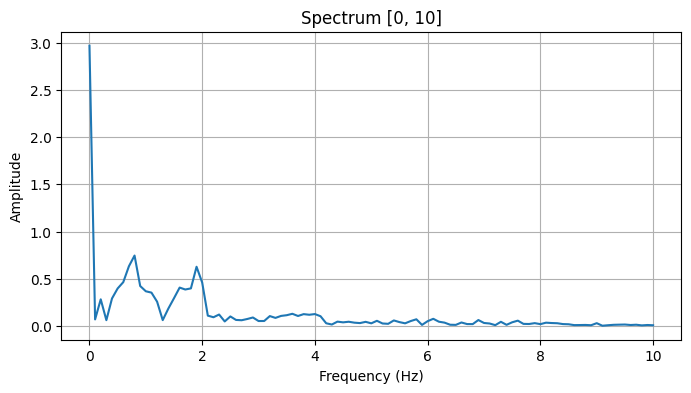

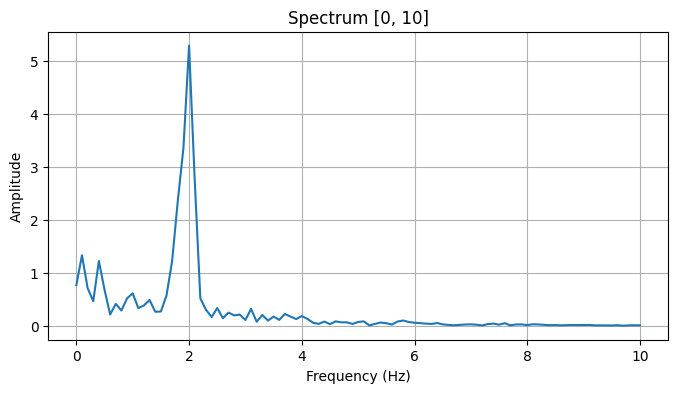

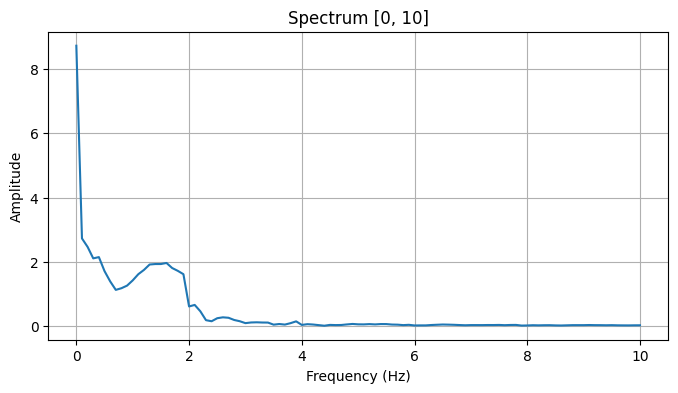

In [51]:
fourier6_roll.plot('spectrum', 0 , 10)
fourier6_pitch.plot('spectrum', 0 , 10)
fourier6_yaw.plot('spectrum', 0 , 10)

0 2 0


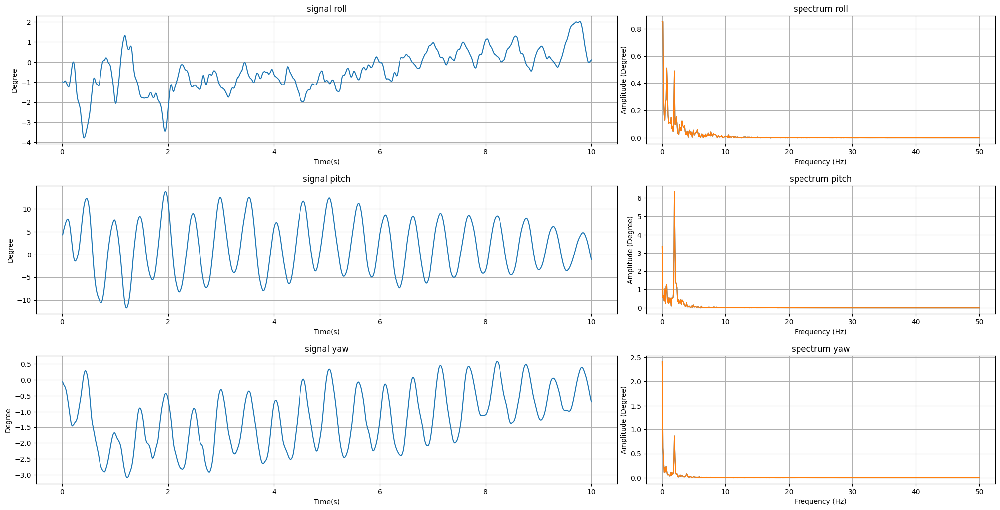

In [52]:
df7 = encode('data/input7.txt', time_axis)

fourier7_roll = Fourier(df7['roll'], SAMPLING_RATE, DURATION)
fourier7_pitch = Fourier(df7['pitch'], SAMPLING_RATE, DURATION)
fourier7_yaw = Fourier(df7['yaw'], SAMPLING_RATE, DURATION)

print(predict(df7['roll'], SAMPLING_RATE, DURATION), predict(df7['pitch'], SAMPLING_RATE, DURATION), predict(df7['yaw'], SAMPLING_RATE, DURATION))

plot_compare_fourier([fourier7_roll, fourier7_pitch, fourier7_yaw],
                     ['roll', 'pitch', 'yaw'])

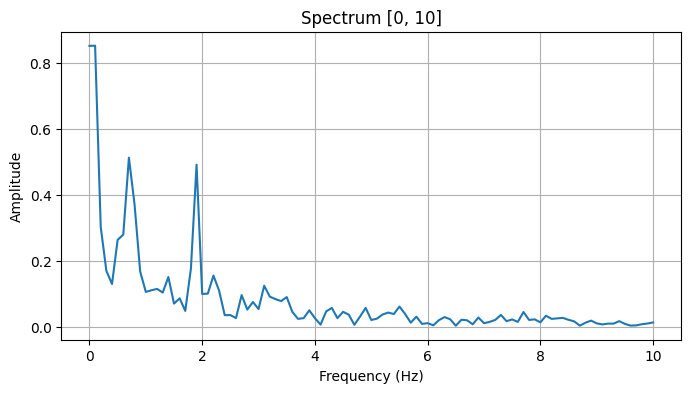

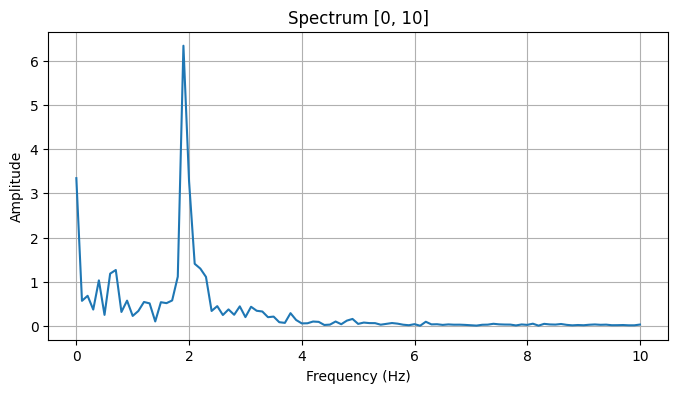

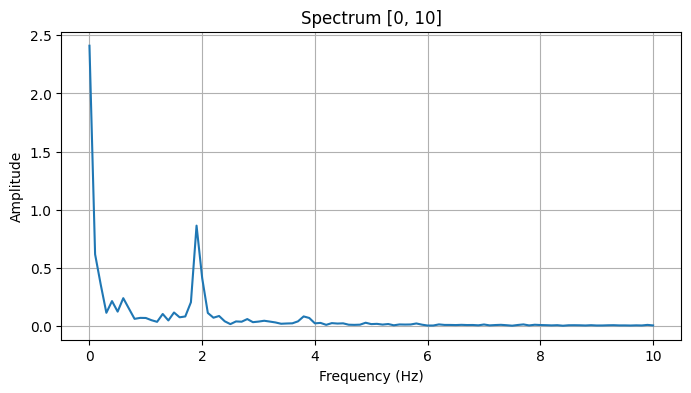

In [54]:
fourier7_roll.plot('spectrum', 0 , 10)
fourier7_pitch.plot('spectrum', 0 , 10)
fourier7_yaw.plot('spectrum', 0 , 10)

1 0 1


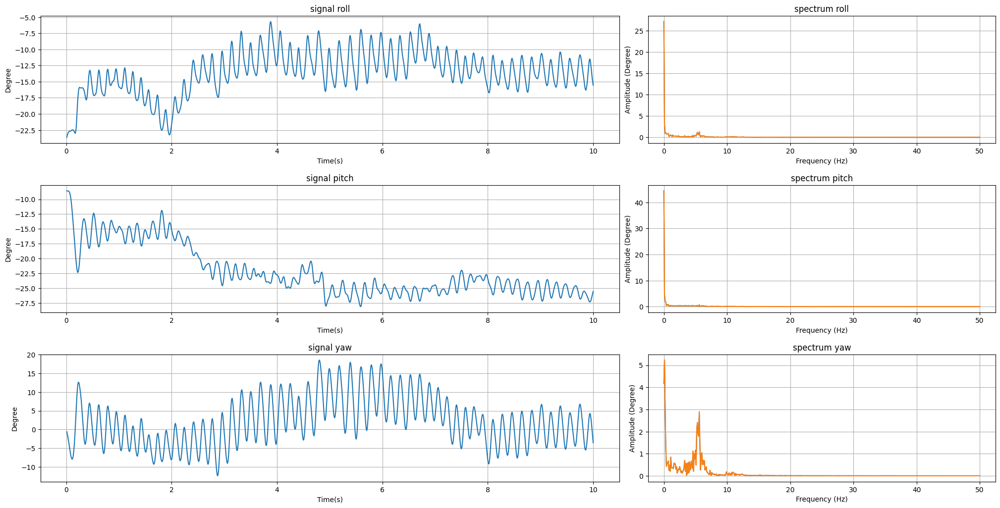

In [87]:
df8 = encode('data/input8.txt', time_axis)

fourier8_roll = Fourier(df8['roll'], SAMPLING_RATE, DURATION)
fourier8_pitch = Fourier(df8['pitch'], SAMPLING_RATE, DURATION)
fourier8_yaw = Fourier(df8['yaw'], SAMPLING_RATE, DURATION)

print(predict(df8['roll'], SAMPLING_RATE, DURATION), predict(df8['pitch'], SAMPLING_RATE, DURATION), predict(df8['yaw'], SAMPLING_RATE, DURATION))

plot_compare_fourier([fourier8_roll, fourier8_pitch, fourier8_yaw],
                     ['roll', 'pitch', 'yaw'])

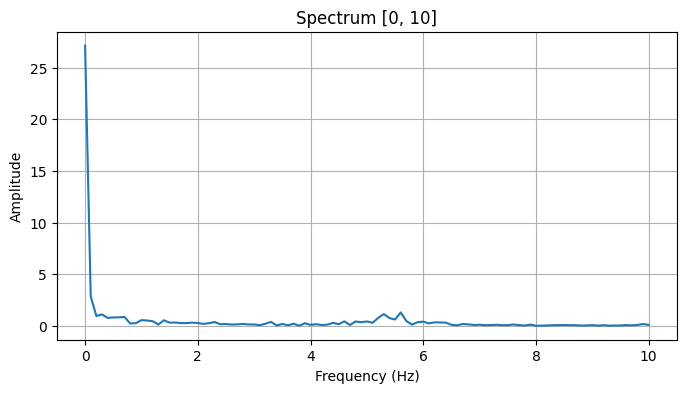

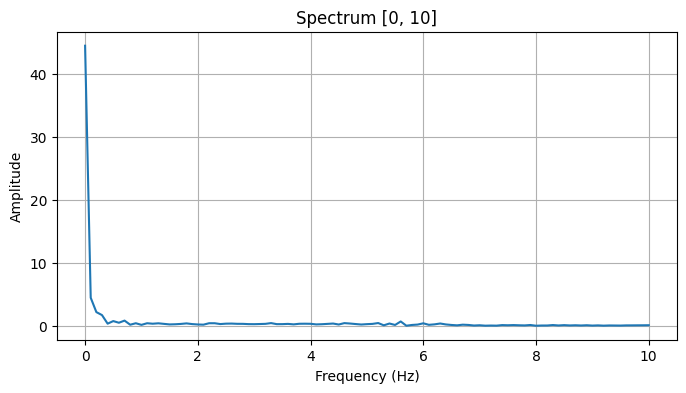

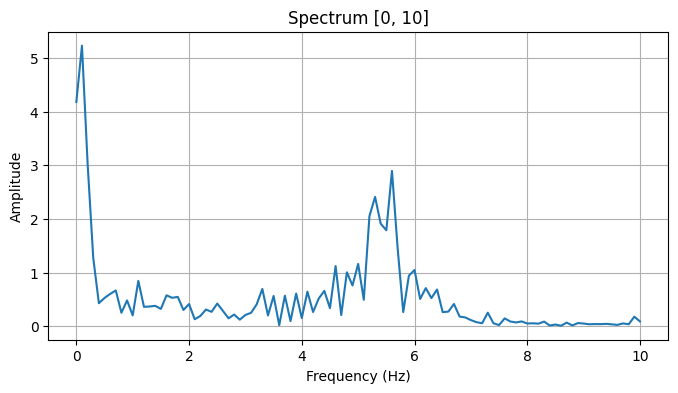

In [88]:
fourier8_roll.plot('spectrum', 0 , 10)
fourier8_pitch.plot('spectrum', 0 , 10)
fourier8_yaw.plot('spectrum', 0 , 10)

0 0 0


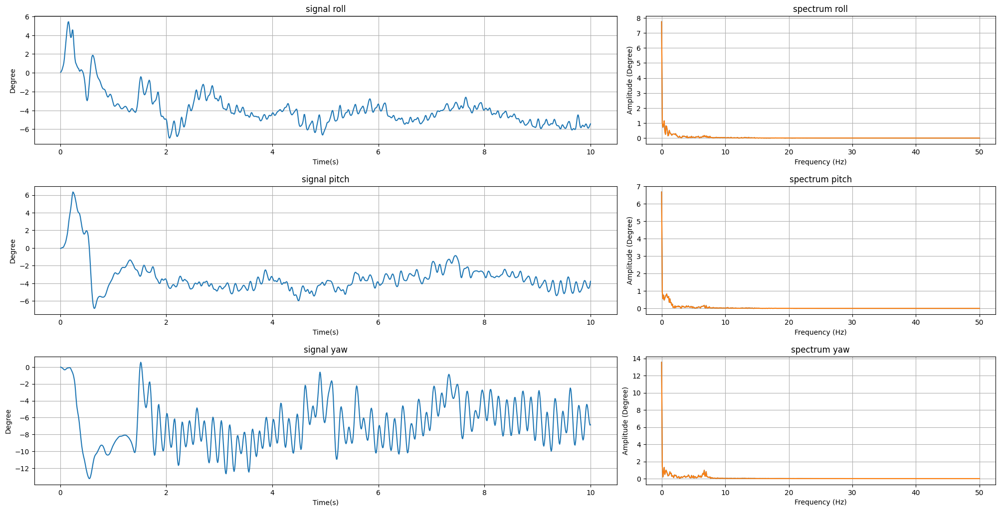

In [89]:
df9 = encode('data/input9.txt', time_axis)

fourier9_roll = Fourier(df9['roll'], SAMPLING_RATE, DURATION)
fourier9_pitch = Fourier(df9['pitch'], SAMPLING_RATE, DURATION)
fourier9_yaw = Fourier(df9['yaw'], SAMPLING_RATE, DURATION)

print(predict(df9['roll'], SAMPLING_RATE, DURATION), predict(df9['pitch'], SAMPLING_RATE, DURATION), predict(df9['yaw'], SAMPLING_RATE, DURATION))

plot_compare_fourier([fourier9_roll, fourier9_pitch, fourier9_yaw],
                     ['roll', 'pitch', 'yaw'])

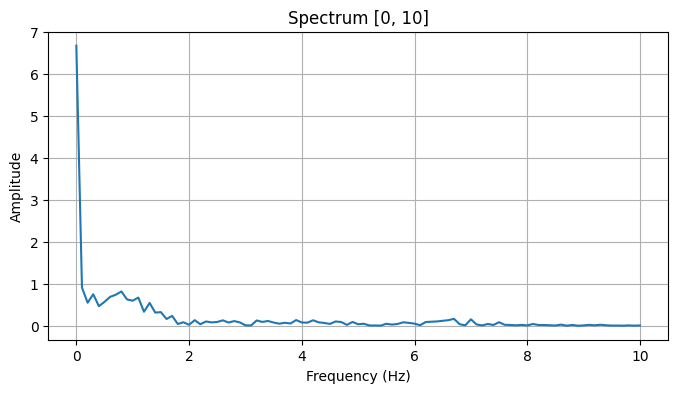

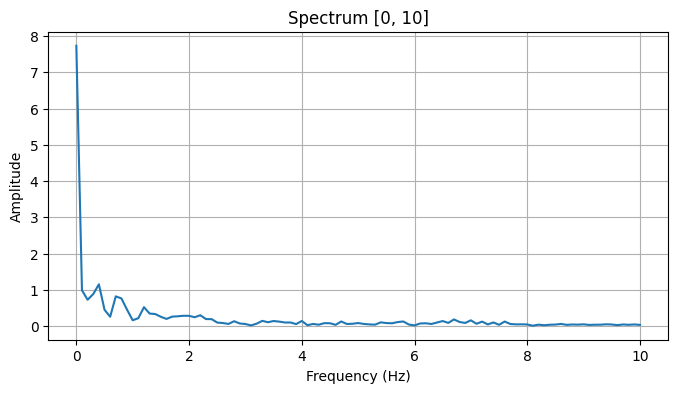

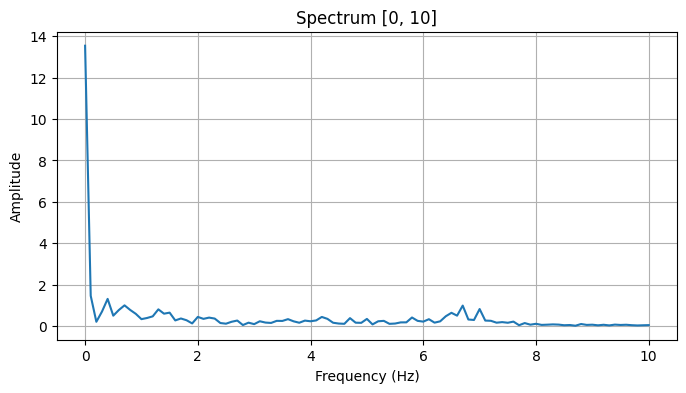

In [90]:
fourier9_pitch.plot('spectrum', 0 , 10)
fourier9_roll.plot('spectrum', 0 , 10)
fourier9_yaw.plot('spectrum', 0 , 10)

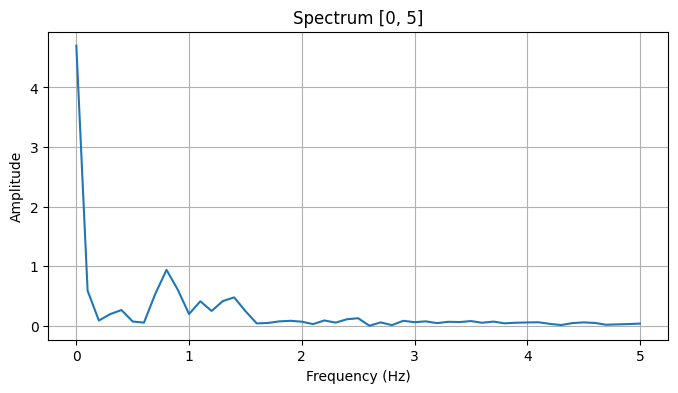

In [68]:
fourier9_yaw.plot('spectrum', 0 , 5)

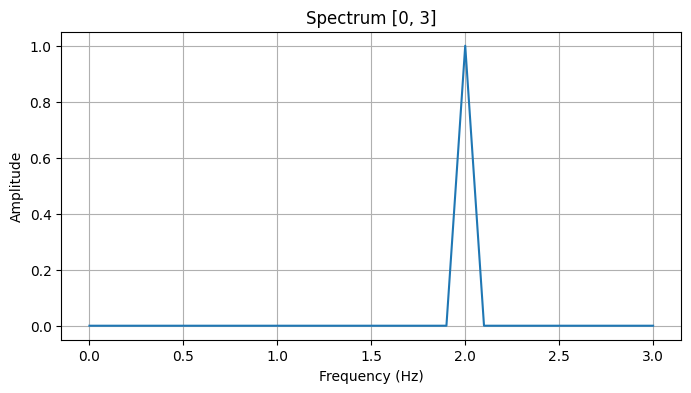

In [67]:
signal_2hz = Signal(1, 2)
sine_2hz =signal_2hz.sine()
fourier_sin_2hz = Fourier(sine_2hz, SAMPLING_RATE, DURATION)
fourier_sin_2hz.plot('spectrum', 0 , 3)

0 0 0


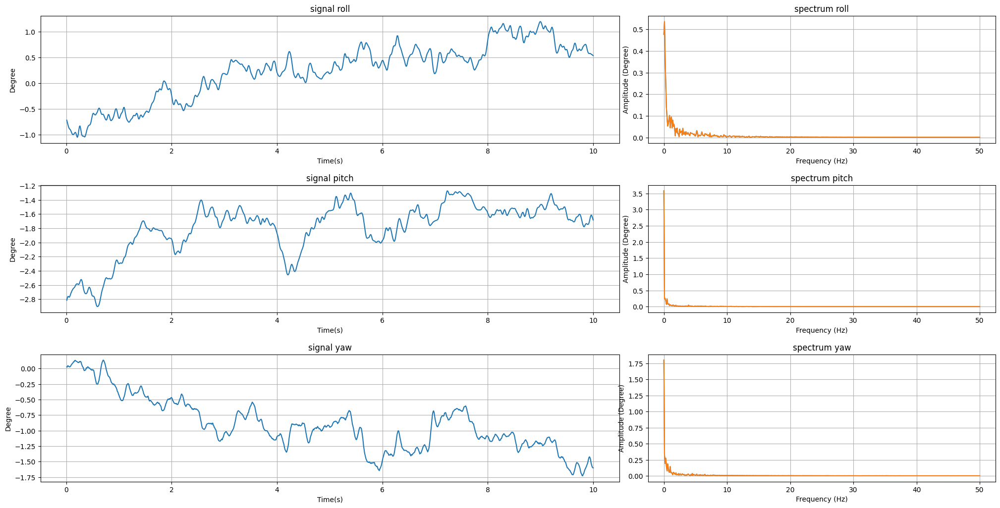

In [84]:
df10  = encode('data/input10.txt', time_axis)

fourier10_roll = Fourier(df10['roll'], SAMPLING_RATE, DURATION)
fourier10_pitch = Fourier(df10['pitch'], SAMPLING_RATE, DURATION)
fourier10_yaw = Fourier(df10['yaw'], SAMPLING_RATE, DURATION)

print(predict(df10['roll'], SAMPLING_RATE, DURATION), predict(df10['pitch'], SAMPLING_RATE, DURATION), predict(df10['yaw'], SAMPLING_RATE, DURATION))

plot_compare_fourier([fourier10_roll, fourier10_pitch, fourier10_yaw],
                     ['roll', 'pitch', 'yaw'])

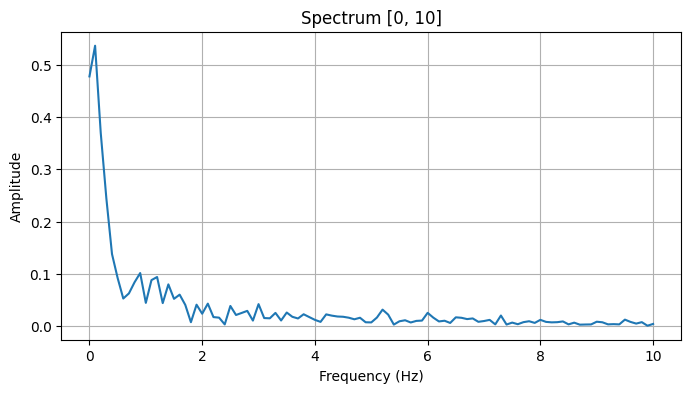

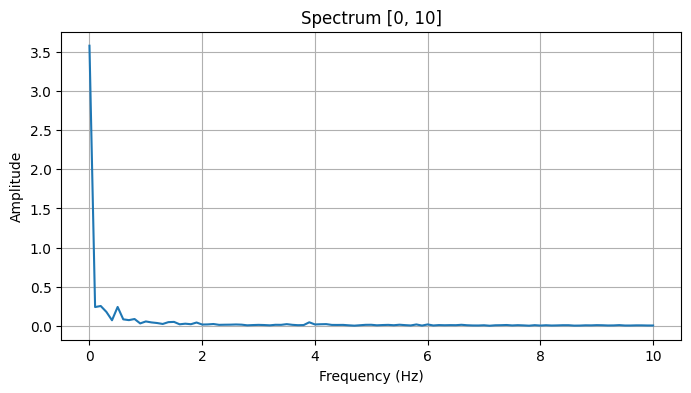

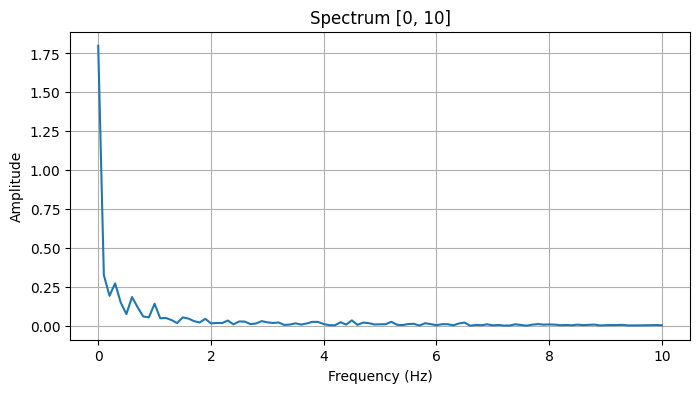

In [85]:
fourier10_roll.plot('spectrum', 0 , 10)
fourier10_pitch.plot('spectrum', 0 , 10)
fourier10_yaw.plot('spectrum', 0 , 10)

2 2 2


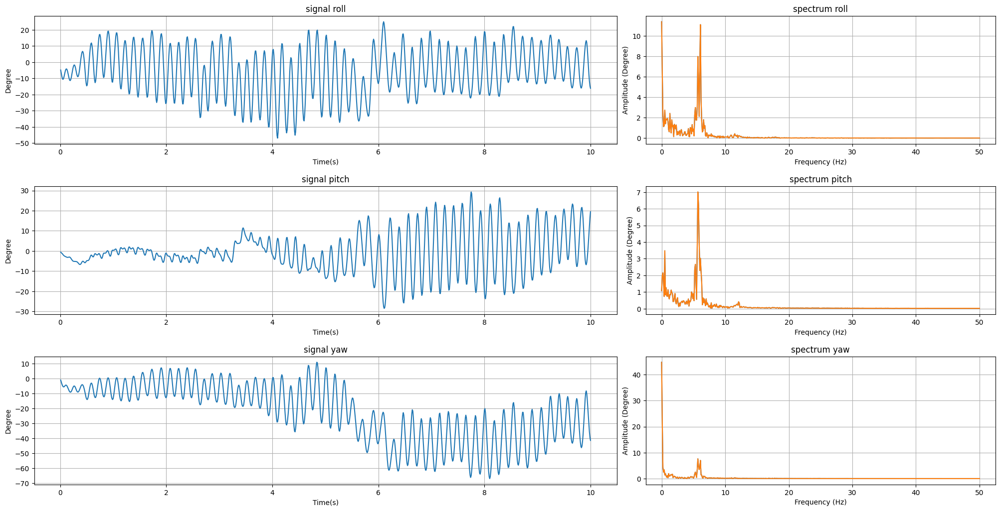

In [74]:
df11 = encode('data/input11.txt', time_axis)

fourier11_roll = Fourier(df11['roll'], SAMPLING_RATE, DURATION)
fourier11_pitch = Fourier(df11['pitch'], SAMPLING_RATE, DURATION)
fourier11_yaw = Fourier(df11['yaw'], SAMPLING_RATE, DURATION)

print(predict(df11['roll'], SAMPLING_RATE, DURATION), predict(df11['pitch'], SAMPLING_RATE, DURATION), predict(df11['yaw'], SAMPLING_RATE, DURATION))

plot_compare_fourier([fourier11_roll, fourier11_pitch, fourier11_yaw],
                     ['roll', 'pitch', 'yaw'])

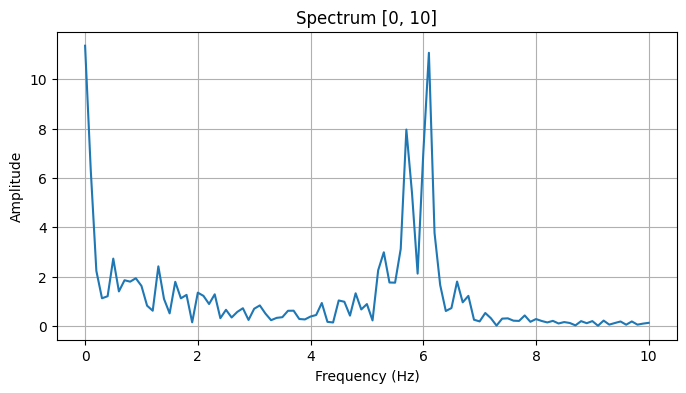

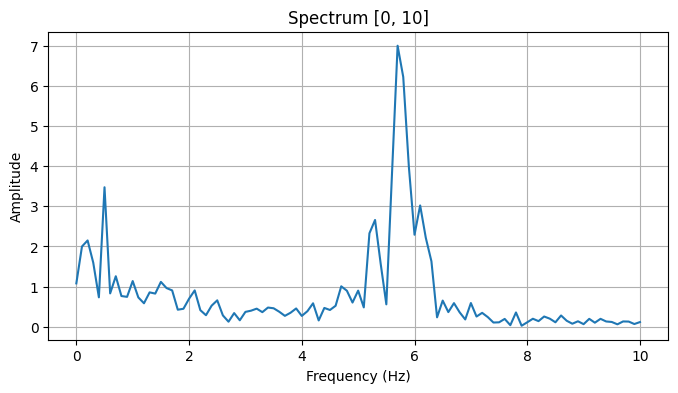

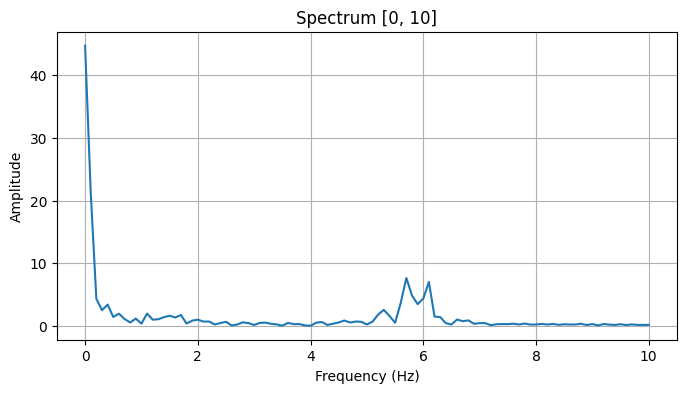

In [76]:
fourier11_roll.plot('spectrum', 0 , 10)
fourier11_pitch.plot('spectrum', 0 , 10)
fourier11_yaw.plot('spectrum', 0 , 10)

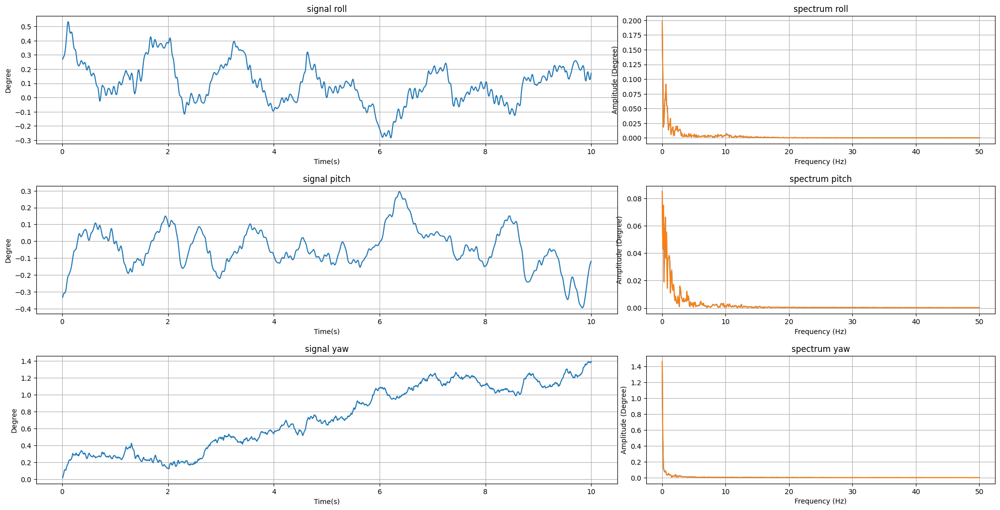

In [82]:
df12 = encode('data/input12.txt', time_axis)

fourier12_roll = Fourier(df12['roll'], SAMPLING_RATE, DURATION)
fourier12_pitch = Fourier(df12['pitch'], SAMPLING_RATE, DURATION)
fourier12_yaw = Fourier(df12['yaw'], SAMPLING_RATE, DURATION)

plot_compare_fourier([fourier12_roll, fourier12_pitch, fourier12_yaw],
                     ['roll', 'pitch', 'yaw'])

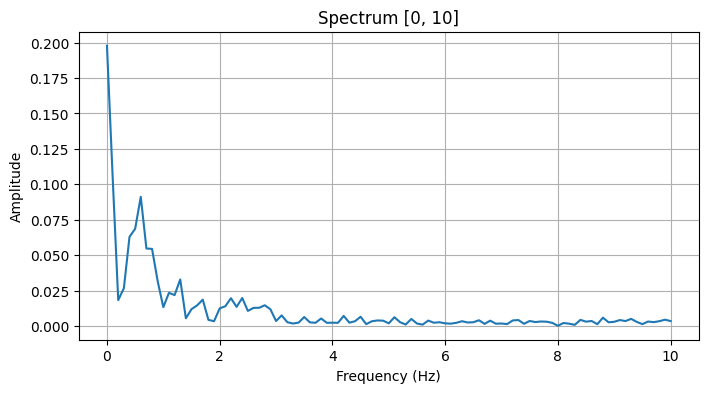

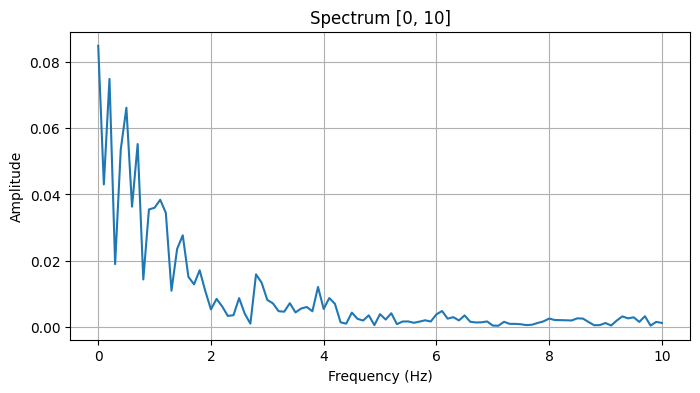

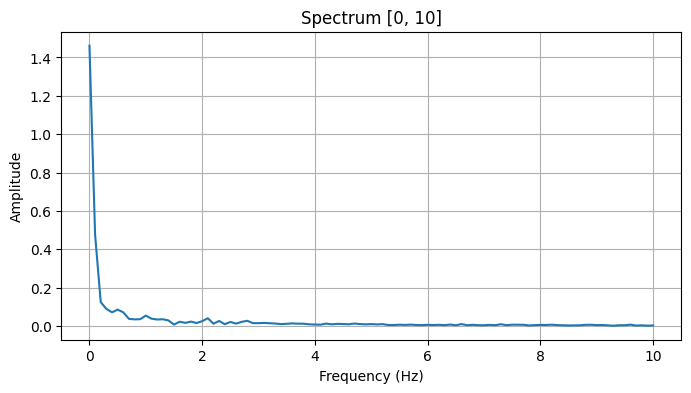

In [83]:
fourier12_roll.plot('spectrum', 0 , 10)
fourier12_pitch.plot('spectrum', 0 , 10)
fourier12_yaw.plot('spectrum', 0 , 10)